<a href="https://colab.research.google.com/github/AndreiAf02/Transfer_Learning_Fine_Tuning_Update/blob/main/Diabetes_Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Fine-Tuning for Predicting Heart Disease Risk based on Diabetes Risk:

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from time import perf_counter



from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# !pip install pytorch-tabnet

# from pytorch_tabnet.tab_model import TabNetClassifier
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay



## Data taken from the UCI Machine Learning repository [here](https://doi.org/10.24432/C53919):

In [3]:
pip install ucimlrepo

In [4]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
cdc_diabetes_health_indicators = fetch_ucirepo(id=891)



In [5]:
data = cdc_diabetes_health_indicators.data
# data (as pandas dataframes)
X = data.features
y = data.targets

# metadata
print(cdc_diabetes_health_indicators.metadata)

# variable information
print(cdc_diabetes_health_indicators.variables)

{'uci_id': 891, 'name': 'CDC Diabetes Health Indicators', 'repository_url': 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators', 'data_url': 'https://archive.ics.uci.edu/static/public/891/data.csv', 'abstract': 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy. ', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular', 'Multivariate'], 'num_instances': 253680, 'num_features': 21, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Sex', 'Age', 'Education Level', 'Income'], 'target_col': ['Diabetes_binary'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_

In [6]:
X.iloc[:,6]

,HeartDiseaseorAttack
0,0
1,0
2,0
3,0
4,0
...,...
253675,0
253676,0
253677,0
253678,0


In [7]:
## Scaling the predictive data

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [8]:
data2 = pd.concat([X_scaled, y], axis=1)
data2

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,Diabetes_binary
0,1.0,1.0,1.0,0.325581,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.00,0.6,0.500000,1.0,0.0,0.666667,0.6,0.285714,0
1,0.0,0.0,0.0,0.151163,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.50,0.0,0.000000,0.0,0.0,0.500000,1.0,0.000000,0
2,1.0,1.0,1.0,0.186047,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.00,1.0,1.000000,1.0,0.0,0.666667,0.6,1.000000,0
3,1.0,0.0,1.0,0.174419,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.25,0.0,0.000000,0.0,0.0,0.833333,0.4,0.714286,0
4,1.0,1.0,1.0,0.139535,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.25,0.1,0.000000,0.0,0.0,0.833333,0.8,0.428571,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1.0,1.0,1.0,0.383721,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.50,0.0,0.166667,0.0,1.0,0.333333,1.0,0.857143,0
253676,1.0,1.0,1.0,0.069767,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.75,0.0,0.000000,1.0,0.0,0.833333,0.2,0.428571,1
253677,0.0,0.0,1.0,0.186047,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.00,0.0,0.000000,0.0,0.0,0.083333,0.8,0.142857,0
253678,1.0,0.0,1.0,0.127907,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.50,0.0,0.000000,0.0,1.0,0.500000,0.8,0.000000,0


In [9]:
y.value_counts()

,count
Diabetes_binary,
0,218334
1,35346


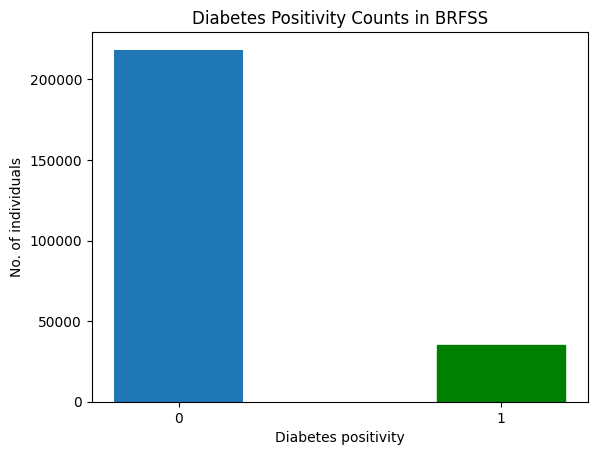

In [10]:
barlist = plt.bar([str(0),str(1)], y.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS")
plt.show()

# Splitting for Source and Target Domains:


# Full Dataset:

For the Heart Disease prediction, we split the dataset between low education level (**now including high-school dropouts**) and the high education level. The high-education data (with diabetes as response variable/label) becomes the source data and the low-education data (with Heart Disease as response variable/label) is the target data.

In [11]:
data_S = data2[data2[19] >= 0.5]  ## Source domain and classification
data_S_X = data_S.drop(data_S.columns[[6, 21]], axis=1)
data_S_y = data_S.iloc[:, 21]    ## Response variable of interest is Diabetes

data_S_full = pd.concat([data_S_X, data_S_y], axis=1)

data_T = data2[data2[19] < 0.5]

data_T_X = data_T.drop(data_T.columns[[6, 21]], axis=1)
data_T_y = data_T.iloc[:, 6]    ## Response variable of interest in Heart Disease

data_T_full = pd.concat([data_T_X, data_T_y], axis=1)

In [12]:
data_T_full

,0,1,2,3,4,5,7,8,9,10,...,12,13,14,15,16,17,18,19,20,6
3,1.0,0.0,1.0,0.174419,0.0,0.0,1.0,1.0,1.0,0.0,...,0.0,0.25,0.0,0.000000,0.0,0.0,0.833333,0.4,0.714286,0.0
21,1.0,1.0,1.0,0.302326,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.00,0.5,1.000000,1.0,0.0,1.000000,0.2,0.285714,0.0
27,1.0,1.0,1.0,0.186047,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.75,0.0,0.000000,0.0,1.0,0.916667,0.2,0.428571,1.0
31,1.0,0.0,1.0,0.244186,1.0,0.0,1.0,1.0,1.0,0.0,...,0.0,0.00,0.0,0.000000,1.0,1.0,1.000000,0.4,0.285714,0.0
34,1.0,1.0,1.0,0.139535,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.25,0.0,0.000000,0.0,0.0,0.916667,0.4,0.285714,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253668,0.0,1.0,1.0,0.197674,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.25,0.0,0.000000,1.0,1.0,0.750000,0.4,0.714286,1.0
253669,0.0,1.0,1.0,0.174419,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.00,0.0,0.100000,0.0,1.0,0.416667,0.2,0.428571,0.0
253671,1.0,1.0,1.0,0.127907,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.75,0.0,0.166667,0.0,1.0,0.583333,0.4,0.142857,1.0
253672,1.0,0.0,1.0,0.209302,1.0,0.0,1.0,1.0,1.0,0.0,...,0.0,0.50,0.0,0.000000,0.0,1.0,0.916667,0.2,0.000000,1.0


## Source domain and task labels:

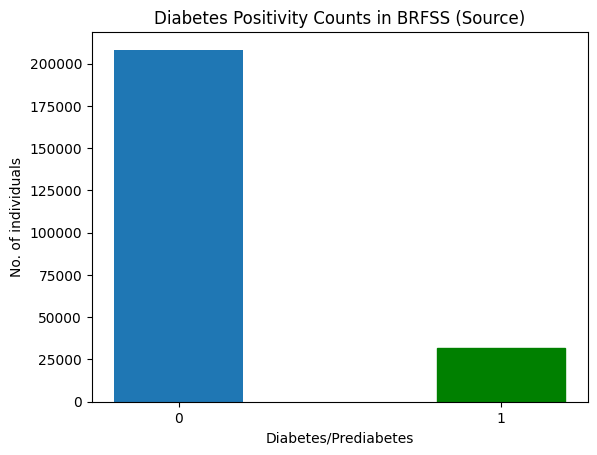

In [13]:
barlist_S = plt.bar([str(0),str(1)], data_S_y.value_counts(), width = 0.4)
barlist_S[1].set_color('g')

plt.xlabel("Diabetes/Prediabetes")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Source)")
plt.show()

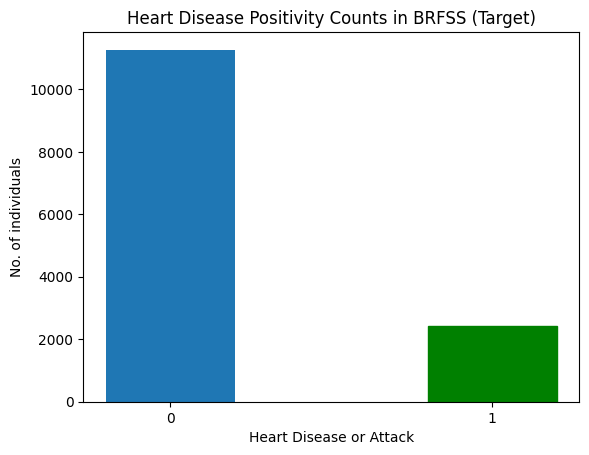

In [14]:
barlist_T = plt.bar([str(0),str(1)], data_T_y.value_counts(), width = 0.4)
barlist_T[1].set_color('g')

plt.xlabel("Heart Disease or Attack")
plt.ylabel("No. of individuals")
plt.title("Heart Disease Positivity Counts in BRFSS (Target)")
plt.show()

## DNN and Fine-tuning Algorithms:

In [15]:
def create_dnn_model(input_shape):
  model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
    ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

  model.summary()
  print(len(model.layers))

  return model

# def create_dnn_model(input_shape):
#   model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
#         layers.Dense(32, activation='relu'),
#         layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
#     ])

#   model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

#   return model



def train_and_evaluate(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    model.save('model.h5')
    model.save_weights('model_wt.weights.h5')

    return model


In [16]:
def train_and_evaluate_nosave(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])

    print(fpr)
    print(fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    return fpr, fnr


In [17]:
def fine_tuning(X_train, X_test, y_train, y_test, llim, ulim):
    new_model = create_dnn_model(X_S_train.shape[1])
    # new_model = tf.keras.models.load_model('model.h5')
    new_model.load_weights('model_wt.weights.h5')

    for layer in new_model.layers[llim:ulim]:
        layer.trainable = False
    for layer in new_model.layers[-1:]:
        layer.trainable = False

    for layer in new_model.layers:
        if layer.trainable == True:
          print("Trainable")
        else:
          print("Not Trainable")

    fpr, fnr = train_and_evaluate_nosave(new_model, X_train, X_test, y_train, y_test, "Target")
    return fpr, fnr

In [18]:
def Transductive_TL(model, X_test, y_test, domain):

    time_start = perf_counter()

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    # print('Confusion matrix:', conf_matrix)
    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    tnr = 1-fpr

    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])
    tpr = 1 - fnr
    print('FPR', fpr, 'TPR:', tpr, 'FNR:', fnr, 'TNR:', tnr)
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")
    print('False Negative Rate:', fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

# Over/undersampling functions:

## Undersampling functions:

In [19]:
import random

def SRS_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=False)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :20]
    y_SRS = data_SRS_RUS.iloc[:, 20]

    return X_SRS, y_SRS


def SRSwR_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=True)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :20]
    y_SRS = data_SRS_RUS.iloc[:, 20]

    return X_SRS, y_SRS


def systematic_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.randint(1, int(k))
    print(start)
    Row = []
    for i in range(undersample_size):
      row = start+int(k*i)-1
      Row.append(row)
    # print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :20]
    y_Sy = data_Sy_RUS.iloc[:, 20]

    return X_Sy, y_Sy



def multi_systematic_undersampler(data, data_column, m):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.sample(range(1, int(k*m)), m)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/m)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    # print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :20]
    y_Sy = data_Sy_RUS.iloc[:, 20]

    return X_Sy, y_Sy

## Oversampling functions:

In [20]:
def SRSwR_oversampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_min_ros = data_minority.sample(n=oversample_size - undersample_size, replace=True)
    data_SRS_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_SRS = data_SRS_ROS.iloc[:, :20]
    y_SRS = data_SRS_ROS.iloc[:, 20]

    return X_SRS, y_SRS

# data_S_min_ros = data_S_minority.sample(n=oversample_size - undersample_size, replace=True)


def systematic_resampler(data, data_column, k):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    Nsamples = k*(oversample_size-undersample_size)/undersample_size
    print('Nsamples=', Nsamples)

    np.random.seed(123)
    start = np.random.choice(int(k), int(Nsamples), replace=True)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/k)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    data_min_ros = pd.DataFrame()
    data_min_ros = data_minority.iloc[Row]

    data_Sy_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_Sy = data_Sy_ROS.iloc[:, :20]
    y_Sy = data_Sy_ROS.iloc[:, 20]

    return X_Sy, y_Sy


In [21]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(data_S_X, data_S_y, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)

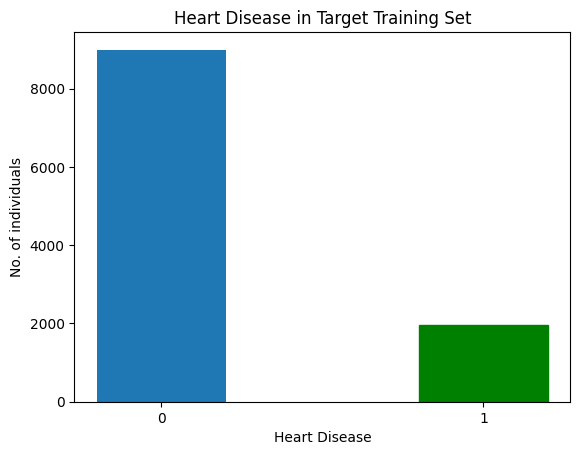

In [22]:
barlist = plt.bar([str(0),str(1)], y_T_train.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Heart Disease")
plt.ylabel("No. of individuals")
plt.title("Heart Disease in Target Training Set")
plt.show()

In [23]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (191988, 20)
y_S_train: (191988,)
X_S_test: (47997, 20)
y_S_test: (47997,)


# Original (Imbalanced) dataset:

## Standard Machine Learning:

## With Transfer Learning:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 23s 4ms/step - AUC: 0.7785 - loss: 0.3305 - val_AUC: 0.8213 - val_loss: 0.3156
Epoch 2/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - AUC: 0.8168 - loss: 0.3081 - val_AUC: 0.8223 - val_loss: 0.3139
Epoch 3/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 17s 4ms/step - AUC: 0.8248 - loss: 0.3045 - val_AUC: 0.8242 - val_loss: 0.3174
Epoch 4/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - AUC: 0.8250 - loss: 0.3047 - val_AUC: 0.8239 - val_loss: 0.3168
Epoch 5/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - AUC: 0.8271 - loss: 0.3045 - val_AUC: 0.8256 - val_loss: 0.3112
Epoch 6/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - AUC: 0.8293 - loss: 0.3016 - val_AUC: 0.8256 - val_loss: 0.3107
Epoch 7/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - AUC: 0.8293 - loss: 0.2977 - val_AUC: 0.8257 - val_loss: 0.3116
Epoch 8/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - AUC: 0.8267 - loss: 0.3020 - val_AUC: 0.8254 - val_loss: 0.3114
Epoch 9/10
4800/4800 ━━━━━━━━━

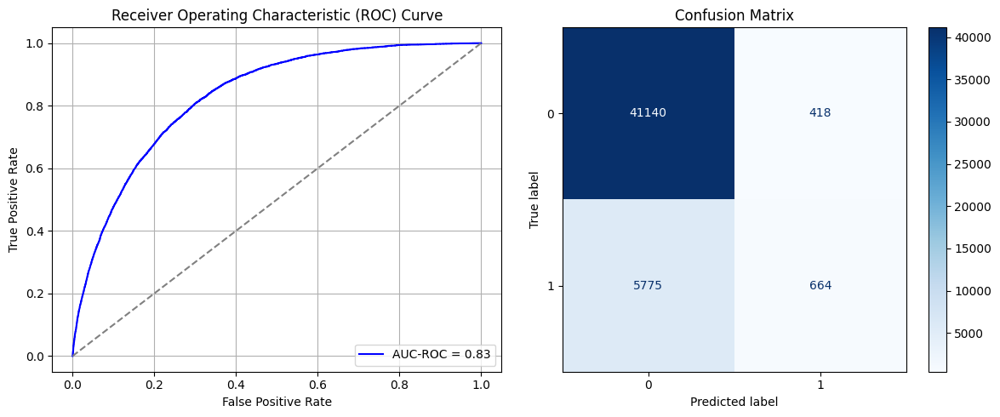

Best threshold based on F1-score: 0.2099606841802597
Time elapsed (performance): 199.77596697399986


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7049 - loss: 0.4379 - val_AUC: 0.6874 - val_loss: 0.4468
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7194 - loss: 0.4236 - val_AUC: 0.6872 - val_loss: 0.4446
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7086 - loss: 0.4266 - val_AUC: 0.6873 - val_loss: 0.4441
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7098 - loss: 0.4282 - val_AUC: 0.6874 - val_loss: 0.4440
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7090 - loss: 0.4250 - val_AUC: 0.6877 - val_loss: 0.4434
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7097 - loss: 0.4191 - val_AUC: 0.6875 - val_loss: 0.4434
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7093 - loss: 0.4260 - val_AUC: 0.6877 - val_loss: 0.4447
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7122 - loss: 0.4229 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7208 - loss: 0.4270 - val_AUC: 0.6873 - val_loss: 0.4471
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7094 - loss: 0.4235 - val_AUC: 0.6872 - val_loss: 0.4452
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7127 - loss: 0.4195 - val_AUC: 0.6873 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7099 - loss: 0.4239 - val_AUC: 0.6875 - val_loss: 0.4441
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7144 - loss: 0.4281 - val_AUC: 0.6874 - val_loss: 0.4442
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7151 - loss: 0.4186 - val_AUC: 0.6875 - val_loss: 0.4442
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7062 - loss: 0.4227 - val_AUC: 0.6877 - val_loss: 0.4438
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7121 - loss: 0.4256 - val_AUC: 0.6877 - val_loss: 0.4436
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6999 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7115 - loss: 0.4350 - val_AUC: 0.6873 - val_loss: 0.4468
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7040 - loss: 0.4228 - val_AUC: 0.6876 - val_loss: 0.4455
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7166 - loss: 0.4174 - val_AUC: 0.6876 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7155 - loss: 0.4206 - val_AUC: 0.6873 - val_loss: 0.4439
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6966 - loss: 0.4288 - val_AUC: 0.6874 - val_loss: 0.4448
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7034 - loss: 0.4278 - val_AUC: 0.6873 - val_loss: 0.4447
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7197 - loss: 0.4163 - val_AUC: 0.6874 - val_loss: 0.4438
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7076 - loss: 0.4163 - val_AUC: 0.6879 - val_loss: 0.4437
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7187 - loss: 0.4249 - val_AUC: 0.6873 - val_loss: 0.4475
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7074 - loss: 0.4319 - val_AUC: 0.6878 - val_loss: 0.4461
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7238 - loss: 0.4245 - val_AUC: 0.6869 - val_loss: 0.4442
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7237 - loss: 0.4117 - val_AUC: 0.6874 - val_loss: 0.4438
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7074 - loss: 0.4307 - val_AUC: 0.6876 - val_loss: 0.4436
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7018 - loss: 0.4229 - val_AUC: 0.6877 - val_loss: 0.4446
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7152 - loss: 0.4134 - val_AUC: 0.6874 - val_loss: 0.4435
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6983 - loss: 0.4266 - val_AUC: 0.6874 - val_loss: 0.4450
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7089 - loss: 0.4304 - val_AUC: 0.6872 - val_loss: 0.4474
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7195 - loss: 0.4216 - val_AUC: 0.6873 - val_loss: 0.4446
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7215 - loss: 0.4150 - val_AUC: 0.6876 - val_loss: 0.4441
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.4320 - val_AUC: 0.6871 - val_loss: 0.4445
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7225 - loss: 0.4126 - val_AUC: 0.6874 - val_loss: 0.4434
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7025 - loss: 0.4316 - val_AUC: 0.6876 - val_loss: 0.4439
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7187 - loss: 0.4209 - val_AUC: 0.6878 - val_loss: 0.4435
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7176 - loss: 0.4196 - val_AUC: 0.6876 - val_loss: 0.4434
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7038 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7008 - loss: 0.4357 - val_AUC: 0.6872 - val_loss: 0.4471
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7107 - loss: 0.4222 - val_AUC: 0.6874 - val_loss: 0.4470
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7212 - loss: 0.4202 - val_AUC: 0.6877 - val_loss: 0.4444
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.4117 - val_AUC: 0.6876 - val_loss: 0.4434
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7119 - loss: 0.4213 - val_AUC: 0.6875 - val_loss: 0.4441
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7063 - loss: 0.4281 - val_AUC: 0.6878 - val_loss: 0.4435
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7189 - loss: 0.4137 - val_AUC: 0.6876 - val_loss: 0.4437
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7183 - loss: 0.4193 - val_AUC: 0.6878 - val_loss: 0.4440
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7144 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7103 - loss: 0.4377 - val_AUC: 0.6873 - val_loss: 0.4476
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7238 - loss: 0.4095 - val_AUC: 0.6871 - val_loss: 0.4443
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7116 - loss: 0.4270 - val_AUC: 0.6870 - val_loss: 0.4449
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7141 - loss: 0.4108 - val_AUC: 0.6874 - val_loss: 0.4439
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7234 - loss: 0.4253 - val_AUC: 0.6876 - val_loss: 0.4438
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7057 - loss: 0.4263 - val_AUC: 0.6873 - val_loss: 0.4436
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7178 - loss: 0.4259 - val_AUC: 0.6877 - val_loss: 0.4435
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.4241 - val_AUC: 0.6872 - val_loss: 0.4437
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7171 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7021 - loss: 0.4386 - val_AUC: 0.6873 - val_loss: 0.4468
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7149 - loss: 0.4228 - val_AUC: 0.6873 - val_loss: 0.4442
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6996 - loss: 0.4241 - val_AUC: 0.6873 - val_loss: 0.4446
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7100 - loss: 0.4219 - val_AUC: 0.6873 - val_loss: 0.4442
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7033 - loss: 0.4338 - val_AUC: 0.6872 - val_loss: 0.4440
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7197 - loss: 0.4298 - val_AUC: 0.6878 - val_loss: 0.4444
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7097 - loss: 0.4234 - val_AUC: 0.6874 - val_loss: 0.4443
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7071 - loss: 0.4246 - val_AUC: 0.6872 - val_loss: 0.4437
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7065 - loss: 0.4421 - val_AUC: 0.6876 - val_loss: 0.4469
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6992 - loss: 0.4247 - val_AUC: 0.6875 - val_loss: 0.4444
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7242 - loss: 0.4150 - val_AUC: 0.6875 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7051 - loss: 0.4220 - val_AUC: 0.6871 - val_loss: 0.4443
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7139 - loss: 0.4304 - val_AUC: 0.6876 - val_loss: 0.4445
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7041 - loss: 0.4348 - val_AUC: 0.6876 - val_loss: 0.4446
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7062 - loss: 0.4288 - val_AUC: 0.6876 - val_loss: 0.4441
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7146 - loss: 0.4179 - val_AUC: 0.6877 - val_loss: 0.4436
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7114 - loss: 0.4390 - val_AUC: 0.6872 - val_loss: 0.4485
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7094 - loss: 0.4223 - val_AUC: 0.6875 - val_loss: 0.4444
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7093 - loss: 0.4285 - val_AUC: 0.6874 - val_loss: 0.4450
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7042 - loss: 0.4280 - val_AUC: 0.6875 - val_loss: 0.4449
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7148 - loss: 0.4187 - val_AUC: 0.6877 - val_loss: 0.4439
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7075 - loss: 0.4232 - val_AUC: 0.6877 - val_loss: 0.4439
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7206 - loss: 0.4191 - val_AUC: 0.6879 - val_loss: 0.4433
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7182 - loss: 0.4246 - val_AUC: 0.6877 - val_loss: 0.4439
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7005 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7135 - loss: 0.4298 - val_AUC: 0.6872 - val_loss: 0.4468
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7097 - loss: 0.4285 - val_AUC: 0.6869 - val_loss: 0.4460
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7081 - loss: 0.4286 - val_AUC: 0.6872 - val_loss: 0.4447
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7161 - loss: 0.4146 - val_AUC: 0.6876 - val_loss: 0.4435
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7153 - loss: 0.4246 - val_AUC: 0.6875 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7170 - loss: 0.4258 - val_AUC: 0.6873 - val_loss: 0.4449
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7184 - loss: 0.4221 - val_AUC: 0.6876 - val_loss: 0.4436
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7007 - loss: 0.4350 - val_AUC: 0.6875 - val_loss: 0.4451
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7072 - loss: 0.4308 - val_AUC: 0.6871 - val_loss: 0.4464
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.4254 - val_AUC: 0.6877 - val_loss: 0.4460
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6909 - loss: 0.4237 - val_AUC: 0.6875 - val_loss: 0.4445
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7085 - loss: 0.4228 - val_AUC: 0.6874 - val_loss: 0.4446
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7055 - loss: 0.4277 - val_AUC: 0.6877 - val_loss: 0.4441
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.4184 - val_AUC: 0.6878 - val_loss: 0.4439
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7078 - loss: 0.4349 - val_AUC: 0.6877 - val_loss: 0.4455
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7034 - loss: 0.4347 - val_AUC: 0.6880 - val_loss: 0.4443
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7174 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7221 - loss: 0.4302 - val_AUC: 0.6871 - val_loss: 0.4477
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.4266 - val_AUC: 0.6873 - val_loss: 0.4446
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7151 - loss: 0.4222 - val_AUC: 0.6874 - val_loss: 0.4446
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7113 - loss: 0.4238 - val_AUC: 0.6873 - val_loss: 0.4447
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7111 - loss: 0.4281 - val_AUC: 0.6871 - val_loss: 0.4452
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7180 - loss: 0.4149 - val_AUC: 0.6870 - val_loss: 0.4435
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7134 - loss: 0.4268 - val_AUC: 0.6875 - val_loss: 0.4449
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7118 - loss: 0.4220 - val_AUC: 0.6875 - val_loss: 0.4440
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7084 - loss: 0.4282 - val_AUC: 0.6873 - val_loss: 0.4472
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7139 - loss: 0.4198 - val_AUC: 0.6875 - val_loss: 0.4443
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7094 - loss: 0.4247 - val_AUC: 0.6879 - val_loss: 0.4440
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7111 - loss: 0.4275 - val_AUC: 0.6875 - val_loss: 0.4453
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7162 - loss: 0.4249 - val_AUC: 0.6874 - val_loss: 0.4446
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7088 - loss: 0.4392 - val_AUC: 0.6876 - val_loss: 0.4448
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7109 - loss: 0.4303 - val_AUC: 0.6877 - val_loss: 0.4447
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7074 - loss: 0.4286 - val_AUC: 0.6877 - val_loss: 0.4443
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7223 - loss: 0.4295 - val_AUC: 0.6871 - val_loss: 0.4481
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7091 - loss: 0.4234 - val_AUC: 0.6873 - val_loss: 0.4448
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7078 - loss: 0.4182 - val_AUC: 0.6879 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.4232 - val_AUC: 0.6878 - val_loss: 0.4442
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7001 - loss: 0.4310 - val_AUC: 0.6879 - val_loss: 0.4441
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.4192 - val_AUC: 0.6875 - val_loss: 0.4433
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7096 - loss: 0.4219 - val_AUC: 0.6878 - val_loss: 0.4439
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7168 - loss: 0.4177 - val_AUC: 0.6879 - val_loss: 0.4443
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7026 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7180 - loss: 0.4295 - val_AUC: 0.6874 - val_loss: 0.4471
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7167 - loss: 0.4241 - val_AUC: 0.6872 - val_loss: 0.4450
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7101 - loss: 0.4195 - val_AUC: 0.6871 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7190 - loss: 0.4212 - val_AUC: 0.6878 - val_loss: 0.4437
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7078 - loss: 0.4149 - val_AUC: 0.6875 - val_loss: 0.4445
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7118 - loss: 0.4121 - val_AUC: 0.6872 - val_loss: 0.4435
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7188 - loss: 0.4204 - val_AUC: 0.6873 - val_loss: 0.4437
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7099 - loss: 0.4231 - val_AUC: 0.6876 - val_loss: 0.4437
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7124 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7123 - loss: 0.4343 - val_AUC: 0.6875 - val_loss: 0.4476
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7098 - loss: 0.4310 - val_AUC: 0.6877 - val_loss: 0.4445
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7055 - loss: 0.4277 - val_AUC: 0.6871 - val_loss: 0.4438
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.4139 - val_AUC: 0.6876 - val_loss: 0.4434
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.4243 - val_AUC: 0.6880 - val_loss: 0.4439
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7082 - loss: 0.4228 - val_AUC: 0.6879 - val_loss: 0.4440
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7136 - loss: 0.4200 - val_AUC: 0.6880 - val_loss: 0.4431
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7192 - loss: 0.4072 - val_AUC: 0.6881 - val_loss: 0.4433
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7108 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7134 - loss: 0.4362 - val_AUC: 0.6872 - val_loss: 0.4471
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7030 - loss: 0.4275 - val_AUC: 0.6876 - val_loss: 0.4453
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.4301 - val_AUC: 0.6873 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.4303 - val_AUC: 0.6870 - val_loss: 0.4441
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7167 - loss: 0.4216 - val_AUC: 0.6875 - val_loss: 0.4440
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.4242 - val_AUC: 0.6876 - val_loss: 0.4443
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7154 - loss: 0.4258 - val_AUC: 0.6875 - val_loss: 0.4437
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7123 - loss: 0.4276 - val_AUC: 0.6874 - val_loss: 0.4437
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7064 - loss: 0.4412 - val_AUC: 0.6873 - val_loss: 0.4477
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7097 - loss: 0.4203 - val_AUC: 0.6873 - val_loss: 0.4446
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7063 - loss: 0.4284 - val_AUC: 0.6875 - val_loss: 0.4456
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7111 - loss: 0.4239 - val_AUC: 0.6874 - val_loss: 0.4438
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7085 - loss: 0.4223 - val_AUC: 0.6874 - val_loss: 0.4436
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7106 - loss: 0.4222 - val_AUC: 0.6875 - val_loss: 0.4441
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7096 - loss: 0.4235 - val_AUC: 0.6877 - val_loss: 0.4437
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7051 - loss: 0.4205 - val_AUC: 0.6878 - val_loss: 0.4440
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7070 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7164 - loss: 0.4225 - val_AUC: 0.6871 - val_loss: 0.4468
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7014 - loss: 0.4276 - val_AUC: 0.6877 - val_loss: 0.4455
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7070 - loss: 0.4362 - val_AUC: 0.6873 - val_loss: 0.4455
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7105 - loss: 0.4238 - val_AUC: 0.6873 - val_loss: 0.4447
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.4207 - val_AUC: 0.6873 - val_loss: 0.4434
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7122 - loss: 0.4264 - val_AUC: 0.6872 - val_loss: 0.4439
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7087 - loss: 0.4223 - val_AUC: 0.6873 - val_loss: 0.4447
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7164 - loss: 0.4195 - val_AUC: 0.6872 - val_loss: 0.4437
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7116 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - AUC: 0.7795 - loss: 0.3300 - val_AUC: 0.8186 - val_loss: 0.3170
Epoch 2/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - AUC: 0.8204 - loss: 0.3078 - val_AUC: 0.8208 - val_loss: 0.3297
Epoch 3/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - AUC: 0.8229 - loss: 0.3056 - val_AUC: 0.8240 - val_loss: 0.3116
Epoch 4/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - AUC: 0.8235 - loss: 0.3031 - val_AUC: 0.8249 - val_loss: 0.3120
Epoch 5/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - AUC: 0.8267 - loss: 0.3052 - val_AUC: 0.8251 - val_loss: 0.3146
Epoch 6/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - AUC: 0.8278 - loss: 0.3015 - val_AUC: 0.8250 - val_loss: 0.3130
Epoch 7/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 17s 4ms/step - AUC: 0.8286 - loss: 0.3034 - val_AUC: 0.8261 - val_loss: 0.3103
Epoch 8/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - AUC: 0.8297 - loss: 0.3005 - val_AUC: 0.8258 - val_loss: 0.3107
Epoch 9/10
4800/4800 ━━━━━━━━━

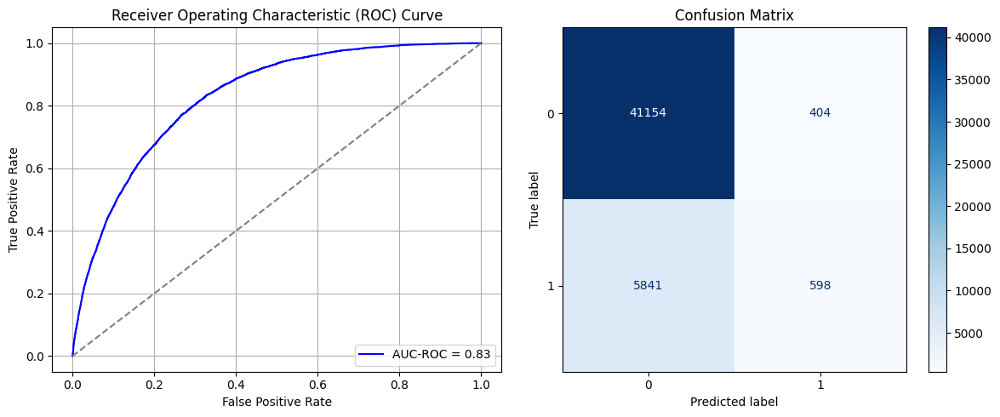

Best threshold based on F1-score: 0.22413240373134613
Time elapsed (performance): 200.97857487300007


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7109 - loss: 0.4279 - val_AUC: 0.6868 - val_loss: 0.4454
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6966 - loss: 0.4401 - val_AUC: 0.6878 - val_loss: 0.4452
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7134 - loss: 0.4196 - val_AUC: 0.6876 - val_loss: 0.4428
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6987 - loss: 0.4238 - val_AUC: 0.6885 - val_loss: 0.4427
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7061 - loss: 0.4255 - val_AUC: 0.6887 - val_loss: 0.4436
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7130 - loss: 0.4235 - val_AUC: 0.6895 - val_loss: 0.4420
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7125 - loss: 0.4193 - val_AUC: 0.6903 - val_loss: 0.4420
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7146 - loss: 0.4242 - val_AUC: 0.6914 - val_loss: 0.4415
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7089 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7017 - loss: 0.4351 - val_AUC: 0.6873 - val_loss: 0.4458
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7072 - loss: 0.4212 - val_AUC: 0.6865 - val_loss: 0.4435
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7096 - loss: 0.4263 - val_AUC: 0.6867 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7108 - loss: 0.4212 - val_AUC: 0.6878 - val_loss: 0.4424
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7218 - loss: 0.4188 - val_AUC: 0.6888 - val_loss: 0.4421
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7010 - loss: 0.4286 - val_AUC: 0.6892 - val_loss: 0.4418
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7081 - loss: 0.4295 - val_AUC: 0.6903 - val_loss: 0.4430
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7153 - loss: 0.4238 - val_AUC: 0.6914 - val_loss: 0.4408
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7088 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7004 - loss: 0.4350 - val_AUC: 0.6869 - val_loss: 0.4465
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7043 - loss: 0.4246 - val_AUC: 0.6874 - val_loss: 0.4440
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6903 - loss: 0.4214 - val_AUC: 0.6881 - val_loss: 0.4432
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7106 - loss: 0.4318 - val_AUC: 0.6883 - val_loss: 0.4450
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7038 - loss: 0.4309 - val_AUC: 0.6892 - val_loss: 0.4419
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 - loss: 0.4129 - val_AUC: 0.6902 - val_loss: 0.4413
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7173 - loss: 0.4235 - val_AUC: 0.6912 - val_loss: 0.4427
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7071 - loss: 0.4288 - val_AUC: 0.6922 - val_loss: 0.4402
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7097 - loss: 0.4321 - val_AUC: 0.6872 - val_loss: 0.4456
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7069 - loss: 0.4217 - val_AUC: 0.6871 - val_loss: 0.4433
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7152 - loss: 0.4223 - val_AUC: 0.6876 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7126 - loss: 0.4266 - val_AUC: 0.6885 - val_loss: 0.4433
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7090 - loss: 0.4208 - val_AUC: 0.6889 - val_loss: 0.4427
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.4235 - val_AUC: 0.6899 - val_loss: 0.4415
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7162 - loss: 0.4151 - val_AUC: 0.6910 - val_loss: 0.4412
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7197 - loss: 0.4073 - val_AUC: 0.6921 - val_loss: 0.4403
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7143 - loss: 0.4384 - val_AUC: 0.6868 - val_loss: 0.4454
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7044 - loss: 0.4161 - val_AUC: 0.6867 - val_loss: 0.4434
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6996 - loss: 0.4287 - val_AUC: 0.6871 - val_loss: 0.4435
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7110 - loss: 0.4355 - val_AUC: 0.6871 - val_loss: 0.4434
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7194 - loss: 0.4245 - val_AUC: 0.6883 - val_loss: 0.4425
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7085 - loss: 0.4216 - val_AUC: 0.6887 - val_loss: 0.4425
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7128 - loss: 0.4192 - val_AUC: 0.6893 - val_loss: 0.4418
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7131 - loss: 0.4287 - val_AUC: 0.6902 - val_loss: 0.4420
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7073 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7293 - loss: 0.4194 - val_AUC: 0.6866 - val_loss: 0.4447
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7108 - loss: 0.4217 - val_AUC: 0.6865 - val_loss: 0.4449
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7116 - loss: 0.4147 - val_AUC: 0.6877 - val_loss: 0.4431
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6981 - loss: 0.4322 - val_AUC: 0.6879 - val_loss: 0.4424
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7033 - loss: 0.4245 - val_AUC: 0.6882 - val_loss: 0.4422
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7079 - loss: 0.4342 - val_AUC: 0.6890 - val_loss: 0.4431
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7035 - loss: 0.4350 - val_AUC: 0.6899 - val_loss: 0.4424
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7089 - loss: 0.4256 - val_AUC: 0.6903 - val_loss: 0.4410
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.7056 - loss: 0.4300 - val_AUC: 0.6871 - val_loss: 0.4455
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7148 - loss: 0.4231 - val_AUC: 0.6866 - val_loss: 0.4431
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7232 - loss: 0.4123 - val_AUC: 0.6876 - val_loss: 0.4426
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7122 - loss: 0.4186 - val_AUC: 0.6882 - val_loss: 0.4426
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7050 - loss: 0.4139 - val_AUC: 0.6893 - val_loss: 0.4420
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7064 - loss: 0.4150 - val_AUC: 0.6901 - val_loss: 0.4414
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.4121 - val_AUC: 0.6915 - val_loss: 0.4407
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7116 - loss: 0.4262 - val_AUC: 0.6914 - val_loss: 0.4412
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7090 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7060 - loss: 0.4368 - val_AUC: 0.6874 - val_loss: 0.4454
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7013 - loss: 0.4227 - val_AUC: 0.6875 - val_loss: 0.4451
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.4099 - val_AUC: 0.6876 - val_loss: 0.4426
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7075 - loss: 0.4238 - val_AUC: 0.6886 - val_loss: 0.4430
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7055 - loss: 0.4296 - val_AUC: 0.6892 - val_loss: 0.4420
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7076 - loss: 0.4164 - val_AUC: 0.6901 - val_loss: 0.4420
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7073 - loss: 0.4297 - val_AUC: 0.6907 - val_loss: 0.4421
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7083 - loss: 0.4213 - val_AUC: 0.6916 - val_loss: 0.4413
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7012 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6982 - loss: 0.4367 - val_AUC: 0.6873 - val_loss: 0.4457
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7073 - loss: 0.4301 - val_AUC: 0.6869 - val_loss: 0.4432
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.4130 - val_AUC: 0.6879 - val_loss: 0.4428
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7220 - loss: 0.4186 - val_AUC: 0.6887 - val_loss: 0.4422
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7129 - loss: 0.4056 - val_AUC: 0.6890 - val_loss: 0.4418
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6996 - loss: 0.4212 - val_AUC: 0.6896 - val_loss: 0.4420
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7111 - loss: 0.4250 - val_AUC: 0.6901 - val_loss: 0.4411
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7030 - loss: 0.4252 - val_AUC: 0.6905 - val_loss: 0.4412
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7048 - loss: 0.4331 - val_AUC: 0.6866 - val_loss: 0.4456
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7069 - loss: 0.4248 - val_AUC: 0.6868 - val_loss: 0.4435
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7074 - loss: 0.4209 - val_AUC: 0.6875 - val_loss: 0.4427
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7063 - loss: 0.4173 - val_AUC: 0.6884 - val_loss: 0.4423
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7056 - loss: 0.4184 - val_AUC: 0.6894 - val_loss: 0.4416
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7203 - loss: 0.4189 - val_AUC: 0.6907 - val_loss: 0.4432
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7007 - loss: 0.4285 - val_AUC: 0.6908 - val_loss: 0.4414
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7156 - loss: 0.4191 - val_AUC: 0.6924 - val_loss: 0.4408
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6999 - loss: 0.4378 - val_AUC: 0.6872 - val_loss: 0.4468
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7130 - loss: 0.4204 - val_AUC: 0.6873 - val_loss: 0.4431
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7109 - loss: 0.4209 - val_AUC: 0.6874 - val_loss: 0.4428
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7059 - loss: 0.4292 - val_AUC: 0.6881 - val_loss: 0.4442
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7046 - loss: 0.4237 - val_AUC: 0.6889 - val_loss: 0.4419
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7069 - loss: 0.4173 - val_AUC: 0.6897 - val_loss: 0.4418
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7136 - loss: 0.4200 - val_AUC: 0.6907 - val_loss: 0.4417
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7068 - loss: 0.4193 - val_AUC: 0.6917 - val_loss: 0.4408
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7209 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7215 - loss: 0.4290 - val_AUC: 0.6869 - val_loss: 0.4442
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7049 - loss: 0.4252 - val_AUC: 0.6870 - val_loss: 0.4434
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7123 - loss: 0.4322 - val_AUC: 0.6875 - val_loss: 0.4441
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7129 - loss: 0.4108 - val_AUC: 0.6884 - val_loss: 0.4421
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7089 - loss: 0.4205 - val_AUC: 0.6889 - val_loss: 0.4420
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.4147 - val_AUC: 0.6895 - val_loss: 0.4415
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7083 - loss: 0.4222 - val_AUC: 0.6912 - val_loss: 0.4412
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7075 - loss: 0.4261 - val_AUC: 0.6918 - val_loss: 0.4408
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7166 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7154 - loss: 0.4349 - val_AUC: 0.6868 - val_loss: 0.4444
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7012 - loss: 0.4242 - val_AUC: 0.6870 - val_loss: 0.4434
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7095 - loss: 0.4130 - val_AUC: 0.6876 - val_loss: 0.4429
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7146 - loss: 0.4244 - val_AUC: 0.6881 - val_loss: 0.4421
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - loss: 0.4248 - val_AUC: 0.6887 - val_loss: 0.4423
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7125 - loss: 0.4196 - val_AUC: 0.6896 - val_loss: 0.4423
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7022 - loss: 0.4223 - val_AUC: 0.6902 - val_loss: 0.4409
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7115 - loss: 0.4177 - val_AUC: 0.6918 - val_loss: 0.4407
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7075 - loss: 0.4325 - val_AUC: 0.6869 - val_loss: 0.4453
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7107 - loss: 0.4268 - val_AUC: 0.6871 - val_loss: 0.4434
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6966 - loss: 0.4255 - val_AUC: 0.6876 - val_loss: 0.4433
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7182 - loss: 0.4203 - val_AUC: 0.6882 - val_loss: 0.4426
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.4175 - val_AUC: 0.6887 - val_loss: 0.4424
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7099 - loss: 0.4192 - val_AUC: 0.6899 - val_loss: 0.4414
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6990 - loss: 0.4245 - val_AUC: 0.6905 - val_loss: 0.4413
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7134 - loss: 0.4142 - val_AUC: 0.6914 - val_loss: 0.4406
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7146 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6879 - loss: 0.4484 - val_AUC: 0.6870 - val_loss: 0.4467
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6944 - loss: 0.4265 - val_AUC: 0.6870 - val_loss: 0.4441
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.4127 - val_AUC: 0.6876 - val_loss: 0.4426
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7073 - loss: 0.4203 - val_AUC: 0.6887 - val_loss: 0.4420
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7103 - loss: 0.4240 - val_AUC: 0.6895 - val_loss: 0.4429
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7196 - loss: 0.4085 - val_AUC: 0.6903 - val_loss: 0.4411
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7059 - loss: 0.4207 - val_AUC: 0.6901 - val_loss: 0.4430
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7093 - loss: 0.4145 - val_AUC: 0.6920 - val_loss: 0.4407
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7105 - loss: 0.4257 - val_AUC: 0.6872 - val_loss: 0.4452
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7046 - loss: 0.4226 - val_AUC: 0.6865 - val_loss: 0.4438
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6970 - loss: 0.4373 - val_AUC: 0.6881 - val_loss: 0.4442
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7087 - loss: 0.4238 - val_AUC: 0.6883 - val_loss: 0.4430
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7205 - loss: 0.4192 - val_AUC: 0.6883 - val_loss: 0.4422
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7064 - loss: 0.4278 - val_AUC: 0.6887 - val_loss: 0.4428
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7041 - loss: 0.4345 - val_AUC: 0.6897 - val_loss: 0.4417
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7068 - loss: 0.4194 - val_AUC: 0.6903 - val_loss: 0.4415
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7084 - loss: 0.4300 - val_AUC: 0.6870 - val_loss: 0.4455
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7108 - loss: 0.4250 - val_AUC: 0.6871 - val_loss: 0.4438
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7100 - loss: 0.4170 - val_AUC: 0.6872 - val_loss: 0.4429
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7090 - loss: 0.4268 - val_AUC: 0.6888 - val_loss: 0.4428
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7037 - loss: 0.4221 - val_AUC: 0.6890 - val_loss: 0.4416
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7081 - loss: 0.4208 - val_AUC: 0.6901 - val_loss: 0.4413
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7032 - loss: 0.4249 - val_AUC: 0.6907 - val_loss: 0.4425
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6966 - loss: 0.4346 - val_AUC: 0.6921 - val_loss: 0.4409
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7108 - loss: 0.4277 - val_AUC: 0.6869 - val_loss: 0.4451
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7113 - loss: 0.4197 - val_AUC: 0.6870 - val_loss: 0.4431
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7117 - loss: 0.4242 - val_AUC: 0.6878 - val_loss: 0.4434
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.4226 - val_AUC: 0.6887 - val_loss: 0.4420
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7123 - loss: 0.4196 - val_AUC: 0.6896 - val_loss: 0.4417
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7114 - loss: 0.4328 - val_AUC: 0.6897 - val_loss: 0.4410
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7013 - loss: 0.4201 - val_AUC: 0.6908 - val_loss: 0.4418
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7105 - loss: 0.4235 - val_AUC: 0.6923 - val_loss: 0.4404
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7204 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7085 - loss: 0.4412 - val_AUC: 0.6869 - val_loss: 0.4465
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7027 - loss: 0.4228 - val_AUC: 0.6865 - val_loss: 0.4433
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7050 - loss: 0.4163 - val_AUC: 0.6876 - val_loss: 0.4436
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7103 - loss: 0.4263 - val_AUC: 0.6888 - val_loss: 0.4427
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7021 - loss: 0.4279 - val_AUC: 0.6896 - val_loss: 0.4425
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7005 - loss: 0.4291 - val_AUC: 0.6903 - val_loss: 0.4414
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7127 - loss: 0.4177 - val_AUC: 0.6915 - val_loss: 0.4411
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7063 - loss: 0.4294 - val_AUC: 0.6925 - val_loss: 0.4405
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7045 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7021 - loss: 0.4419 - val_AUC: 0.6870 - val_loss: 0.4456
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7315 - loss: 0.4117 - val_AUC: 0.6864 - val_loss: 0.4433
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7064 - loss: 0.4165 - val_AUC: 0.6871 - val_loss: 0.4430
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7115 - loss: 0.4199 - val_AUC: 0.6876 - val_loss: 0.4424
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7105 - loss: 0.4214 - val_AUC: 0.6886 - val_loss: 0.4422
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7143 - loss: 0.4225 - val_AUC: 0.6890 - val_loss: 0.4417
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7028 - loss: 0.4299 - val_AUC: 0.6899 - val_loss: 0.4415
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7085 - loss: 0.4165 - val_AUC: 0.6905 - val_loss: 0.4413
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6989 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 25s 4ms/step - AUC: 0.7732 - loss: 0.3345 - val_AUC: 0.8201 - val_loss: 0.3283
Epoch 2/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - AUC: 0.8221 - loss: 0.3075 - val_AUC: 0.8224 - val_loss: 0.3134
Epoch 3/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - AUC: 0.8228 - loss: 0.3053 - val_AUC: 0.8241 - val_loss: 0.3149
Epoch 4/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 41s 4ms/step - AUC: 0.8242 - loss: 0.3052 - val_AUC: 0.8245 - val_loss: 0.3127
Epoch 5/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 22s 5ms/step - AUC: 0.8263 - loss: 0.3039 - val_AUC: 0.8248 - val_loss: 0.3114
Epoch 6/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 40s 4ms/step - AUC: 0.8256 - loss: 0.3034 - val_AUC: 0.8257 - val_loss: 0.3112
Epoch 7/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 39s 4ms/step - AUC: 0.8281 - loss: 0.3028 - val_AUC: 0.8260 - val_loss: 0.3097
Epoch 8/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - AUC: 0.8278 - loss: 0.3029 - val_AUC: 0.8239 - val_loss: 0.3146
Epoch 9/10
4800/4800 ━━━━━━━━━

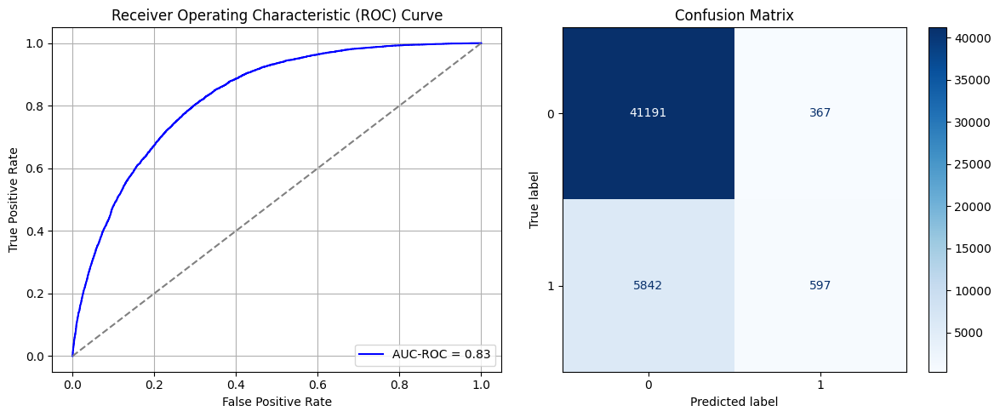

Best threshold based on F1-score: 0.1998310387134552
Time elapsed (performance): 315.120844196


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6967 - loss: 0.4382 - val_AUC: 0.6797 - val_loss: 0.4477
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7049 - loss: 0.4256 - val_AUC: 0.6798 - val_loss: 0.4464
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6992 - loss: 0.4296 - val_AUC: 0.6801 - val_loss: 0.4460
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7084 - loss: 0.4271 - val_AUC: 0.6802 - val_loss: 0.4457
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7090 - loss: 0.4309 - val_AUC: 0.6801 - val_loss: 0.4458
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7163 - loss: 0.4248 - val_AUC: 0.6802 - val_loss: 0.4452
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6982 - loss: 0.4367 - val_AUC: 0.6801 - val_loss: 0.4455
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7103 - loss: 0.4153 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6923 - loss: 0.4420 - val_AUC: 0.6797 - val_loss: 0.4472
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7077 - loss: 0.4221 - val_AUC: 0.6799 - val_loss: 0.4462
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7060 - loss: 0.4247 - val_AUC: 0.6799 - val_loss: 0.4461
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7038 - loss: 0.4233 - val_AUC: 0.6804 - val_loss: 0.4462
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7008 - loss: 0.4282 - val_AUC: 0.6799 - val_loss: 0.4456
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7091 - loss: 0.4238 - val_AUC: 0.6802 - val_loss: 0.4453
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7035 - loss: 0.4185 - val_AUC: 0.6801 - val_loss: 0.4454
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7080 - loss: 0.4248 - val_AUC: 0.6802 - val_loss: 0.4452
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6970 - loss: 0.4356 - val_AUC: 0.6800 - val_loss: 0.4475
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7095 - loss: 0.4205 - val_AUC: 0.6800 - val_loss: 0.4461
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6977 - loss: 0.4279 - val_AUC: 0.6801 - val_loss: 0.4461
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6952 - loss: 0.4369 - val_AUC: 0.6798 - val_loss: 0.4466
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6875 - loss: 0.4275 - val_AUC: 0.6798 - val_loss: 0.4452
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7057 - loss: 0.4181 - val_AUC: 0.6799 - val_loss: 0.4451
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6928 - loss: 0.4315 - val_AUC: 0.6803 - val_loss: 0.4458
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7120 - loss: 0.4205 - val_AUC: 0.6806 - val_loss: 0.4449
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6948 - loss: 0.4378 - val_AUC: 0.6799 - val_loss: 0.4477
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7092 - loss: 0.4221 - val_AUC: 0.6796 - val_loss: 0.4468
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7008 - loss: 0.4123 - val_AUC: 0.6799 - val_loss: 0.4458
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7098 - loss: 0.4253 - val_AUC: 0.6799 - val_loss: 0.4461
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7046 - loss: 0.4322 - val_AUC: 0.6800 - val_loss: 0.4464
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7012 - loss: 0.4228 - val_AUC: 0.6801 - val_loss: 0.4456
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7067 - loss: 0.4240 - val_AUC: 0.6804 - val_loss: 0.4451
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7021 - loss: 0.4233 - val_AUC: 0.6800 - val_loss: 0.4450
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7024 - loss: 0.4322 - val_AUC: 0.6798 - val_loss: 0.4479
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7054 - loss: 0.4314 - val_AUC: 0.6795 - val_loss: 0.4469
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6983 - loss: 0.4231 - val_AUC: 0.6799 - val_loss: 0.4463
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7113 - loss: 0.4254 - val_AUC: 0.6801 - val_loss: 0.4460
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7089 - loss: 0.4212 - val_AUC: 0.6801 - val_loss: 0.4452
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7036 - loss: 0.4216 - val_AUC: 0.6800 - val_loss: 0.4452
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7022 - loss: 0.4297 - val_AUC: 0.6804 - val_loss: 0.4473
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7024 - loss: 0.4276 - val_AUC: 0.6804 - val_loss: 0.4455
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6974 - loss: 0.4289 - val_AUC: 0.6794 - val_loss: 0.4476
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7029 - loss: 0.4149 - val_AUC: 0.6797 - val_loss: 0.4474
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7070 - loss: 0.4171 - val_AUC: 0.6800 - val_loss: 0.4463
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7038 - loss: 0.4274 - val_AUC: 0.6802 - val_loss: 0.4458
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7041 - loss: 0.4139 - val_AUC: 0.6800 - val_loss: 0.4455
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7000 - loss: 0.4244 - val_AUC: 0.6804 - val_loss: 0.4455
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7113 - loss: 0.4248 - val_AUC: 0.6805 - val_loss: 0.4452
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6980 - loss: 0.4234 - val_AUC: 0.6803 - val_loss: 0.4449
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6949 - loss: 0.4333 - val_AUC: 0.6799 - val_loss: 0.4472
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7148 - loss: 0.4248 - val_AUC: 0.6797 - val_loss: 0.4465
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7001 - loss: 0.4282 - val_AUC: 0.6800 - val_loss: 0.4462
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6965 - loss: 0.4294 - val_AUC: 0.6803 - val_loss: 0.4453
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7036 - loss: 0.4243 - val_AUC: 0.6801 - val_loss: 0.4465
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7059 - loss: 0.4124 - val_AUC: 0.6804 - val_loss: 0.4452
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7135 - loss: 0.4146 - val_AUC: 0.6807 - val_loss: 0.4451
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7095 - loss: 0.4218 - val_AUC: 0.6804 - val_loss: 0.4448
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7088 - loss: 0.4304 - val_AUC: 0.6799 - val_loss: 0.4475
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7043 - loss: 0.4304 - val_AUC: 0.6797 - val_loss: 0.4465
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7059 - loss: 0.4237 - val_AUC: 0.6797 - val_loss: 0.4462
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7107 - loss: 0.4269 - val_AUC: 0.6797 - val_loss: 0.4460
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7041 - loss: 0.4243 - val_AUC: 0.6800 - val_loss: 0.4458
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7063 - loss: 0.4247 - val_AUC: 0.6801 - val_loss: 0.4457
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6977 - loss: 0.4372 - val_AUC: 0.6804 - val_loss: 0.4458
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7045 - loss: 0.4219 - val_AUC: 0.6804 - val_loss: 0.4460
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7012 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6955 - loss: 0.4501 - val_AUC: 0.6795 - val_loss: 0.4486
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7068 - loss: 0.4340 - val_AUC: 0.6798 - val_loss: 0.4467
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7044 - loss: 0.4277 - val_AUC: 0.6801 - val_loss: 0.4470
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7070 - loss: 0.4175 - val_AUC: 0.6799 - val_loss: 0.4454
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6977 - loss: 0.4314 - val_AUC: 0.6799 - val_loss: 0.4462
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6930 - loss: 0.4157 - val_AUC: 0.6803 - val_loss: 0.4454
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7085 - loss: 0.4230 - val_AUC: 0.6802 - val_loss: 0.4452
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7045 - loss: 0.4182 - val_AUC: 0.6803 - val_loss: 0.4454
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7126 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7054 - loss: 0.4348 - val_AUC: 0.6797 - val_loss: 0.4480
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7099 - loss: 0.4240 - val_AUC: 0.6798 - val_loss: 0.4465
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7119 - loss: 0.4176 - val_AUC: 0.6796 - val_loss: 0.4458
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6959 - loss: 0.4300 - val_AUC: 0.6799 - val_loss: 0.4471
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.4239 - val_AUC: 0.6800 - val_loss: 0.4457
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7065 - loss: 0.4236 - val_AUC: 0.6801 - val_loss: 0.4453
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7108 - loss: 0.4197 - val_AUC: 0.6805 - val_loss: 0.4451
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6896 - loss: 0.4230 - val_AUC: 0.6804 - val_loss: 0.4450
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7130 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7022 - loss: 0.4343 - val_AUC: 0.6798 - val_loss: 0.4471
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7042 - loss: 0.4246 - val_AUC: 0.6797 - val_loss: 0.4464
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7017 - loss: 0.4323 - val_AUC: 0.6796 - val_loss: 0.4460
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7037 - loss: 0.4155 - val_AUC: 0.6797 - val_loss: 0.4454
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6953 - loss: 0.4352 - val_AUC: 0.6797 - val_loss: 0.4465
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7062 - loss: 0.4329 - val_AUC: 0.6801 - val_loss: 0.4461
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6931 - loss: 0.4274 - val_AUC: 0.6802 - val_loss: 0.4457
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7134 - loss: 0.4175 - val_AUC: 0.6805 - val_loss: 0.4452
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7095 - loss: 0.4244 - val_AUC: 0.6797 - val_loss: 0.4472
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6921 - loss: 0.4294 - val_AUC: 0.6797 - val_loss: 0.4463
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7008 - loss: 0.4259 - val_AUC: 0.6798 - val_loss: 0.4462
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7041 - loss: 0.4235 - val_AUC: 0.6802 - val_loss: 0.4457
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - loss: 0.4311 - val_AUC: 0.6799 - val_loss: 0.4458
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6907 - loss: 0.4404 - val_AUC: 0.6805 - val_loss: 0.4474
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7073 - loss: 0.4270 - val_AUC: 0.6804 - val_loss: 0.4456
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6953 - loss: 0.4282 - val_AUC: 0.6804 - val_loss: 0.4451
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6854 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7018 - loss: 0.4393 - val_AUC: 0.6797 - val_loss: 0.4479
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7038 - loss: 0.4219 - val_AUC: 0.6800 - val_loss: 0.4462
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7021 - loss: 0.4290 - val_AUC: 0.6803 - val_loss: 0.4457
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6925 - loss: 0.4278 - val_AUC: 0.6799 - val_loss: 0.4455
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7121 - loss: 0.4204 - val_AUC: 0.6800 - val_loss: 0.4459
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7035 - loss: 0.4231 - val_AUC: 0.6800 - val_loss: 0.4451
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7112 - loss: 0.4345 - val_AUC: 0.6801 - val_loss: 0.4459
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6964 - loss: 0.4153 - val_AUC: 0.6802 - val_loss: 0.4449
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7105 - loss: 0.4233 - val_AUC: 0.6800 - val_loss: 0.4472
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7110 - loss: 0.4141 - val_AUC: 0.6797 - val_loss: 0.4463
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6983 - loss: 0.4231 - val_AUC: 0.6800 - val_loss: 0.4471
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7005 - loss: 0.4206 - val_AUC: 0.6803 - val_loss: 0.4457
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7081 - loss: 0.4230 - val_AUC: 0.6800 - val_loss: 0.4453
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7126 - loss: 0.4269 - val_AUC: 0.6804 - val_loss: 0.4457
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7114 - loss: 0.4302 - val_AUC: 0.6803 - val_loss: 0.4459
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7012 - loss: 0.4296 - val_AUC: 0.6802 - val_loss: 0.4455
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6999 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7016 - loss: 0.4294 - val_AUC: 0.6799 - val_loss: 0.4475
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6914 - loss: 0.4401 - val_AUC: 0.6798 - val_loss: 0.4482
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6974 - loss: 0.4311 - val_AUC: 0.6800 - val_loss: 0.4458
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7056 - loss: 0.4284 - val_AUC: 0.6797 - val_loss: 0.4455
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7048 - loss: 0.4195 - val_AUC: 0.6802 - val_loss: 0.4456
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.4254 - val_AUC: 0.6797 - val_loss: 0.4469
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.4296 - val_AUC: 0.6803 - val_loss: 0.4455
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7055 - loss: 0.4268 - val_AUC: 0.6804 - val_loss: 0.4453
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6976 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6947 - loss: 0.4462 - val_AUC: 0.6796 - val_loss: 0.4484
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6889 - loss: 0.4357 - val_AUC: 0.6796 - val_loss: 0.4476
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7009 - loss: 0.4272 - val_AUC: 0.6796 - val_loss: 0.4460
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6969 - loss: 0.4208 - val_AUC: 0.6801 - val_loss: 0.4454
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.4247 - val_AUC: 0.6798 - val_loss: 0.4465
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7104 - loss: 0.4207 - val_AUC: 0.6800 - val_loss: 0.4453
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6934 - loss: 0.4314 - val_AUC: 0.6804 - val_loss: 0.4463
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7085 - loss: 0.4188 - val_AUC: 0.6807 - val_loss: 0.4449
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7033 - loss: 0.4326 - val_AUC: 0.6799 - val_loss: 0.4474
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7002 - loss: 0.4222 - val_AUC: 0.6796 - val_loss: 0.4462
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6953 - loss: 0.4244 - val_AUC: 0.6798 - val_loss: 0.4463
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7021 - loss: 0.4221 - val_AUC: 0.6798 - val_loss: 0.4455
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7018 - loss: 0.4274 - val_AUC: 0.6801 - val_loss: 0.4455
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6984 - loss: 0.4183 - val_AUC: 0.6804 - val_loss: 0.4459
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6964 - loss: 0.4358 - val_AUC: 0.6801 - val_loss: 0.4466
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6959 - loss: 0.4231 - val_AUC: 0.6805 - val_loss: 0.4453
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6958 - loss: 0.4423 - val_AUC: 0.6798 - val_loss: 0.4490
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7028 - loss: 0.4274 - val_AUC: 0.6797 - val_loss: 0.4463
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7108 - loss: 0.4174 - val_AUC: 0.6800 - val_loss: 0.4459
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.4196 - val_AUC: 0.6797 - val_loss: 0.4459
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7056 - loss: 0.4250 - val_AUC: 0.6806 - val_loss: 0.4467
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7058 - loss: 0.4252 - val_AUC: 0.6802 - val_loss: 0.4459
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7075 - loss: 0.4244 - val_AUC: 0.6804 - val_loss: 0.4453
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7078 - loss: 0.4208 - val_AUC: 0.6805 - val_loss: 0.4450
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7072 - loss: 0.4359 - val_AUC: 0.6798 - val_loss: 0.4484
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6933 - loss: 0.4308 - val_AUC: 0.6800 - val_loss: 0.4467
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.4168 - val_AUC: 0.6797 - val_loss: 0.4462
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7050 - loss: 0.4381 - val_AUC: 0.6797 - val_loss: 0.4490
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.4239 - val_AUC: 0.6800 - val_loss: 0.4454
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.4265 - val_AUC: 0.6800 - val_loss: 0.4453
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7083 - loss: 0.4247 - val_AUC: 0.6802 - val_loss: 0.4451
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7017 - loss: 0.4278 - val_AUC: 0.6804 - val_loss: 0.4450
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7080 - loss: 0.4274 - val_AUC: 0.6800 - val_loss: 0.4470
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6985 - loss: 0.4297 - val_AUC: 0.6796 - val_loss: 0.4467
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7095 - loss: 0.4230 - val_AUC: 0.6797 - val_loss: 0.4457
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7073 - loss: 0.4236 - val_AUC: 0.6795 - val_loss: 0.4460
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7067 - loss: 0.4277 - val_AUC: 0.6800 - val_loss: 0.4454
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7048 - loss: 0.4254 - val_AUC: 0.6801 - val_loss: 0.4455
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6972 - loss: 0.4272 - val_AUC: 0.6804 - val_loss: 0.4458
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7005 - loss: 0.4177 - val_AUC: 0.6805 - val_loss: 0.4453
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6938 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 23s 4ms/step - AUC: 0.7746 - loss: 0.3322 - val_AUC: 0.8218 - val_loss: 0.3134
Epoch 2/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 41s 4ms/step - AUC: 0.8196 - loss: 0.3074 - val_AUC: 0.8236 - val_loss: 0.3122
Epoch 3/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 41s 4ms/step - AUC: 0.8236 - loss: 0.3040 - val_AUC: 0.8242 - val_loss: 0.3141
Epoch 4/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 39s 4ms/step - AUC: 0.8243 - loss: 0.3033 - val_AUC: 0.8248 - val_loss: 0.3108
Epoch 5/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - AUC: 0.8258 - loss: 0.3023 - val_AUC: 0.8256 - val_loss: 0.3119
Epoch 6/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - AUC: 0.8245 - loss: 0.3047 - val_AUC: 0.8254 - val_loss: 0.3141
Epoch 7/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - AUC: 0.8278 - loss: 0.3003 - val_AUC: 0.8261 - val_loss: 0.3106
Epoch 8/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - AUC: 0.8270 - loss: 0.3033 - val_AUC: 0.8258 - val_loss: 0.3160
Epoch 9/10
4800/4800 ━━━━━━━━━

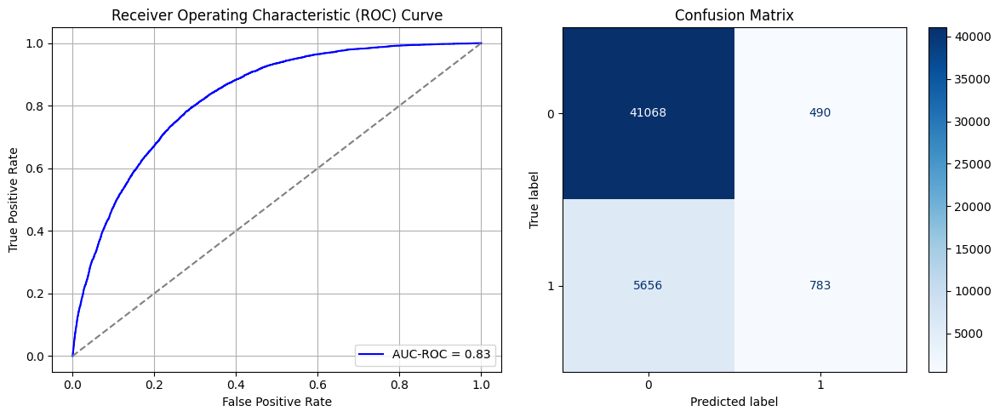

Best threshold based on F1-score: 0.23784801363945007
Time elapsed (performance): 272.04957276999994


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7128 - loss: 0.4362 - val_AUC: 0.6873 - val_loss: 0.4475
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7062 - loss: 0.4214 - val_AUC: 0.6876 - val_loss: 0.4444
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7226 - loss: 0.4257 - val_AUC: 0.6873 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7044 - loss: 0.4319 - val_AUC: 0.6879 - val_loss: 0.4443
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7105 - loss: 0.4245 - val_AUC: 0.6877 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7114 - loss: 0.4166 - val_AUC: 0.6881 - val_loss: 0.4430
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7024 - loss: 0.4220 - val_AUC: 0.6882 - val_loss: 0.4435
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7134 - loss: 0.4060 - val_AUC: 0.6889 - val_loss: 0.4422
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7095 - loss: 0.4310 - val_AUC: 0.6876 - val_loss: 0.4480
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7155 - loss: 0.4233 - val_AUC: 0.6873 - val_loss: 0.4442
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7169 - loss: 0.4244 - val_AUC: 0.6875 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.4171 - val_AUC: 0.6879 - val_loss: 0.4441
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7151 - loss: 0.4142 - val_AUC: 0.6877 - val_loss: 0.4430
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7192 - loss: 0.4209 - val_AUC: 0.6880 - val_loss: 0.4438
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7179 - loss: 0.4176 - val_AUC: 0.6883 - val_loss: 0.4427
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7197 - loss: 0.4153 - val_AUC: 0.6888 - val_loss: 0.4425
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7210 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7121 - loss: 0.4391 - val_AUC: 0.6874 - val_loss: 0.4480
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.4340 - val_AUC: 0.6874 - val_loss: 0.4451
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.4270 - val_AUC: 0.6878 - val_loss: 0.4438
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7149 - loss: 0.4247 - val_AUC: 0.6877 - val_loss: 0.4429
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7033 - loss: 0.4256 - val_AUC: 0.6884 - val_loss: 0.4437
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7169 - loss: 0.4227 - val_AUC: 0.6881 - val_loss: 0.4428
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.4263 - val_AUC: 0.6888 - val_loss: 0.4431
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7071 - loss: 0.4234 - val_AUC: 0.6890 - val_loss: 0.4425
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7146 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7133 - loss: 0.4322 - val_AUC: 0.6875 - val_loss: 0.4478
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7178 - loss: 0.4260 - val_AUC: 0.6874 - val_loss: 0.4453
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7090 - loss: 0.4137 - val_AUC: 0.6875 - val_loss: 0.4432
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.4186 - val_AUC: 0.6880 - val_loss: 0.4433
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7101 - loss: 0.4242 - val_AUC: 0.6881 - val_loss: 0.4426
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7141 - loss: 0.4171 - val_AUC: 0.6884 - val_loss: 0.4426
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7134 - loss: 0.4205 - val_AUC: 0.6882 - val_loss: 0.4430
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7121 - loss: 0.4147 - val_AUC: 0.6888 - val_loss: 0.4420
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7170 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7159 - loss: 0.4336 - val_AUC: 0.6875 - val_loss: 0.4478
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7039 - loss: 0.4300 - val_AUC: 0.6875 - val_loss: 0.4457
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7153 - loss: 0.4188 - val_AUC: 0.6875 - val_loss: 0.4442
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7168 - loss: 0.4212 - val_AUC: 0.6878 - val_loss: 0.4436
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.4199 - val_AUC: 0.6883 - val_loss: 0.4425
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7024 - loss: 0.4247 - val_AUC: 0.6880 - val_loss: 0.4432
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7060 - loss: 0.4227 - val_AUC: 0.6882 - val_loss: 0.4437
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7237 - loss: 0.4152 - val_AUC: 0.6890 - val_loss: 0.4425
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7249 - loss: 0.4255 - val_AUC: 0.6875 - val_loss: 0.4470
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7130 - loss: 0.4228 - val_AUC: 0.6874 - val_loss: 0.4441
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7114 - loss: 0.4266 - val_AUC: 0.6877 - val_loss: 0.4435
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.4182 - val_AUC: 0.6877 - val_loss: 0.4431
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.4239 - val_AUC: 0.6879 - val_loss: 0.4433
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7147 - loss: 0.4105 - val_AUC: 0.6883 - val_loss: 0.4426
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7139 - loss: 0.4246 - val_AUC: 0.6884 - val_loss: 0.4429
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.4228 - val_AUC: 0.6890 - val_loss: 0.4425
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7070 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7005 - loss: 0.4450 - val_AUC: 0.6876 - val_loss: 0.4496
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7181 - loss: 0.4189 - val_AUC: 0.6873 - val_loss: 0.4442
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7097 - loss: 0.4248 - val_AUC: 0.6873 - val_loss: 0.4435
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7019 - loss: 0.4301 - val_AUC: 0.6877 - val_loss: 0.4441
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7181 - loss: 0.4243 - val_AUC: 0.6877 - val_loss: 0.4427
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7084 - loss: 0.4223 - val_AUC: 0.6880 - val_loss: 0.4432
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7223 - loss: 0.4119 - val_AUC: 0.6885 - val_loss: 0.4425
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7164 - loss: 0.4187 - val_AUC: 0.6892 - val_loss: 0.4422
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7117 - loss: 0.4304 - val_AUC: 0.6872 - val_loss: 0.4475
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7103 - loss: 0.4233 - val_AUC: 0.6876 - val_loss: 0.4455
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7021 - loss: 0.4235 - val_AUC: 0.6875 - val_loss: 0.4441
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7110 - loss: 0.4275 - val_AUC: 0.6878 - val_loss: 0.4434
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7119 - loss: 0.4142 - val_AUC: 0.6881 - val_loss: 0.4426
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7067 - loss: 0.4233 - val_AUC: 0.6882 - val_loss: 0.4429
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7122 - loss: 0.4254 - val_AUC: 0.6883 - val_loss: 0.4441
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7070 - loss: 0.4277 - val_AUC: 0.6890 - val_loss: 0.4425
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7088 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7072 - loss: 0.4350 - val_AUC: 0.6873 - val_loss: 0.4475
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7075 - loss: 0.4353 - val_AUC: 0.6877 - val_loss: 0.4451
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7093 - loss: 0.4224 - val_AUC: 0.6875 - val_loss: 0.4433
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7076 - loss: 0.4197 - val_AUC: 0.6880 - val_loss: 0.4430
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7207 - loss: 0.4127 - val_AUC: 0.6879 - val_loss: 0.4425
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7103 - loss: 0.4232 - val_AUC: 0.6883 - val_loss: 0.4423
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7053 - loss: 0.4251 - val_AUC: 0.6888 - val_loss: 0.4427
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.4089 - val_AUC: 0.6894 - val_loss: 0.4419
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7047 - loss: 0.4311 - val_AUC: 0.6876 - val_loss: 0.4480
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7098 - loss: 0.4289 - val_AUC: 0.6875 - val_loss: 0.4469
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7088 - loss: 0.4199 - val_AUC: 0.6877 - val_loss: 0.4438
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7132 - loss: 0.4255 - val_AUC: 0.6875 - val_loss: 0.4432
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7221 - loss: 0.4209 - val_AUC: 0.6880 - val_loss: 0.4438
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7170 - loss: 0.4198 - val_AUC: 0.6882 - val_loss: 0.4426
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7191 - loss: 0.4154 - val_AUC: 0.6887 - val_loss: 0.4422
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7105 - loss: 0.4254 - val_AUC: 0.6891 - val_loss: 0.4428
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7185 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - AUC: 0.7152 - loss: 0.4279 - val_AUC: 0.6874 - val_loss: 0.4483
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7118 - loss: 0.4199 - val_AUC: 0.6874 - val_loss: 0.4445
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7145 - loss: 0.4126 - val_AUC: 0.6875 - val_loss: 0.4434
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7081 - loss: 0.4364 - val_AUC: 0.6878 - val_loss: 0.4438
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7146 - loss: 0.4286 - val_AUC: 0.6882 - val_loss: 0.4436
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.4169 - val_AUC: 0.6885 - val_loss: 0.4423
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.4182 - val_AUC: 0.6891 - val_loss: 0.4423
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.4179 - val_AUC: 0.6892 - val_loss: 0.4424
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7107 - loss: 0.4308 - val_AUC: 0.6878 - val_loss: 0.4479
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.4125 - val_AUC: 0.6875 - val_loss: 0.4450
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.4199 - val_AUC: 0.6876 - val_loss: 0.4436
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.4252 - val_AUC: 0.6874 - val_loss: 0.4438
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7106 - loss: 0.4113 - val_AUC: 0.6879 - val_loss: 0.4427
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.4235 - val_AUC: 0.6883 - val_loss: 0.4426
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7167 - loss: 0.4201 - val_AUC: 0.6888 - val_loss: 0.4427
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.4263 - val_AUC: 0.6889 - val_loss: 0.4428
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7131 - loss: 0.4313 - val_AUC: 0.6876 - val_loss: 0.4479
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7209 - loss: 0.4136 - val_AUC: 0.6874 - val_loss: 0.4446
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.4230 - val_AUC: 0.6877 - val_loss: 0.4437
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7145 - loss: 0.4223 - val_AUC: 0.6877 - val_loss: 0.4436
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.4245 - val_AUC: 0.6878 - val_loss: 0.4437
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7194 - loss: 0.4280 - val_AUC: 0.6878 - val_loss: 0.4436
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7034 - loss: 0.4224 - val_AUC: 0.6882 - val_loss: 0.4429
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.4225 - val_AUC: 0.6883 - val_loss: 0.4427
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7179 - loss: 0.4255 - val_AUC: 0.6876 - val_loss: 0.4472
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7108 - loss: 0.4301 - val_AUC: 0.6874 - val_loss: 0.4454
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7027 - loss: 0.4335 - val_AUC: 0.6875 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7085 - loss: 0.4251 - val_AUC: 0.6880 - val_loss: 0.4439
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.4244 - val_AUC: 0.6879 - val_loss: 0.4429
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7152 - loss: 0.4272 - val_AUC: 0.6877 - val_loss: 0.4427
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7088 - loss: 0.4289 - val_AUC: 0.6885 - val_loss: 0.4438
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.4199 - val_AUC: 0.6887 - val_loss: 0.4426
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7233 - loss: 0.4288 - val_AUC: 0.6872 - val_loss: 0.4484
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.4159 - val_AUC: 0.6873 - val_loss: 0.4445
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7006 - loss: 0.4197 - val_AUC: 0.6876 - val_loss: 0.4437
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6992 - loss: 0.4221 - val_AUC: 0.6877 - val_loss: 0.4444
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7146 - loss: 0.4111 - val_AUC: 0.6878 - val_loss: 0.4428
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.4251 - val_AUC: 0.6879 - val_loss: 0.4432
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7072 - loss: 0.4199 - val_AUC: 0.6888 - val_loss: 0.4422
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7238 - loss: 0.4116 - val_AUC: 0.6893 - val_loss: 0.4420
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7195 - loss: 0.4211 - val_AUC: 0.6876 - val_loss: 0.4477
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7090 - loss: 0.4277 - val_AUC: 0.6872 - val_loss: 0.4447
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7104 - loss: 0.4214 - val_AUC: 0.6876 - val_loss: 0.4434
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7173 - loss: 0.4246 - val_AUC: 0.6874 - val_loss: 0.4440
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7118 - loss: 0.4234 - val_AUC: 0.6876 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7163 - loss: 0.4275 - val_AUC: 0.6881 - val_loss: 0.4437
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7126 - loss: 0.4246 - val_AUC: 0.6884 - val_loss: 0.4426
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.4239 - val_AUC: 0.6888 - val_loss: 0.4434
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7127 - loss: 0.4416 - val_AUC: 0.6872 - val_loss: 0.4484
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7155 - loss: 0.4352 - val_AUC: 0.6874 - val_loss: 0.4459
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7089 - loss: 0.4138 - val_AUC: 0.6876 - val_loss: 0.4435
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7033 - loss: 0.4302 - val_AUC: 0.6876 - val_loss: 0.4437
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6981 - loss: 0.4394 - val_AUC: 0.6877 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.4174 - val_AUC: 0.6880 - val_loss: 0.4425
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7119 - loss: 0.4213 - val_AUC: 0.6882 - val_loss: 0.4426
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7118 - loss: 0.4201 - val_AUC: 0.6886 - val_loss: 0.4424
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7254 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7108 - loss: 0.4391 - val_AUC: 0.6873 - val_loss: 0.4485
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7231 - loss: 0.4129 - val_AUC: 0.6875 - val_loss: 0.4442
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.4195 - val_AUC: 0.6872 - val_loss: 0.4437
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.4220 - val_AUC: 0.6876 - val_loss: 0.4440
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6988 - loss: 0.4305 - val_AUC: 0.6875 - val_loss: 0.4431
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.4189 - val_AUC: 0.6883 - val_loss: 0.4424
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7131 - loss: 0.4162 - val_AUC: 0.6883 - val_loss: 0.4429
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.4163 - val_AUC: 0.6890 - val_loss: 0.4424
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7132 - loss: 0.4377 - val_AUC: 0.6873 - val_loss: 0.4478
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.4200 - val_AUC: 0.6873 - val_loss: 0.4447
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7038 - loss: 0.4212 - val_AUC: 0.6875 - val_loss: 0.4437
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 - loss: 0.4181 - val_AUC: 0.6876 - val_loss: 0.4438
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.4113 - val_AUC: 0.6876 - val_loss: 0.4425
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.4283 - val_AUC: 0.6886 - val_loss: 0.4450
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7207 - loss: 0.4210 - val_AUC: 0.6884 - val_loss: 0.4429
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7186 - loss: 0.4135 - val_AUC: 0.6890 - val_loss: 0.4426
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7160 - loss: 0.4390 - val_AUC: 0.6873 - val_loss: 0.4486
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7195 - loss: 0.4162 - val_AUC: 0.6875 - val_loss: 0.4445
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7102 - loss: 0.4250 - val_AUC: 0.6876 - val_loss: 0.4439
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7132 - loss: 0.4186 - val_AUC: 0.6877 - val_loss: 0.4431
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7076 - loss: 0.4249 - val_AUC: 0.6880 - val_loss: 0.4427
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.4117 - val_AUC: 0.6878 - val_loss: 0.4423
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7106 - loss: 0.4249 - val_AUC: 0.6886 - val_loss: 0.4431
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7205 - loss: 0.4095 - val_AUC: 0.6888 - val_loss: 0.4425
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7126 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 25s 4ms/step - AUC: 0.7798 - loss: 0.3293 - val_AUC: 0.8203 - val_loss: 0.3144
Epoch 2/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 24s 5ms/step - AUC: 0.8173 - loss: 0.3106 - val_AUC: 0.8222 - val_loss: 0.3125
Epoch 3/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - AUC: 0.8224 - loss: 0.3058 - val_AUC: 0.8238 - val_loss: 0.3118
Epoch 4/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 22s 5ms/step - AUC: 0.8258 - loss: 0.3055 - val_AUC: 0.8253 - val_loss: 0.3113
Epoch 5/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - AUC: 0.8272 - loss: 0.3031 - val_AUC: 0.8241 - val_loss: 0.3138
Epoch 6/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - AUC: 0.8233 - loss: 0.3059 - val_AUC: 0.8260 - val_loss: 0.3101
Epoch 7/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 44s 5ms/step - AUC: 0.8291 - loss: 0.3035 - val_AUC: 0.8260 - val_loss: 0.3104
Epoch 8/10
4800/4800 ━━━━━━━━━━━━━━━━━━━━ 40s 5ms/step - AUC: 0.8291 - loss: 0.3013 - val_AUC: 0.8258 - val_loss: 0.3105
Epoch 9/10
4800/4800 ━━━━━━━━━

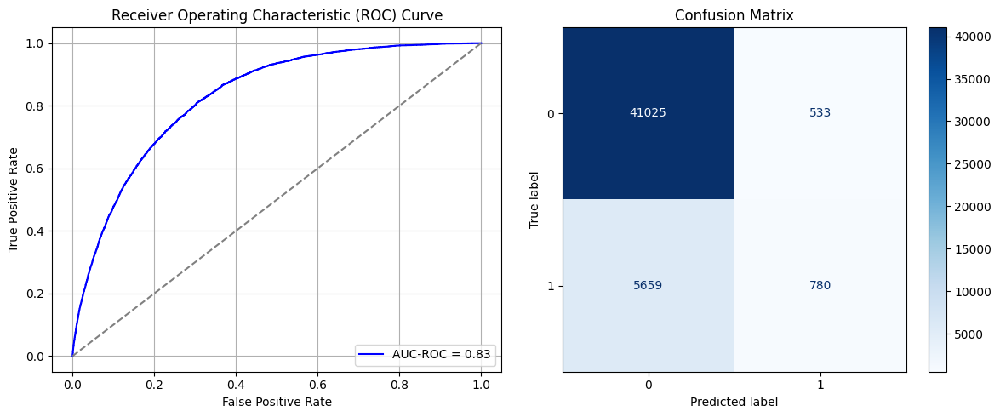

Best threshold based on F1-score: 0.23503144085407257
Time elapsed (performance): 285.7269512060002


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7195 - loss: 0.4294 - val_AUC: 0.6834 - val_loss: 0.4494
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7120 - loss: 0.4349 - val_AUC: 0.6838 - val_loss: 0.4479
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7053 - loss: 0.4216 - val_AUC: 0.6848 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7054 - loss: 0.4239 - val_AUC: 0.6851 - val_loss: 0.4441
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7164 - loss: 0.4283 - val_AUC: 0.6857 - val_loss: 0.4445
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.4281 - val_AUC: 0.6857 - val_loss: 0.4442
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6968 - loss: 0.4359 - val_AUC: 0.6868 - val_loss: 0.4440
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.4312 - val_AUC: 0.6872 - val_loss: 0.4432
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7106 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7128 - loss: 0.4398 - val_AUC: 0.6835 - val_loss: 0.4495
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7114 - loss: 0.4212 - val_AUC: 0.6841 - val_loss: 0.4456
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7097 - loss: 0.4160 - val_AUC: 0.6853 - val_loss: 0.4441
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.4350 - val_AUC: 0.6856 - val_loss: 0.4447
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7126 - loss: 0.4226 - val_AUC: 0.6858 - val_loss: 0.4447
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7070 - loss: 0.4312 - val_AUC: 0.6866 - val_loss: 0.4440
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7134 - loss: 0.4175 - val_AUC: 0.6869 - val_loss: 0.4430
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7121 - loss: 0.4251 - val_AUC: 0.6873 - val_loss: 0.4428
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7121 - loss: 0.4349 - val_AUC: 0.6839 - val_loss: 0.4505
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7019 - loss: 0.4292 - val_AUC: 0.6848 - val_loss: 0.4458
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7114 - loss: 0.4250 - val_AUC: 0.6851 - val_loss: 0.4442
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7107 - loss: 0.4208 - val_AUC: 0.6858 - val_loss: 0.4437
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7089 - loss: 0.4214 - val_AUC: 0.6861 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7202 - loss: 0.4175 - val_AUC: 0.6865 - val_loss: 0.4431
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7160 - loss: 0.4240 - val_AUC: 0.6869 - val_loss: 0.4430
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7065 - loss: 0.4238 - val_AUC: 0.6869 - val_loss: 0.4434
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7095 - loss: 0.4336 - val_AUC: 0.6833 - val_loss: 0.4489
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7027 - loss: 0.4326 - val_AUC: 0.6837 - val_loss: 0.4469
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7049 - loss: 0.4254 - val_AUC: 0.6849 - val_loss: 0.4450
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7157 - loss: 0.4291 - val_AUC: 0.6853 - val_loss: 0.4447
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7066 - loss: 0.4239 - val_AUC: 0.6858 - val_loss: 0.4436
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7051 - loss: 0.4161 - val_AUC: 0.6861 - val_loss: 0.4434
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.4236 - val_AUC: 0.6870 - val_loss: 0.4435
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.4346 - val_AUC: 0.6869 - val_loss: 0.4432
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7096 - loss: 0.4401 - val_AUC: 0.6836 - val_loss: 0.4506
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.4267 - val_AUC: 0.6845 - val_loss: 0.4457
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.4321 - val_AUC: 0.6854 - val_loss: 0.4469
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.4324 - val_AUC: 0.6856 - val_loss: 0.4449
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6964 - loss: 0.4308 - val_AUC: 0.6859 - val_loss: 0.4439
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.4219 - val_AUC: 0.6864 - val_loss: 0.4433
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.4177 - val_AUC: 0.6867 - val_loss: 0.4429
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7198 - loss: 0.4232 - val_AUC: 0.6867 - val_loss: 0.4431
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7095 - loss: 0.4314 - val_AUC: 0.6839 - val_loss: 0.4495
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6950 - loss: 0.4390 - val_AUC: 0.6845 - val_loss: 0.4461
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7141 - loss: 0.4196 - val_AUC: 0.6851 - val_loss: 0.4441
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.4243 - val_AUC: 0.6855 - val_loss: 0.4445
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7029 - loss: 0.4233 - val_AUC: 0.6857 - val_loss: 0.4436
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7167 - loss: 0.4154 - val_AUC: 0.6861 - val_loss: 0.4442
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7152 - loss: 0.4191 - val_AUC: 0.6871 - val_loss: 0.4435
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7129 - loss: 0.4273 - val_AUC: 0.6869 - val_loss: 0.4442
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7072 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7012 - loss: 0.4393 - val_AUC: 0.6842 - val_loss: 0.4497
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.4127 - val_AUC: 0.6843 - val_loss: 0.4453
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.4119 - val_AUC: 0.6850 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7025 - loss: 0.4405 - val_AUC: 0.6851 - val_loss: 0.4444
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7083 - loss: 0.4251 - val_AUC: 0.6857 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7100 - loss: 0.4170 - val_AUC: 0.6865 - val_loss: 0.4435
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6999 - loss: 0.4255 - val_AUC: 0.6859 - val_loss: 0.4442
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6931 - loss: 0.4281 - val_AUC: 0.6859 - val_loss: 0.4448
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7037 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7109 - loss: 0.4325 - val_AUC: 0.6832 - val_loss: 0.4498
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7182 - loss: 0.4345 - val_AUC: 0.6834 - val_loss: 0.4486
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6986 - loss: 0.4393 - val_AUC: 0.6847 - val_loss: 0.4457
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7074 - loss: 0.4197 - val_AUC: 0.6852 - val_loss: 0.4440
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7064 - loss: 0.4329 - val_AUC: 0.6856 - val_loss: 0.4452
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7094 - loss: 0.4241 - val_AUC: 0.6862 - val_loss: 0.4451
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 - loss: 0.4137 - val_AUC: 0.6865 - val_loss: 0.4446
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.4223 - val_AUC: 0.6874 - val_loss: 0.4430
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7128 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7077 - loss: 0.4365 - val_AUC: 0.6836 - val_loss: 0.4489
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7066 - loss: 0.4260 - val_AUC: 0.6851 - val_loss: 0.4453
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.4194 - val_AUC: 0.6849 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.4290 - val_AUC: 0.6851 - val_loss: 0.4441
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.4207 - val_AUC: 0.6868 - val_loss: 0.4440
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.4348 - val_AUC: 0.6860 - val_loss: 0.4441
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7052 - loss: 0.4362 - val_AUC: 0.6861 - val_loss: 0.4435
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7067 - loss: 0.4293 - val_AUC: 0.6869 - val_loss: 0.4432
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - AUC: 0.7066 - loss: 0.4353 - val_AUC: 0.6836 - val_loss: 0.4491
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7047 - loss: 0.4339 - val_AUC: 0.6847 - val_loss: 0.4459
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7018 - loss: 0.4336 - val_AUC: 0.6851 - val_loss: 0.4445
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.4260 - val_AUC: 0.6856 - val_loss: 0.4447
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.4146 - val_AUC: 0.6858 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7064 - loss: 0.4275 - val_AUC: 0.6863 - val_loss: 0.4440
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6993 - loss: 0.4298 - val_AUC: 0.6866 - val_loss: 0.4434
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7116 - loss: 0.4220 - val_AUC: 0.6870 - val_loss: 0.4439
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7073 - loss: 0.4369 - val_AUC: 0.6835 - val_loss: 0.4497
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7022 - loss: 0.4306 - val_AUC: 0.6848 - val_loss: 0.4465
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7190 - loss: 0.4171 - val_AUC: 0.6854 - val_loss: 0.4448
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7063 - loss: 0.4244 - val_AUC: 0.6855 - val_loss: 0.4442
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7195 - loss: 0.4187 - val_AUC: 0.6867 - val_loss: 0.4437
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7114 - loss: 0.4168 - val_AUC: 0.6863 - val_loss: 0.4434
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7138 - loss: 0.4368 - val_AUC: 0.6868 - val_loss: 0.4443
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.4207 - val_AUC: 0.6875 - val_loss: 0.4426
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7034 - loss: 0.4460 - val_AUC: 0.6842 - val_loss: 0.4500
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7012 - loss: 0.4222 - val_AUC: 0.6849 - val_loss: 0.4456
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7096 - loss: 0.4302 - val_AUC: 0.6855 - val_loss: 0.4446
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.4206 - val_AUC: 0.6860 - val_loss: 0.4435
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.4147 - val_AUC: 0.6860 - val_loss: 0.4438
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.4183 - val_AUC: 0.6860 - val_loss: 0.4435
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7072 - loss: 0.4230 - val_AUC: 0.6862 - val_loss: 0.4443
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7155 - loss: 0.4163 - val_AUC: 0.6872 - val_loss: 0.4435
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6942 - loss: 0.4440 - val_AUC: 0.6835 - val_loss: 0.4504
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7115 - loss: 0.4203 - val_AUC: 0.6843 - val_loss: 0.4457
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7158 - loss: 0.4266 - val_AUC: 0.6854 - val_loss: 0.4453
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.4199 - val_AUC: 0.6857 - val_loss: 0.4448
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.4121 - val_AUC: 0.6862 - val_loss: 0.4441
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7076 - loss: 0.4320 - val_AUC: 0.6862 - val_loss: 0.4432
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7177 - loss: 0.4189 - val_AUC: 0.6866 - val_loss: 0.4444
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7112 - loss: 0.4301 - val_AUC: 0.6868 - val_loss: 0.4431
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7047 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7059 - loss: 0.4372 - val_AUC: 0.6835 - val_loss: 0.4514
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7105 - loss: 0.4181 - val_AUC: 0.6846 - val_loss: 0.4453
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7083 - loss: 0.4284 - val_AUC: 0.6852 - val_loss: 0.4446
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7059 - loss: 0.4334 - val_AUC: 0.6855 - val_loss: 0.4444
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7083 - loss: 0.4174 - val_AUC: 0.6856 - val_loss: 0.4444
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7052 - loss: 0.4165 - val_AUC: 0.6864 - val_loss: 0.4436
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7063 - loss: 0.4249 - val_AUC: 0.6869 - val_loss: 0.4431
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7139 - loss: 0.4227 - val_AUC: 0.6874 - val_loss: 0.4434
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7086 - loss: 0.4366 - val_AUC: 0.6840 - val_loss: 0.4491
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7037 - loss: 0.4257 - val_AUC: 0.6845 - val_loss: 0.4453
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.4343 - val_AUC: 0.6858 - val_loss: 0.4442
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.4267 - val_AUC: 0.6856 - val_loss: 0.4450
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 - loss: 0.4247 - val_AUC: 0.6860 - val_loss: 0.4437
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7094 - loss: 0.4308 - val_AUC: 0.6864 - val_loss: 0.4432
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.4225 - val_AUC: 0.6867 - val_loss: 0.4433
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7114 - loss: 0.4306 - val_AUC: 0.6868 - val_loss: 0.4439
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7019 - loss: 0.4456 - val_AUC: 0.6832 - val_loss: 0.4501
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7044 - loss: 0.4289 - val_AUC: 0.6837 - val_loss: 0.4464
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7032 - loss: 0.4182 - val_AUC: 0.6848 - val_loss: 0.4447
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7099 - loss: 0.4176 - val_AUC: 0.6855 - val_loss: 0.4448
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7058 - loss: 0.4292 - val_AUC: 0.6861 - val_loss: 0.4437
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7013 - loss: 0.4290 - val_AUC: 0.6864 - val_loss: 0.4450
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.4218 - val_AUC: 0.6872 - val_loss: 0.4440
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7034 - loss: 0.4320 - val_AUC: 0.6869 - val_loss: 0.4436
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7011 - loss: 0.4388 - val_AUC: 0.6840 - val_loss: 0.4492
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7021 - loss: 0.4276 - val_AUC: 0.6848 - val_loss: 0.4453
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7075 - loss: 0.4274 - val_AUC: 0.6852 - val_loss: 0.4443
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.4305 - val_AUC: 0.6856 - val_loss: 0.4444
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7062 - loss: 0.4133 - val_AUC: 0.6862 - val_loss: 0.4435
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7012 - loss: 0.4293 - val_AUC: 0.6862 - val_loss: 0.4435
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7069 - loss: 0.4141 - val_AUC: 0.6862 - val_loss: 0.4433
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.4166 - val_AUC: 0.6874 - val_loss: 0.4431
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7122 - loss: 0.4316 - val_AUC: 0.6842 - val_loss: 0.4481
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7118 - loss: 0.4274 - val_AUC: 0.6849 - val_loss: 0.4462
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7105 - loss: 0.4335 - val_AUC: 0.6851 - val_loss: 0.4462
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.4191 - val_AUC: 0.6858 - val_loss: 0.4438
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7030 - loss: 0.4187 - val_AUC: 0.6863 - val_loss: 0.4434
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7133 - loss: 0.4072 - val_AUC: 0.6861 - val_loss: 0.4437
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7118 - loss: 0.4154 - val_AUC: 0.6870 - val_loss: 0.4434
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7061 - loss: 0.4286 - val_AUC: 0.6861 - val_loss: 0.4444
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7015 - loss: 0.4406 - val_AUC: 0.6833 - val_loss: 0.4499
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7151 - loss: 0.4152 - val_AUC: 0.6846 - val_loss: 0.4456
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6984 - loss: 0.4340 - val_AUC: 0.6851 - val_loss: 0.4453
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7115 - loss: 0.4201 - val_AUC: 0.6850 - val_loss: 0.4437
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.4194 - val_AUC: 0.6857 - val_loss: 0.4443
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7063 - loss: 0.4183 - val_AUC: 0.6862 - val_loss: 0.4433
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.4295 - val_AUC: 0.6867 - val_loss: 0.4431
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7121 - loss: 0.4222 - val_AUC: 0.6872 - val_loss: 0.4429
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7055 - loss: 0.4368 - val_AUC: 0.6832 - val_loss: 0.4501
Epoch 2/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7000 - loss: 0.4316 - val_AUC: 0.6837 - val_loss: 0.4475
Epoch 3/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7123 - loss: 0.4234 - val_AUC: 0.6840 - val_loss: 0.4450
Epoch 4/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6995 - loss: 0.4283 - val_AUC: 0.6853 - val_loss: 0.4443
Epoch 5/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7015 - loss: 0.4363 - val_AUC: 0.6862 - val_loss: 0.4434
Epoch 6/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7021 - loss: 0.4109 - val_AUC: 0.6863 - val_loss: 0.4434
Epoch 7/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7133 - loss: 0.4178 - val_AUC: 0.6869 - val_loss: 0.4434
Epoch 8/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7075 - loss: 0.4302 - val_AUC: 0.6871 - val_loss: 0.4440
Epoch 9/10
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 -

In [26]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train, X_T_test, y_T_train, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

In [29]:
print(ParamFit)
ParamFit.to_csv('Imbalanced_Fine_Tuning.csv')

         FPR       FNR
0   0.000000  0.997831
1   0.000878  0.997831
2   0.000000  0.997831
3   0.000878  0.997831
4   0.000878  0.995662
..       ...       ...
95  0.002195  0.995662
96  0.005707  0.976139
97  0.000439  0.997831
98  0.000439  1.000000
99  0.002195  0.995662

[100 rows x 2 columns]


In [28]:
ParamFit['FNR'].mean()

np.float64(0.9934490238611714)

# Random Undersampling (RUS) to balance Dataset:

## SRS Sample without Replacement:

In [41]:
X_S_SRS, y_S_SRS = SRS_undersampler(data_S_full, data_S_full['Diabetes_binary'])
print(y_S_SRS)

31820
208165
74675     0
74495     0
183000    0
172231    0
47797     0
         ..
253630    1
253636    1
253659    1
253670    1
253679    1
Name: Diabetes_binary, Length: 63640, dtype: int64


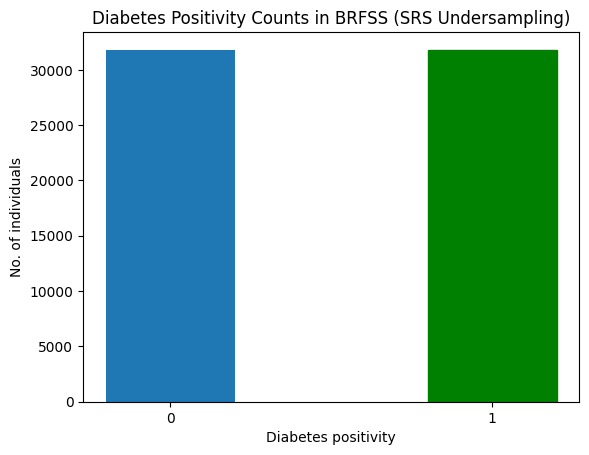

In [42]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Undersampling)")
plt.show()

In [43]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRS_undersampler(T_train, T_train[6])
print(y_T_train_SRS)


1964
8992
171682    0.0
212930    0.0
176967    0.0
68316     0.0
253412    0.0
         ... 
47021     1.0
197392    1.0
59357     1.0
156689    1.0
45219     1.0
Name: 6, Length: 3928, dtype: float64


In [44]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (50912, 20)
y_S_train: (50912,)
X_S_test: (12728, 20)
y_S_test: (12728,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1547 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1548 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1553 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.7813 - loss: 0.5584 - val_AUC: 0.8172 - val_loss: 0.5240
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8157 - loss: 0.5193 - val_AUC: 0.8189 - val_loss: 0.5171
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.8194 - loss: 0.5147 - val_AUC: 0.8197 - val_loss: 0.5194
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.8244 - loss: 0.5098 - val_AUC: 0.8196 - val_loss: 0.5307
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8249 - loss: 0.5088 - val_AUC: 0.8205 - val_loss: 0.5228
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8229 - loss: 0.5110 - val_AUC: 0.8203 - val_loss: 0.5220
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8283 - loss: 0.5041 - val_AUC: 0.8213 - val_loss: 0.5220
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8287 - loss: 0.5040 - val_AUC: 0.8216 - val_loss: 0.5143
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━

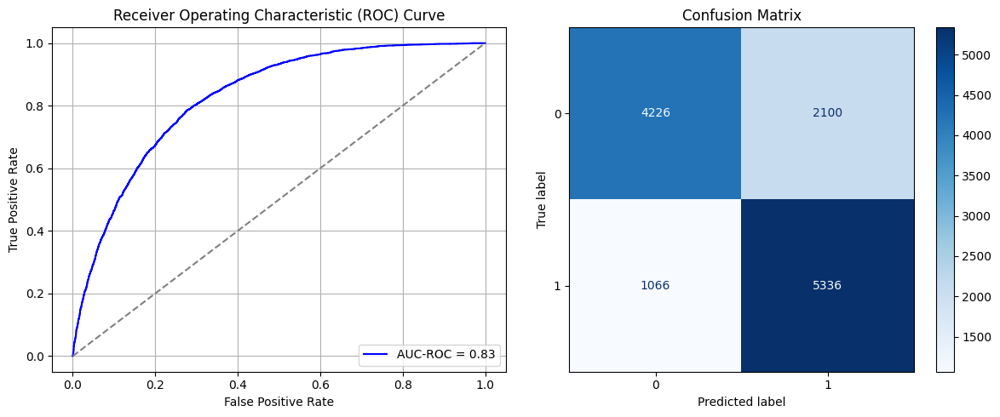

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9585134983062744
Time elapsed (performance): 80.68599939300111


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1555 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1560 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6965 - loss: 0.6655 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7264 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7324 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7439 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7246 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1561 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1562 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1567 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7201 - loss: 0.6482 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7324 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7169 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.7781
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7324 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7310 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.7854
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1568 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1569 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1574 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7294 - loss: 0.6359 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7267 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7438 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7262 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.7861
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7246 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7234 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1575 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1576 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1581 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7095 - loss: 0.6551 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7224 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7405 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7243 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7314 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7486 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7440 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7301 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_226"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1582 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1583 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1584 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1588 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7153 - loss: 0.6507 - val_AUC: 0.0000e+00 - val_loss: 0.7823
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7145 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7329 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9114
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7326 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9282
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7332 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7498
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_227"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1589 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1590 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1591 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1595 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7238 - loss: 0.6442 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8013
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7230 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7447 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7236 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7492
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.7875
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7367 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_228"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1596 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1597 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1598 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1602 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7070 - loss: 0.6564 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7206 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7055 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7162 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7278 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7274 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_229"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1603 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1604 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1605 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1609 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7228 - loss: 0.6424 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7161 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7264 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7056 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7186 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_230"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1610 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1611 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1612 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1616 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7313 - loss: 0.6336 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7252 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7353 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7259 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7293 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7331 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_231"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1617 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1618 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1619 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1623 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7087 - loss: 0.6507 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7087 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7178 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7177
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7251 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7228
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_232"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1624 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1625 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1626 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1630 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6963 - loss: 0.6689 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7196 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7159 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7446 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7253 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7058
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7335 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_233"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1631 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1632 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1633 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1637 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7009 - loss: 0.6679 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7246 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9478
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.7971
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7251 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8060
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7251 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7250 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7319
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7577
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1638 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1639 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1640 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1644 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6966 - loss: 0.6688 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7152 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7219 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7434 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7304 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7258 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1645 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1646 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1647 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1651 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7109 - loss: 0.6573 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7271 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7388 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.7277
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7352 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7422 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7426 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7305 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1652 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1653 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1654 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1658 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7218 - loss: 0.6520 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7455 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7346 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7333 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1659 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1660 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1661 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1665 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7276 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7154 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7386 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7327 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7273 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9407
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1666 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1667 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1668 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1672 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7046 - loss: 0.6640 - val_AUC: 0.0000e+00 - val_loss: 0.7997
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7155 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7216 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9905
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1673 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1674 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1675 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1679 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6954 - loss: 0.6724 - val_AUC: 0.0000e+00 - val_loss: 0.7653
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7213 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7259 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7167 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8049
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1680 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1681 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1682 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1686 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7098 - loss: 0.6560 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7060 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7289 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7174 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7485 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7402 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1687 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1688 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1689 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1693 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7071 - loss: 0.6641 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7405 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7525 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7313 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1694 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1695 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1696 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1700 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.7834 - loss: 0.5561 - val_AUC: 0.8128 - val_loss: 0.5244
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8163 - loss: 0.5193 - val_AUC: 0.8158 - val_loss: 0.5249
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.8214 - loss: 0.5122 - val_AUC: 0.8167 - val_loss: 0.5217
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8260 - loss: 0.5077 - val_AUC: 0.8192 - val_loss: 0.5179
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8223 - loss: 0.5113 - val_AUC: 0.8204 - val_loss: 0.5161
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.8271 - loss: 0.5044 - val_AUC: 0.8193 - val_loss: 0.5177
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8278 - loss: 0.5051 - val_AUC: 0.8201 - val_loss: 0.5174
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8271 - loss: 0.5055 - val_AUC: 0.8209 - val_loss: 0.5163
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━

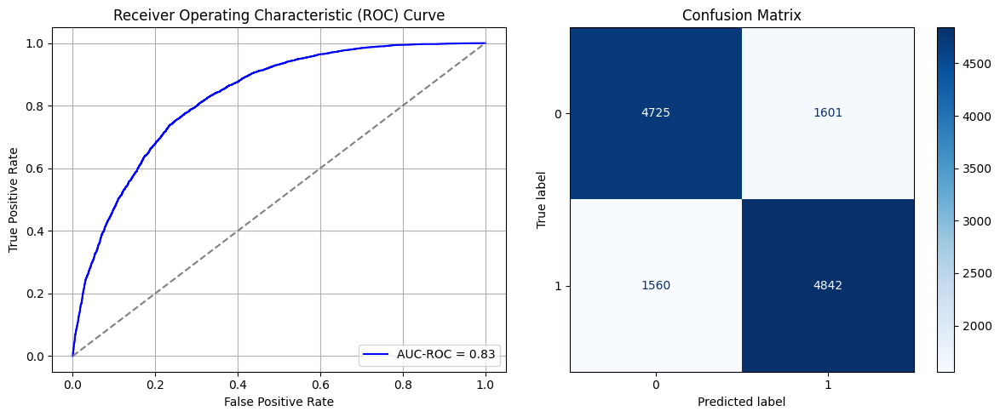

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.964344322681427
Time elapsed (performance): 76.59813781699995


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1701 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1702 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1703 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1707 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6947 - loss: 0.6555 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7144 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7133 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7236 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9514
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1708 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1709 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1710 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1714 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6984 - loss: 0.6467 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7150 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7184 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7364 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7392 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.7625
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1715 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1716 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1717 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1721 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6983 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6977 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7276 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7365 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7335 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7391 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7289 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1722 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1723 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1724 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1728 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6946 - loss: 0.6507 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7032 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7052 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7160 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7113 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7260 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1729 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1730 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1731 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1735 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7150 - loss: 0.6324 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7152 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7187 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7101 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1736 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1737 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1738 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1742 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6979 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7073 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7034 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7346 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7255 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7351 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7248 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1743 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1744 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1745 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1749 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7030 - loss: 0.6363 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7073 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7153 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1750 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1751 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1752 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1756 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6998 - loss: 0.6452 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7132 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9031
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7234 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7554 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1757 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1758 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1759 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1763 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6952 - loss: 0.6538 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7063 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7015 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7097 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7300 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7254 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1764 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1765 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1766 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1770 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6976 - loss: 0.6472 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7086 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7207 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7349 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.7324
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7375 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1771 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1772 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1773 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1777 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7068 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7173 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7216 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7527 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1778 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1779 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1780 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1784 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6932 - loss: 0.6446 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6984 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7120 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7239 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7087 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1785 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1786 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1787 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1791 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7101 - loss: 0.6450 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7131 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7193 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7196 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7313 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7215 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1792 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1793 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1794 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1798 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7017 - loss: 0.6398 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7079 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6990 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7255 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7311 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1799 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1800 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1801 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1805 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6755 - loss: 0.6705 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6957 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6924 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7047 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7317 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.7770
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1806 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1807 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1808 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1812 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.6986 - loss: 0.6440 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7006 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7176 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7282 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7197 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7119 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1813 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1814 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1815 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1819 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7067 - loss: 0.6452 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7214 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7139 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7143 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7309 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7177 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7420 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1820 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1821 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1822 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1826 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7063 - loss: 0.6370 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7007 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7205 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7027 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8106
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7190 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7171 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7268 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7449 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1827 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1828 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1829 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1833 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7058 - loss: 0.6410 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7032 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7587
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7223 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7303 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.7890
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7115 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.7577
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1834 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1835 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1836 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1840 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6981 - loss: 0.6482 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7038 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8623
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7250 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7240 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7283 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.7903
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1841 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1842 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1843 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1847 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.7628 - loss: 0.5710 - val_AUC: 0.8158 - val_loss: 0.5223
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8187 - loss: 0.5166 - val_AUC: 0.8164 - val_loss: 0.5206
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8214 - loss: 0.5134 - val_AUC: 0.8183 - val_loss: 0.5176
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8229 - loss: 0.5111 - val_AUC: 0.8197 - val_loss: 0.5174
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.8233 - loss: 0.5114 - val_AUC: 0.8204 - val_loss: 0.5165
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8278 - loss: 0.5047 - val_AUC: 0.8200 - val_loss: 0.5161
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.8259 - loss: 0.5076 - val_AUC: 0.8200 - val_loss: 0.5241
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8265 - loss: 0.5076 - val_AUC: 0.8200 - val_loss: 0.5242
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━

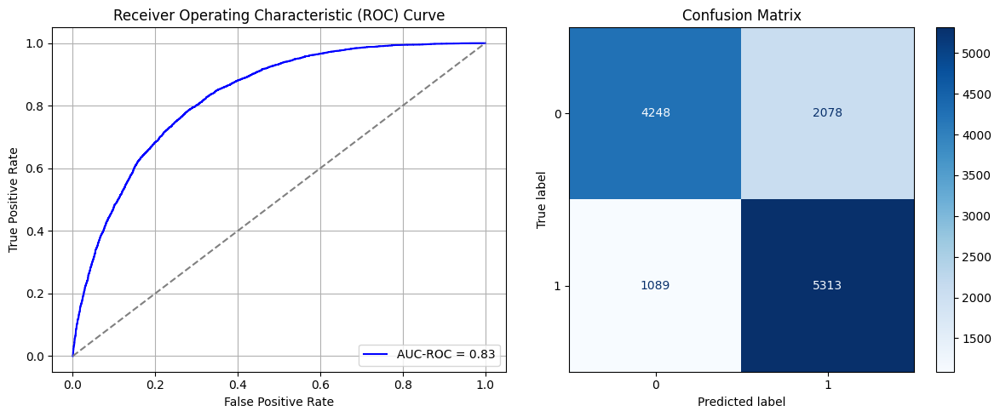

Best threshold based on F1-score: 0.47175249457359314
Time elapsed (performance): 77.7779953370009


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1848 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1849 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1850 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1854 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7167 - loss: 0.6924 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7227 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7499
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7383 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7536 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7382 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1855 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1856 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1857 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1861 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7046 - loss: 0.7094 - val_AUC: 0.0000e+00 - val_loss: 0.7358
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7388 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7404 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7365 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7588 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1862 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1863 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1864 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1868 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7029 - loss: 0.7271 - val_AUC: 0.0000e+00 - val_loss: 0.7456
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7406 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7408 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7450 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.6723
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7381 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7336 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7486 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.7703
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1869 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1870 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1871 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1875 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7028 - loss: 0.7165 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7352 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7541 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.7246
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7373 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7394 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7266 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7382 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.7823
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1876 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1877 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1878 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1882 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7137 - loss: 0.6967 - val_AUC: 0.0000e+00 - val_loss: 0.7539
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7317 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7491 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.7016
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7351 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7341 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7600 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7516 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7407
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1883 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1884 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1885 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1889 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6928 - loss: 0.7164 - val_AUC: 0.0000e+00 - val_loss: 0.7817
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7531 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7275 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7318 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.7499
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7445 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1890 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1891 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1892 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1896 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7066 - loss: 0.7074 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7447 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7318 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7441 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7559
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7504 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7445 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7478 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7530 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1897 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1898 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1899 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1903 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6987 - loss: 0.7206 - val_AUC: 0.0000e+00 - val_loss: 0.7452
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7415 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7362 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7264 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7362 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7482 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1904 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1905 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1906 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1910 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7093 - loss: 0.7045 - val_AUC: 0.0000e+00 - val_loss: 0.7489
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.7664
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.7822
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7426 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7438 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1911 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1912 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1913 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1917 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7125 - loss: 0.6907 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7373 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7407 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7416 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.7122
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7339 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7421 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1918 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1919 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1920 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1924 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7154 - loss: 0.6931 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.7575
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7292 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7320 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7475 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7389 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7464 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.7268
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1925 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1926 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1927 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1931 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7142 - loss: 0.6921 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7874
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7322 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7875
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8152
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7480 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7477 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7393 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1932 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1933 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1934 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1938 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7053 - loss: 0.7021 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7369 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.7875
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7291 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7414 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7306 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7298 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7359 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7581
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1939 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1940 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1941 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1945 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6998 - loss: 0.7126 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7294 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7329 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.7633
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7420 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.7393
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7505 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1946 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1947 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1948 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1952 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7259 - loss: 0.6790 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7216 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9240
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7285 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.7302
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7431 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8061
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7408 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7192 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7279 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1953 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1954 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1955 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1959 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7161 - loss: 0.7001 - val_AUC: 0.0000e+00 - val_loss: 0.7565
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7353 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7483 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7414 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7388 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1960 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1961 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1962 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1966 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7051 - loss: 0.7142 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7254 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7528 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7254 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1967 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1968 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1969 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1973 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7137 - loss: 0.6969 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7339 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.7804
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7823
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7527 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7343 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7897
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7611 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1974 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1975 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1976 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1980 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7108 - loss: 0.7031 - val_AUC: 0.0000e+00 - val_loss: 0.7682
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7405 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7381 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7380 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7521 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7178
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7436 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7247 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7441 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1981 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1982 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1983 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1987 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7338 - loss: 0.6656 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7370 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7512
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7361 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7318 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.7711
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7546 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1988 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1989 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1990 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1994 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.7766 - loss: 0.5614 - val_AUC: 0.8145 - val_loss: 0.5263
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8182 - loss: 0.5163 - val_AUC: 0.8186 - val_loss: 0.5170
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8210 - loss: 0.5134 - val_AUC: 0.8198 - val_loss: 0.5244
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8260 - loss: 0.5068 - val_AUC: 0.8199 - val_loss: 0.5158
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8257 - loss: 0.5081 - val_AUC: 0.8204 - val_loss: 0.5184
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8289 - loss: 0.5036 - val_AUC: 0.8196 - val_loss: 0.5191
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8243 - loss: 0.5083 - val_AUC: 0.8202 - val_loss: 0.5196
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8264 - loss: 0.5062 - val_AUC: 0.8209 - val_loss: 0.5159
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━

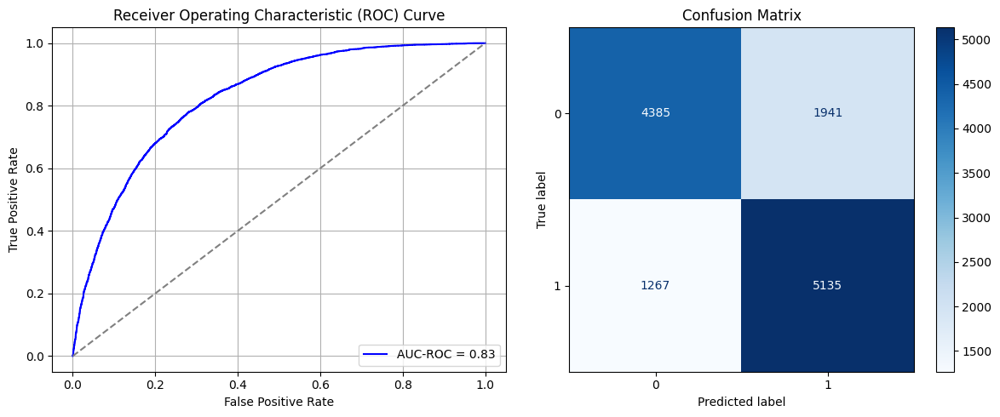

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.983919084072113
Time elapsed (performance): 87.9169577299981


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1995 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1996 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1997 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2001 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7310 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7277 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7117 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7166 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7070 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7127 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2002 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2003 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2008 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7236 - loss: 0.6385 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7066 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7210 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7258 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7105 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7265 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7300 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2009 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2010 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2015 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7161 - loss: 0.6592 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7262 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7240 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7163 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7056 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7232 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2016 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2017 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2022 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7150 - loss: 0.6558 - val_AUC: 0.0000e+00 - val_loss: 0.7764
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7248 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7421 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7256 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7199 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7768
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2023 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2024 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2029 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7058 - loss: 0.6668 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7110 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7295 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7282 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8452
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7288 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7266 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2030 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2031 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2036 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7236 - loss: 0.6520 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7234 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7280 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2037 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2038 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2043 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7202 - loss: 0.6461 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7215 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7152 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7242 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7295 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7265 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2044 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2045 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2050 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6973 - loss: 0.6789 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7251 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7327 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7208 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7085 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7370 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2051 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2052 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2057 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7203 - loss: 0.6476 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7260 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7098 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7246 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7295 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7141 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2058 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2059 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2064 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7271 - loss: 0.6360 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7109 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7260 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7257 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7329 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7253 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7310 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2065 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2066 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2071 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7078 - loss: 0.6606 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7257 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7247 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8243
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7184 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7072 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7298 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7155 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2072 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2073 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2078 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7055 - loss: 0.6598 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7274 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7226 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7161 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7873
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7465 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7379 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7245 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7324 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2079 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2080 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2085 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7180 - loss: 0.6500 - val_AUC: 0.0000e+00 - val_loss: 0.7748
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7122 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7354 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7126 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7109 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7247 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2086 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2087 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2092 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7201 - loss: 0.6467 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7128 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8292
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7261 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7257 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7219 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2093 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2094 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2099 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7289 - loss: 0.6499 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7108 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7193 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8366
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7295 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7148 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7209 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7323 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2100 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2101 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2106 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7241 - loss: 0.6381 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7244 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7283 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7237 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7291 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7354 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2107 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2108 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2113 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7079 - loss: 0.6626 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7109 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7242 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7166 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7285 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7211 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2114 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2115 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2120 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7309 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7232 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7158 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7185 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7277 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7150 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2121 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2122 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2127 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - AUC: 0.7082 - loss: 0.6650 - val_AUC: 0.0000e+00 - val_loss: 0.7557
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7124 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7090 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - AUC: 0.7101 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7320 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7124 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6995 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7150 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2128 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2129 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2134 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7108 - loss: 0.6544 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7121 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7329 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7221 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7383 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7436 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7153 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7336 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2135 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2136 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2141 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - AUC: 0.7767 - loss: 0.5621 - val_AUC: 0.8153 - val_loss: 0.5278
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.8207 - loss: 0.5135 - val_AUC: 0.8179 - val_loss: 0.5260
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - AUC: 0.8204 - loss: 0.5135 - val_AUC: 0.8211 - val_loss: 0.5159
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.8250 - loss: 0.5086 - val_AUC: 0.8205 - val_loss: 0.5235
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.8246 - loss: 0.5096 - val_AUC: 0.8198 - val_loss: 0.5168
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8270 - loss: 0.5047 - val_AUC: 0.8222 - val_loss: 0.5189
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.8278 - loss: 0.5046 - val_AUC: 0.8221 - val_loss: 0.5149
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - AUC: 0.8279 - loss: 0.5055 - val_AUC: 0.8217 - val_loss: 0.5227
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━

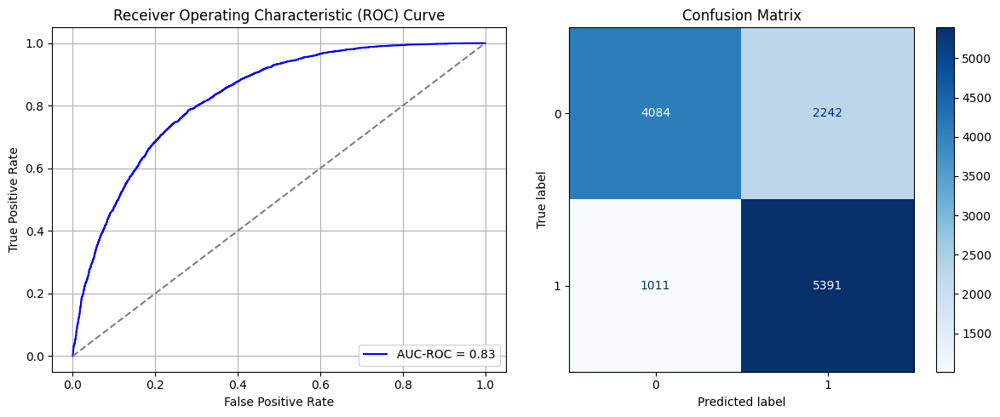

Best threshold based on F1-score: 0.42208588123321533
Time elapsed (performance): 90.16449837800246


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2142 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2143 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2148 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7028 - loss: 0.7204 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7350 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7380 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7873
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7286 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9549
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7266 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7255 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2149 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2150 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2155 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7109 - loss: 0.6940 - val_AUC: 0.0000e+00 - val_loss: 0.7499
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7176 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7233 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7338 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7757
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7091 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7484
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7439 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7396 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7427 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9392
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2156 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2157 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2162 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7225 - loss: 0.7020 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7324 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7472 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7175 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7257 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7282 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7308 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2163 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2164 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2169 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7136 - loss: 0.7112 - val_AUC: 0.0000e+00 - val_loss: 0.7421
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7432 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7185 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7156 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7244 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.7462
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7275 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7397 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2170 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2171 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2176 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7078 - loss: 0.7106 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7306 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7314 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7366 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7453
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7419 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.7731
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7282 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2177 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2178 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2183 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7128 - loss: 0.6870 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7307 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7404 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7403 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7248 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7609
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7334 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8060
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7499 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2184 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2185 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2190 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7083 - loss: 0.6988 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7323 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7350 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7226 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7450 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7387 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7287 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7333 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2191 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2192 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2197 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7008 - loss: 0.7205 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7408 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9263
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7334 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7397 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7469 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2198 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2199 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2204 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7061 - loss: 0.7064 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7303 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7540 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7343 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7355 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7275 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7356
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2205 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2206 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2211 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7084 - loss: 0.7052 - val_AUC: 0.0000e+00 - val_loss: 0.7391
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7351 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7263 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7240 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7439 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8028
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7347 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7502
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7284 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7354 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2212 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2213 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2218 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7167 - loss: 0.6910 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7451 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7318 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7267 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7203 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7372 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7377 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7327 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8254
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2219 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2220 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2225 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7113 - loss: 0.7006 - val_AUC: 0.0000e+00 - val_loss: 0.7463
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7283 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7122 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7469 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7301 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2226 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2227 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2232 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7127 - loss: 0.6955 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7239 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7376 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7325 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7210 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7455 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2233 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2234 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2239 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7152 - loss: 0.6948 - val_AUC: 0.0000e+00 - val_loss: 0.7619
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7378 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.7647
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7241 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7279 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7505 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7393 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7463 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7489
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2240 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2241 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2246 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7338 - loss: 0.6780 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7441 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7317 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.7276
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7428 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7249 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.7915
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7460 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2247 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2248 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2253 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7220 - loss: 0.6862 - val_AUC: 0.0000e+00 - val_loss: 0.7797
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7305 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.7808
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7286 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7361 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7299 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8292
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7256 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7388 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2254 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2255 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2260 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7086 - loss: 0.7054 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7287 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7246 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7369 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7510 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7390 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7395 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7422 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2261 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2262 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2267 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7092 - loss: 0.6993 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7351 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7375 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.7850
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7190 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7364 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7258 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7287 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7252 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2268 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2269 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2274 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7152 - loss: 0.6950 - val_AUC: 0.0000e+00 - val_loss: 0.7409
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7252 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7282 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7354 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2275 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2276 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2281 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7159 - loss: 0.6917 - val_AUC: 0.0000e+00 - val_loss: 0.7633
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7356 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7308 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7258
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7325 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7369
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7357 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7436 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7256 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

In [45]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']



In [48]:
print(ParamFit)
ParamFit.to_csv('SRS_Fine_Tuning.csv')

         FPR       FNR
0   0.089991  0.737527
1   0.267779  0.420824
2   0.255487  0.438178
3   0.144864  0.616052
4   0.237928  0.466377
..       ...       ...
95  0.217296  0.485900
96  0.205882  0.501085
97  0.295874  0.388286
98  0.163740  0.566161
99  0.264267  0.420824

[100 rows x 2 columns]


In [47]:
ParamFit['FNR'].mean()

np.float64(0.5218655097613883)

## Simple Random Sampling with Replacement:

In [49]:
X_S_SRSwR, y_S_SRSwR = SRSwR_undersampler(data_S_full, data_S_full['Diabetes_binary'])
print(y_S_SRSwR)

31820
208165
19873     0
34215     0
22174     0
234103    0
145395    0
         ..
253630    1
253636    1
253659    1
253670    1
253679    1
Name: Diabetes_binary, Length: 63640, dtype: int64


In [50]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRSwR, y_S_SRSwR, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRSwR, y_T_train_SRSwR = SRSwR_undersampler(T_train, T_train[6])
print(y_T_train_SRSwR)

1964
8992
53070     0.0
156329    0.0
29986     0.0
244955    0.0
248787    0.0
         ... 
47021     1.0
197392    1.0
59357     1.0
156689    1.0
45219     1.0
Name: 6, Length: 3928, dtype: float64


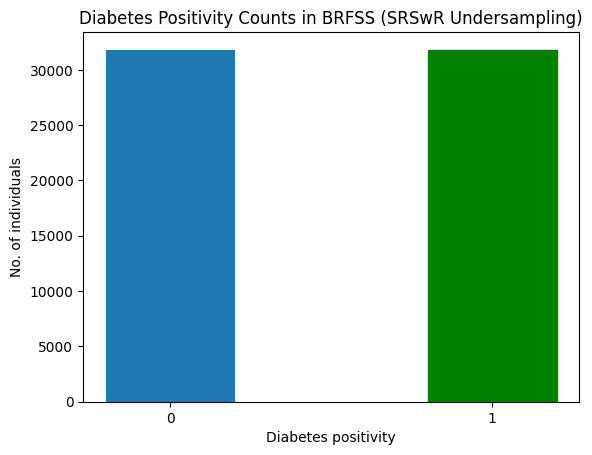

In [51]:
barlist = plt.bar([str(0),str(1)], y_S_SRSwR.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRSwR Undersampling)")
plt.show()

In [52]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (50912, 20)
y_S_train: (50912,)
X_S_test: (12728, 20)
y_S_test: (12728,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2282 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2283 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2288 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.7829 - loss: 0.5570 - val_AUC: 0.8153 - val_loss: 0.5351
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8171 - loss: 0.5175 - val_AUC: 0.8197 - val_loss: 0.5203
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8213 - loss: 0.5115 - val_AUC: 0.8220 - val_loss: 0.5222
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8204 - loss: 0.5144 - val_AUC: 0.8212 - val_loss: 0.5192
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8252 - loss: 0.5071 - val_AUC: 0.8228 - val_loss: 0.5124
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8239 - loss: 0.5078 - val_AUC: 0.8237 - val_loss: 0.5147
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8275 - loss: 0.5055 - val_AUC: 0.8240 - val_loss: 0.5115
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8228 - loss: 0.5090 - val_AUC: 0.8239 - val_loss: 0.5143
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━

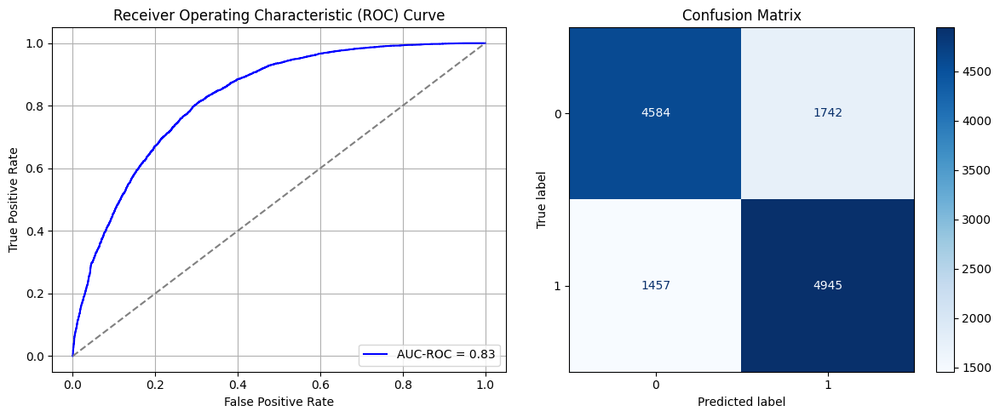

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9827386736869812
Time elapsed (performance): 60.180893060001836


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2289 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2290 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2295 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6728 - loss: 0.6960 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6824 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7194 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7065 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7017 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6998 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6954 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2296 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2297 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2302 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6887 - loss: 0.6723 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6993 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7141 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6964 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6995 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6943 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7169 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2303 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2304 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2309 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6945 - loss: 0.6732 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6935 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7008 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7127 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7152 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7149 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7144 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2310 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2311 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2316 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6842 - loss: 0.6829 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6952 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7002 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7071 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6985 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7137 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6828 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6940 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2317 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2318 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2323 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6781 - loss: 0.6926 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7071 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7085 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7065 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7136 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7002 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7099 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9199
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2324 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2325 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2330 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6996 - loss: 0.6610 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7118 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6999 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6874 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6979 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7166 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7027 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7006 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2331 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2332 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2337 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7063 - loss: 0.6582 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6857 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6987 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7036 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6996 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7035 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6954 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6998 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2338 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2339 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2344 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6998 - loss: 0.6595 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7035 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7022 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6954 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6959 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7022 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7071 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6914 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2345 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2346 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2351 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7121 - loss: 0.6521 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7004 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6968 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6969 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7102 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7107 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6877 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7037 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2352 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2353 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2358 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6885 - loss: 0.6765 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7050 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7118 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7043 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6951 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.8783
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7091 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7028 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7055 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2359 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2360 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2365 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6910 - loss: 0.6762 - val_AUC: 0.0000e+00 - val_loss: 0.9589
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6971 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6967 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6945 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7057 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7016 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7060 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7049 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9211
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2366 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2367 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2372 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6934 - loss: 0.6716 - val_AUC: 0.0000e+00 - val_loss: 0.9377
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6971 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.7850
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7019 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6991 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6924 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7045 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7082 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6974 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2373 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2374 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2379 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6980 - loss: 0.6755 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7075 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6994 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6969 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6905 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6899 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7123 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2380 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2381 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2386 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6903 - loss: 0.6727 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6870 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6955 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7028 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7042 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6923 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7060 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2387 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2388 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2393 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7281 - loss: 0.6460 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6939 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7001 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6970 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7078 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7035 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6927 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7065 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2394 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2395 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2400 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6934 - loss: 0.6805 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7108 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7093 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7017 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7134 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6940 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6966 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6947 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2401 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2402 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2407 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6863 - loss: 0.6760 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6932 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6997 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6961 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6997 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6990 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7054 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6864 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_344"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2408 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2409 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2413 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2414 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6736 - loss: 0.7020 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6969 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.9479
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7015 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6912 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7077 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6891 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6981 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6860 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2415 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2416 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2420 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2421 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.6884 - loss: 0.6765 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7021 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9333
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6966 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6980 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6956 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6976 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7035 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6921 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2422 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2423 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2427 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2428 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6894 - loss: 0.6778 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7210 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7002 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7096 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6827 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6967 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7084 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6977 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2429 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2430 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2435 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.7748 - loss: 0.5621 - val_AUC: 0.8158 - val_loss: 0.5310
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8114 - loss: 0.5247 - val_AUC: 0.8196 - val_loss: 0.5238
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8208 - loss: 0.5136 - val_AUC: 0.8187 - val_loss: 0.5198
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8220 - loss: 0.5107 - val_AUC: 0.8190 - val_loss: 0.5279
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8208 - loss: 0.5129 - val_AUC: 0.8203 - val_loss: 0.5171
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8244 - loss: 0.5078 - val_AUC: 0.8219 - val_loss: 0.5136
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8284 - loss: 0.5023 - val_AUC: 0.8227 - val_loss: 0.5119
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.8228 - loss: 0.5106 - val_AUC: 0.8213 - val_loss: 0.5188
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━

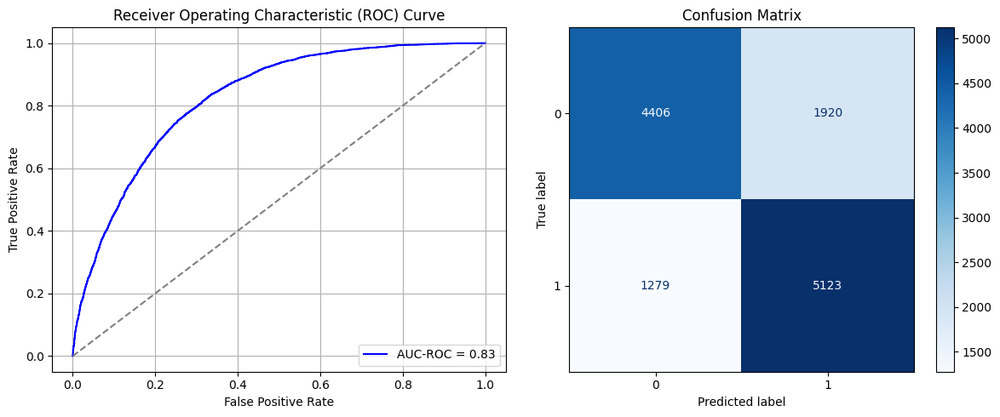

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9853456616401672
Time elapsed (performance): 62.87186981500054


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2436 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2437 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2442 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7038 - loss: 0.7036 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7167 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7371 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8243
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7376 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7898
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2443 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2444 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2449 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7054 - loss: 0.7045 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7052 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.7542
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7224 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.7955
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7436 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2450 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2451 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2456 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7217 - loss: 0.6922 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7396 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7320 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7254 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7235 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7278 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7919
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7435 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8015
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7339 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2457 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2458 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2463 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7121 - loss: 0.6917 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7788
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.7588
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7677
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7381 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2464 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2465 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2470 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7020 - loss: 0.7126 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7127 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7129 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7264 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2471 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2472 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2477 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7202 - loss: 0.6817 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7178 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7251 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7441 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7510 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2478 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2479 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2484 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - AUC: 0.7166 - loss: 0.6903 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6981 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7323 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7332 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.7680
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2485 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2486 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2491 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7124 - loss: 0.6931 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7178 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7377 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.9611
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7214 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7290 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7289 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7279 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7404 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2492 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2493 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2498 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7218 - loss: 0.6811 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7151 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7304 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8292
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7222 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7436 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7428 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7397 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2499 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2500 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2505 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7109 - loss: 0.6846 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7274 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7347 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2506 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2507 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2512 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7178 - loss: 0.6905 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7332 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7539 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2513 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2514 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2519 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7311 - loss: 0.6784 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7265 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7277 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7336 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2520 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2521 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2526 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7204 - loss: 0.6857 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7271 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7375 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7311 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7392 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7370 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2527 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2528 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2533 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6951 - loss: 0.7064 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7155 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7173 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7456 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7357 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8106
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7366 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2534 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2535 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2540 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7209 - loss: 0.6822 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7307 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7246 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7351 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7317 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2541 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2542 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2547 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7097 - loss: 0.6865 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7247 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9789
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7316 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2548 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2549 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2554 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7137 - loss: 0.6968 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7201 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7189 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7324 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7431 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7373 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7366 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2555 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2556 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2561 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7212 - loss: 0.6834 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7295 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7278 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7389 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7399 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.7898
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7450 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7257 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7415 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2562 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2563 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2568 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7241 - loss: 0.7002 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7127 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7209 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7356 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7430 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7410 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2569 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2570 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2575 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7261 - loss: 0.6751 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7269 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.7890
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7417 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7056 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7329 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7473
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2576 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2577 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2582 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.7793 - loss: 0.5636 - val_AUC: 0.8160 - val_loss: 0.5217
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8166 - loss: 0.5189 - val_AUC: 0.8184 - val_loss: 0.5262
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8218 - loss: 0.5126 - val_AUC: 0.8207 - val_loss: 0.5154
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8255 - loss: 0.5076 - val_AUC: 0.8209 - val_loss: 0.5149
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8247 - loss: 0.5089 - val_AUC: 0.8220 - val_loss: 0.5153
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - AUC: 0.8241 - loss: 0.5089 - val_AUC: 0.8229 - val_loss: 0.5124
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.8290 - loss: 0.5025 - val_AUC: 0.8212 - val_loss: 0.5174
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8232 - loss: 0.5098 - val_AUC: 0.8214 - val_loss: 0.5149
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━

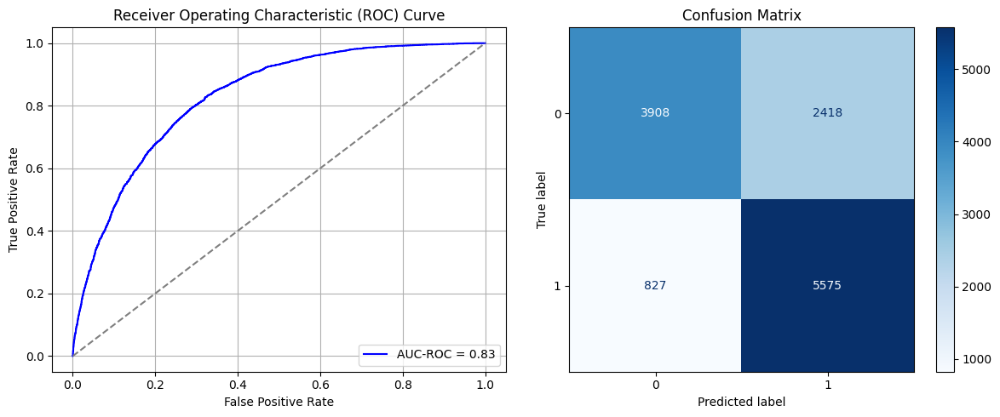

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9684940576553345
Time elapsed (performance): 87.76276467700154


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2583 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2584 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2589 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6983 - loss: 0.6885 - val_AUC: 0.0000e+00 - val_loss: 0.8243
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7021 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7129 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7215 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7141 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7056 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7341 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7252 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2590 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2591 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2596 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6806 - loss: 0.7134 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7325 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7042 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7224 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7170 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7189 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.7312
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7246 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2597 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2598 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2603 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7039 - loss: 0.6889 - val_AUC: 0.0000e+00 - val_loss: 0.8060
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7133 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7066 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7113 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7260 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7344 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8929
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2604 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2605 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2610 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6893 - loss: 0.7055 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7079 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7083 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7386
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2611 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2612 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2617 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6841 - loss: 0.7172 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7064 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7216 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7167 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7281 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7270 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7297 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2618 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2619 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2624 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6994 - loss: 0.6924 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7135 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7215 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9349
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7171 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2625 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2626 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2631 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7078 - loss: 0.6879 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7166 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7018 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7122 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7407 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7123 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2632 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2633 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2638 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7048 - loss: 0.6945 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7173 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7212 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8066
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7203 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2639 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2640 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2645 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7098 - loss: 0.6838 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7194 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7097 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7121 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7214 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7127 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8086
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7153 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2646 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2647 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2652 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6960 - loss: 0.7006 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7040 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7219 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2653 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2654 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2659 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7029 - loss: 0.6922 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7151 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8015
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7168 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7178 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7197 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7037 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2660 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2661 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2666 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7036 - loss: 0.6800 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7110 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7093 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7115 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7154 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7034 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7264 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7285 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2667 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2668 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2673 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7129 - loss: 0.6784 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.7810
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7113 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7176 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7149 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7187 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.7184
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7112 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2674 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2675 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2680 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6992 - loss: 0.7007 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7178 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7216 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.7855
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7120 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7258 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2681 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2682 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2687 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7045 - loss: 0.6838 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.7721
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7048 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7224 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7199 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7113 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7465 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2688 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2689 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2694 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7057 - loss: 0.6831 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7082 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7168 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7271 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7300 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7224 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2695 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2696 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2701 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7044 - loss: 0.6949 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7156 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7150 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7079 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7004 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2702 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2703 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2708 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6908 - loss: 0.7082 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6976 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7101 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7189 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7086 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7231 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2709 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2710 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2715 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6959 - loss: 0.6991 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7132 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7010 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7188 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7089 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7145 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7206 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2716 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2717 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2722 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6801 - loss: 0.7177 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7102 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7132 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7128 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7141 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7145 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7109 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7082 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2723 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2724 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2729 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.7776 - loss: 0.5644 - val_AUC: 0.8156 - val_loss: 0.5339
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.8143 - loss: 0.5201 - val_AUC: 0.8195 - val_loss: 0.5164
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8175 - loss: 0.5168 - val_AUC: 0.8191 - val_loss: 0.5189
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.8226 - loss: 0.5102 - val_AUC: 0.8200 - val_loss: 0.5168
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8211 - loss: 0.5118 - val_AUC: 0.8212 - val_loss: 0.5161
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.8246 - loss: 0.5097 - val_AUC: 0.8197 - val_loss: 0.5178
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - AUC: 0.8243 - loss: 0.5090 - val_AUC: 0.8220 - val_loss: 0.5163
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8250 - loss: 0.5076 - val_AUC: 0.8230 - val_loss: 0.5124
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━

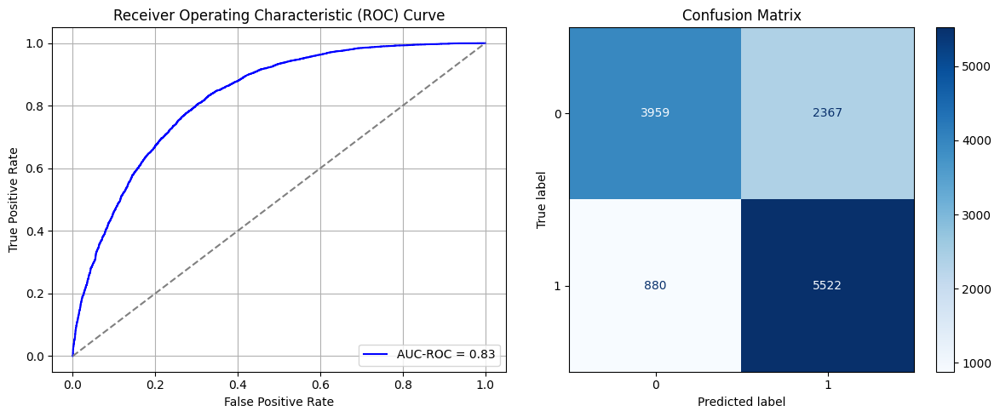

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9804182052612305
Time elapsed (performance): 89.19169108500137


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2730 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2731 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2736 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6986 - loss: 0.7098 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7165 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7044 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7138 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7102 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7029 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7177 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2737 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2738 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2743 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6852 - loss: 0.7508 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7033 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7166 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6990 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6984 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7069 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7090 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7031 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2744 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2745 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2750 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6897 - loss: 0.7280 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7062 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7035 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7066 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7101 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7090 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6930 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2751 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2752 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2757 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6871 - loss: 0.7309 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7000 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6984 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7090 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6963 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6971 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7035 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2758 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2759 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2764 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6881 - loss: 0.7075 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6970 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.7549
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7117 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7085 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6986 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6929 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7004 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6985 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2765 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2766 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2771 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6823 - loss: 0.7330 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7121 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7153 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7081 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7186 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7060 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7129 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2772 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2773 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2778 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6972 - loss: 0.7158 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6927 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7038 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7090 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2779 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2780 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2785 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7140 - loss: 0.6946 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6981 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6936 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7077 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7150 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6929 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6908 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7119 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2786 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2787 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2792 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7074 - loss: 0.7049 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7118 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7093 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6996 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6908 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6859 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2793 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2794 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2799 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6744 - loss: 0.7370 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6979 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7055 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7008 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6999 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6922 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7065 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7056 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2800 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2801 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2806 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6999 - loss: 0.7176 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6963 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7119 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7092 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6992 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7028 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6980 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7051 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2807 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2808 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2813 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6978 - loss: 0.7176 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7008 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7036 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7137 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7008 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7132 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7135 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6955 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2814 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2815 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2820 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6985 - loss: 0.7094 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6873 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7060 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7093 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7100 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7136 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7037 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2821 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2822 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2827 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6970 - loss: 0.7199 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7051 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6886 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7064 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7112 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7055 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7058 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2828 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2829 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2834 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6935 - loss: 0.7273 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7115 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6988 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7007 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7015 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7069 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7016 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7141 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2835 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2836 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2841 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6927 - loss: 0.7259 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6997 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7142 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7219 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6989 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7082 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2842 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2843 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2848 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7146 - loss: 0.6956 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7140 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7094 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6881 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7146 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6966 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6935 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7128 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2849 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2850 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2855 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6891 - loss: 0.7291 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6927 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7112 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7000 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7045 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.7906
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7026 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7164 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7041 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2856 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2857 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2862 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7011 - loss: 0.7113 - val_AUC: 0.0000e+00 - val_loss: 0.8049
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7087 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7080 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7095 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6981 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6994 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7191 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6957 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2863 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2864 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2869 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6958 - loss: 0.7208 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7073 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7022 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7066 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6880 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6905 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7000 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6966 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2870 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2871 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2876 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.7850 - loss: 0.5552 - val_AUC: 0.8153 - val_loss: 0.5210
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.8177 - loss: 0.5163 - val_AUC: 0.8189 - val_loss: 0.5276
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8192 - loss: 0.5149 - val_AUC: 0.8207 - val_loss: 0.5144
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - AUC: 0.8199 - loss: 0.5143 - val_AUC: 0.8208 - val_loss: 0.5209
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8232 - loss: 0.5099 - val_AUC: 0.8220 - val_loss: 0.5153
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.8247 - loss: 0.5081 - val_AUC: 0.8220 - val_loss: 0.5134
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.8280 - loss: 0.5043 - val_AUC: 0.8212 - val_loss: 0.5158
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.8269 - loss: 0.5065 - val_AUC: 0.8234 - val_loss: 0.5119
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━

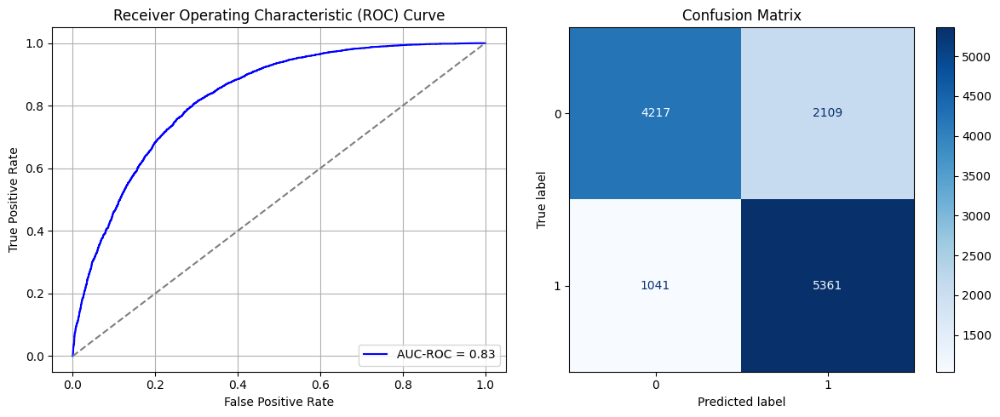

<ipython-input-14-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9780817627906799
Time elapsed (performance): 91.16513323700201


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2877 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2878 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2883 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7118 - loss: 0.6883 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7234 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9379
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7074 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8366
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7137 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7231 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7021 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7209 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2884 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2885 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2890 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7063 - loss: 0.7123 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7092 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7071 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7231 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7070 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7177 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7170 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7289 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2891 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2892 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2897 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7224 - loss: 0.6836 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7247 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7026 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.7702
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7054 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7335 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7250 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7264 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2898 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2899 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2904 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - AUC: 0.7134 - loss: 0.6956 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7127 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7172 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7278 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7182 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7195 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7145 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.7282
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2905 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2906 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2911 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7051 - loss: 0.7033 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7187 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7180 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7107 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7269 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7142 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2912 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2913 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2918 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7028 - loss: 0.6977 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7214 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7124 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7148 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7099 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7101 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7244 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7220 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_417"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2919 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2920 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2925 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7113 - loss: 0.6923 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7320 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7105 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7128 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7169 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7165 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7143 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_418"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2926 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2927 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2932 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7091 - loss: 0.6913 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7080 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7172 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7020 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7125 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7111 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7159 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7247 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_419"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2933 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2934 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2939 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.6952 - loss: 0.7205 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7143 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7196 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7242 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7134 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7109 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7269 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_420"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2940 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2941 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2946 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7132 - loss: 0.6988 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7157 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7137 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7190 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7284 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7308 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7125 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7190 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_421"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2947 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2948 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2953 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7226 - loss: 0.6784 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7144 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7208 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9262
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7135 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7247 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7082 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7117 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_422"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2954 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2955 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2960 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7095 - loss: 0.6979 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7090 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7180 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6975 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7017 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7198 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7089 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_423"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2961 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2962 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2967 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6986 - loss: 0.7045 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7088 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7211 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7055 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7278 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7295 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7179 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_424"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2968 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2969 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2974 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7049 - loss: 0.7057 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7112 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7142 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7166 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7149 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7213 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7254 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7197 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_425"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2975 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2976 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2981 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.6958 - loss: 0.7226 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6977 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7186 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7250 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7155 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7092 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7612
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7255 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7171 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_426"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2982 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2983 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2988 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7124 - loss: 0.6959 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7086 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7159 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7169 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7303 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7269 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7030 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.7378
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7410 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_427"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2989 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2990 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2995 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7147 - loss: 0.7058 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7025 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7124 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7229 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7250 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7788
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7078 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7037 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9762
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7177 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_428"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2996 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2997 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3002 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7166 - loss: 0.6805 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7190 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7214 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7372 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7138 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7225 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_429"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3003 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3004 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3009 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.6952 - loss: 0.7135 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7334 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7200 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6966 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7116 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7378 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7194 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_430"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3010 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3011 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3016 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6965 - loss: 0.7033 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7113 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6977 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7199 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7197 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7115 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

In [53]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRSwR = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRSwR, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)

In [54]:
print(ParamFit)
ParamFit.to_csv('SRSwR_Fine_Tuning.csv')

         FPR       FNR
0   0.189640  0.574837
1   0.161984  0.613883
2   0.281387  0.442516
3   0.188762  0.572668
4   0.194030  0.561822
..       ...       ...
95  0.266462  0.444685
96  0.288850  0.407809
97  0.209833  0.524946
98  0.317823  0.360087
99  0.247147  0.475054

[100 rows x 2 columns]


In [55]:
ParamFit['FNR'].mean()

np.float64(0.5446854663774405)

## Systematic Sampling:

First, we select a single systematic sample from the majority class, in which $k = \frac{N_0}{N_1}$, where $N_0$ is the majority class size in the source domain and $N_1$ is the minority class in the source domain.

In [23]:
X_S_Sy, y_S_Sy = systematic_undersampler(data_S_full, data_S_full['Diabetes_binary'])
# print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_undersampler(T_train, T_train[6])
# print(y_T_train_Sy)


31820
208165
6.5419547454431175
3
1964
8992
4.5784114052953155
4


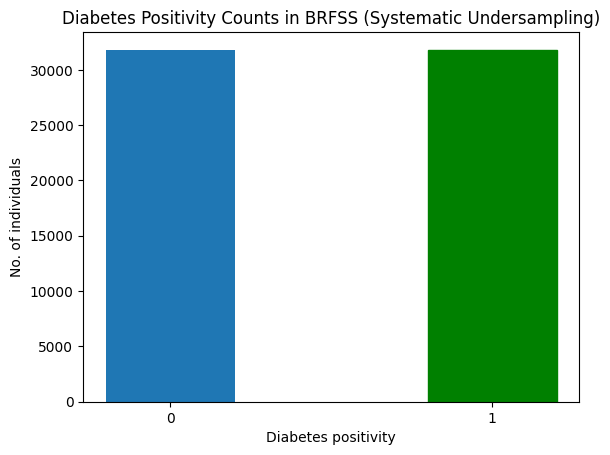

In [24]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Undersampling)")
plt.show()

In [25]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (50912, 20)
y_S_train: (50912,)
X_S_test: (12728, 20)
y_S_test: (12728,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - AUC: 0.7804 - loss: 0.5577 - val_AUC: 0.8188 - val_loss: 0.5208
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - AUC: 0.8196 - loss: 0.5136 - val_AUC: 0.8218 - val_loss: 0.5130
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8190 - loss: 0.5141 - val_AUC: 0.8219 - val_loss: 0.5140
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8233 - loss: 0.5106 - val_AUC: 0.8234 - val_loss: 0.5108
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8250 - loss: 0.5069 - val_AUC: 0.8245 - val_loss: 0.5126
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8242 - loss: 0.5087 - val_AUC: 0.8254 - val_loss: 0.5084
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8261 - loss: 0.5057 - val_AUC: 0.8260 - val_loss: 0.5100
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8332 - loss: 0.4981 - val_AUC: 0.8260 - val_loss: 0.5094
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━

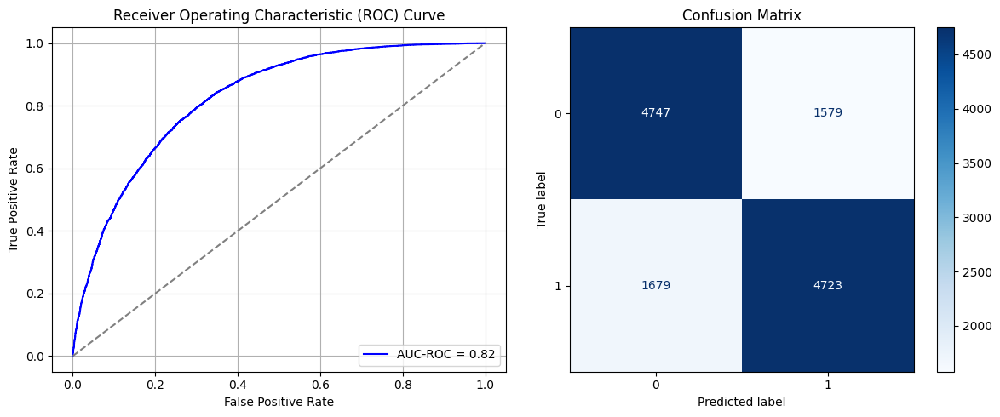

Best threshold based on F1-score: 0.32229477167129517
Time elapsed (performance): 58.404104835


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - AUC: 0.6997 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7092 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7059 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7129 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7266 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9677
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7370 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.7101 - loss: 0.6524 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7076 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6948 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7160 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7223 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7214 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7311 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6927 - loss: 0.6645 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7197 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7072 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7190 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7357 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7415 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7012 - loss: 0.6762 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6950 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7065 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7278 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7406 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - AUC: 0.6985 - loss: 0.6636 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7150 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7069 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8232
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7385 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7426 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6987 - loss: 0.6685 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7034 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7179 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7195 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7398 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7285 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7470 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.7030 - loss: 0.6615 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6931 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6942 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7078 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.7768
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7126 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7241 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7261 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7248 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7065 - loss: 0.6594 - val_AUC: 0.0000e+00 - val_loss: 0.7919
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7148 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7395 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7235 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7248 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7517 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6973 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6951 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6960 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7133 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7381 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7360 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7349 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.9567
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7412 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.6954 - loss: 0.6724 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7190 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7021 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.7803
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7364 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7456 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.9499
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.7160 - loss: 0.6481 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6913 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6866 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7088 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8103
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7164 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7624
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7322 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.7117 - loss: 0.6580 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6895 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6911 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7294 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7229 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.7602
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7272 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7478 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.6913 - loss: 0.6805 - val_AUC: 0.0000e+00 - val_loss: 0.7913
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7087 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6992 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7027 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7080 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7276 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7569
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6879 - loss: 0.6812 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7111 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7035 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6976 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7214 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.7837
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7143 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7234 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7421 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.7731
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7034 - loss: 0.6572 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7023 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.7995
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7173 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7141 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7332 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7391 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7369 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.7855
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6940 - loss: 0.6701 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7036 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6979 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7223 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7151 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7333 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7402 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7783
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7342 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6900 - loss: 0.6666 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6956 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7070 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7145 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7286 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7356 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7500 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - AUC: 0.6793 - loss: 0.6870 - val_AUC: 0.0000e+00 - val_loss: 0.7753
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7051 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6930 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7169 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7353 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - AUC: 0.7038 - loss: 0.6695 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7032 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7127 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9368
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7057 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7286 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7265 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7267 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.6995 - loss: 0.6639 - val_AUC: 0.0000e+00 - val_loss: 0.8072
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7009 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7139 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8254
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7309 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7375 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.7760 - loss: 0.5644 - val_AUC: 0.8160 - val_loss: 0.5229
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8132 - loss: 0.5206 - val_AUC: 0.8209 - val_loss: 0.5185
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8214 - loss: 0.5124 - val_AUC: 0.8193 - val_loss: 0.5257
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8249 - loss: 0.5083 - val_AUC: 0.8232 - val_loss: 0.5122
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8217 - loss: 0.5129 - val_AUC: 0.8243 - val_loss: 0.5105
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8275 - loss: 0.5048 - val_AUC: 0.8235 - val_loss: 0.5161
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8287 - loss: 0.5033 - val_AUC: 0.8256 - val_loss: 0.5119
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8273 - loss: 0.5049 - val_AUC: 0.8239 - val_loss: 0.5126
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━━

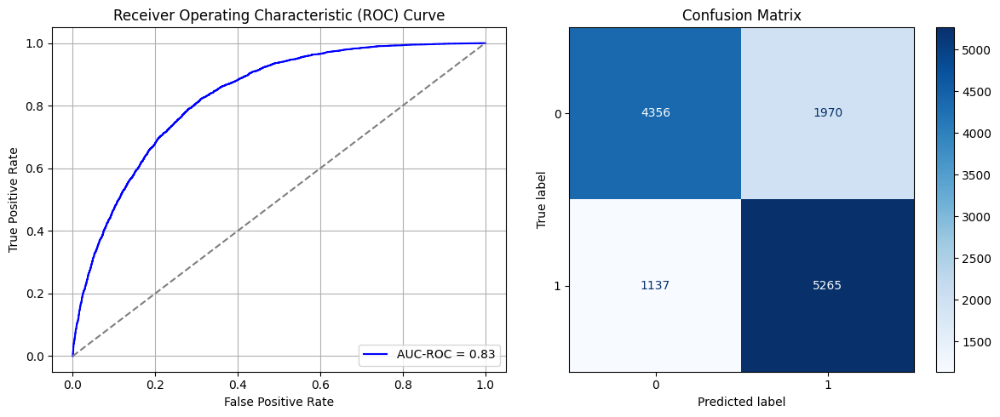

Best threshold based on F1-score: 0.36223670840263367
Time elapsed (performance): 59.241524571000014


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6879 - loss: 0.7084 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6889 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7059 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7009 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6944 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7045 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7152 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7063 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.6957 - loss: 0.7086 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6903 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6866 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7052 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7212 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7016 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7166 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7058 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6951 - loss: 0.7002 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6892 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7011 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7192 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7164 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7018 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7816
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.6911 - loss: 0.7092 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7112 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7054 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7138 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7119 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.6930 - loss: 0.7060 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7091 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7092 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7104 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6968 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7221 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7108 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7107 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - AUC: 0.6783 - loss: 0.7170 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7057 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7047 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7118 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7112 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7060 - loss: 0.6822 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6944 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7274 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7114 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7044 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7091 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6930 - loss: 0.7010 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7028 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7170 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7036 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7248 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7165 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.7906
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7087 - loss: 0.6796 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6992 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6999 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7003 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6911 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7009 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7154 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7074 - loss: 0.6751 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7020 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7119 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7016 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7096 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - AUC: 0.6987 - loss: 0.7031 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7104 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6907 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7127 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7162 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7134 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6933 - loss: 0.7050 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7105 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7111 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7061 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7131 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6951 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7115 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7074 - loss: 0.6857 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6984 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7021 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6841 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7150 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6985 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6768 - loss: 0.7189 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7080 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7017 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7096 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6814 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7110 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7060 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7016 - loss: 0.6977 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6901 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7034 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7253 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7287 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7138 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7201 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7366
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6934 - loss: 0.7079 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7006 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7081 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7145 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7167 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7103 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6882 - loss: 0.7108 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6821 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7044 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6951 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7069 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8232
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7171 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6906 - loss: 0.6992 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7096 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7153 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7139 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7114 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7187 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7062 - loss: 0.6871 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7019 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6844 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6979 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6951 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6968 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6937 - loss: 0.7004 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6908 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7022 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7040 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7159 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7221 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7268 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - AUC: 0.7771 - loss: 0.5613 - val_AUC: 0.8180 - val_loss: 0.5189
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8217 - loss: 0.5121 - val_AUC: 0.8191 - val_loss: 0.5190
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8235 - loss: 0.5086 - val_AUC: 0.8222 - val_loss: 0.5124
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8235 - loss: 0.5105 - val_AUC: 0.8224 - val_loss: 0.5126
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8259 - loss: 0.5066 - val_AUC: 0.8232 - val_loss: 0.5131
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8292 - loss: 0.5022 - val_AUC: 0.8238 - val_loss: 0.5157
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8265 - loss: 0.5053 - val_AUC: 0.8251 - val_loss: 0.5084
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8292 - loss: 0.5013 - val_AUC: 0.8244 - val_loss: 0.5114
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━

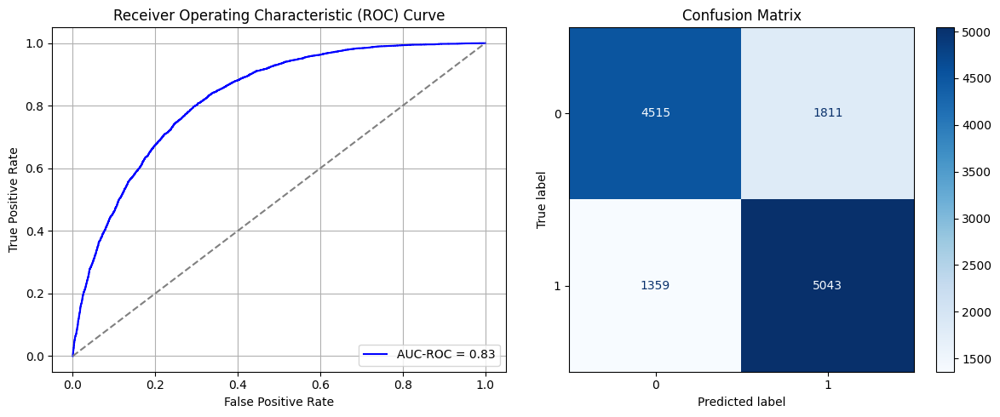

Best threshold based on F1-score: 0.4000909626483917
Time elapsed (performance): 58.50060252000003


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.7366 - loss: 0.6613 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7229 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.7515
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7277 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7455 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7098 - loss: 0.6950 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7453 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7474 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7248 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.7181 - loss: 0.6722 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7333 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7074 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7267 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7355 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7254 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7804
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7314 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - AUC: 0.7005 - loss: 0.7065 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7233 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.7770
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.7613
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7276 - loss: 0.6821 - val_AUC: 0.0000e+00 - val_loss: 0.7552
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7375 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7303 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7196 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7272 - loss: 0.6754 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7205 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7164 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7379 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7459 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7757
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7054 - loss: 0.6959 - val_AUC: 0.0000e+00 - val_loss: 0.7816
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7159 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7304 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7395 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7445 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7204 - loss: 0.6655 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7377 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.7767
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7423 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7401 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7271 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7421 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7101 - loss: 0.6921 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7230 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.7816
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7391 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7412 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.7767
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.6988 - loss: 0.7034 - val_AUC: 0.0000e+00 - val_loss: 0.7808
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.7798
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7246 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7335 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7323 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.7573
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7429 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - AUC: 0.7051 - loss: 0.7081 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7133 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7187 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7133 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7286 - loss: 0.6697 - val_AUC: 0.0000e+00 - val_loss: 0.8103
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7184 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.7824
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7324 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7395 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7295 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7353 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7013 - loss: 0.7014 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7196 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7295 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7458 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7294 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7346 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7264 - loss: 0.6784 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7351 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7159 - loss: 0.6868 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7116 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7386 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7374 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7622
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7305 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - AUC: 0.7139 - loss: 0.6885 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7346 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7356 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7133 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7209 - loss: 0.6821 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7255 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7186 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7263 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7261 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7415 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7270 - loss: 0.6694 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7079 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.7353
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7272 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7286 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7112 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7383 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7245 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7120 - loss: 0.6839 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7323 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7185 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7274 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.7017 - loss: 0.7112 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7460 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7345 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7278 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7365 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7436 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7198 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.7838 - loss: 0.5570 - val_AUC: 0.8198 - val_loss: 0.5267
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.8197 - loss: 0.5137 - val_AUC: 0.8231 - val_loss: 0.5117
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8233 - loss: 0.5099 - val_AUC: 0.8227 - val_loss: 0.5226
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8236 - loss: 0.5095 - val_AUC: 0.8242 - val_loss: 0.5104
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8266 - loss: 0.5058 - val_AUC: 0.8241 - val_loss: 0.5241
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - AUC: 0.8262 - loss: 0.5068 - val_AUC: 0.8244 - val_loss: 0.5109
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8293 - loss: 0.5021 - val_AUC: 0.8239 - val_loss: 0.5124
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8296 - loss: 0.5024 - val_AUC: 0.8258 - val_loss: 0.5075
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━

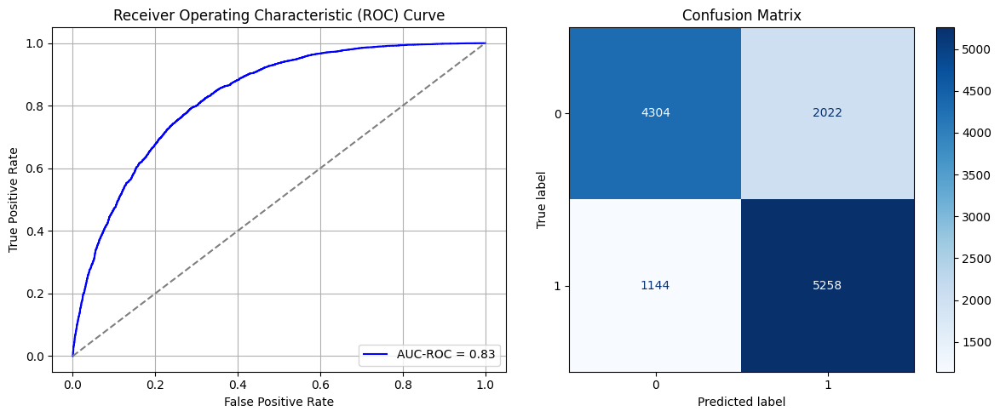

Best threshold based on F1-score: 0.384555459022522
Time elapsed (performance): 73.90735051400009


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.6925 - loss: 0.7068 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7165 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7120 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7391 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7398 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7532 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7188 - loss: 0.6793 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7213 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7248 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7195 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7407 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7309 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7440 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8086
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - AUC: 0.7087 - loss: 0.6944 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7217 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7361 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7389 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.7620
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7429 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6937 - loss: 0.7103 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7250 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7251 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7309 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7375 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8152
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7454 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7107 - loss: 0.6914 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7296 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7253
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7495 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6795 - loss: 0.7167 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7144 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7185 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7298 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7446 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7221 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7315 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7073 - loss: 0.6982 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7097 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7196 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7426 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7301 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7235 - loss: 0.6824 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7173 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7158 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7420 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7490 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.7157 - loss: 0.6801 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7109 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7153 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7405 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7281 - loss: 0.6708 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7224 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9444
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7261 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.7844
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.7710
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7393 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7166 - loss: 0.6793 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7330 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7224 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7505 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8086
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7261 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7358 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7522 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7990
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7198 - loss: 0.6774 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7118 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7846
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7260 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7302 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7373 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6976 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7171 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7340 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7021 - loss: 0.6999 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7175 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7101 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7472 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7534 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7199 - loss: 0.6746 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7355 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7761
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7397 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.7124 - loss: 0.6889 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7247 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8118
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7413 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7837
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7143 - loss: 0.6917 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7307 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7113 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7184 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7321 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7436 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7349 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7212 - loss: 0.6684 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.7816
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7277 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7109 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7171 - loss: 0.6798 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7217 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7246 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7175 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8013
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7385 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7173 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7276 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.7668
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - AUC: 0.7022 - loss: 0.6967 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7072 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7174 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7371 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7382 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.7765 - loss: 0.5652 - val_AUC: 0.8195 - val_loss: 0.5155
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8170 - loss: 0.5170 - val_AUC: 0.8220 - val_loss: 0.5156
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8196 - loss: 0.5142 - val_AUC: 0.8211 - val_loss: 0.5162
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - AUC: 0.8240 - loss: 0.5088 - val_AUC: 0.8239 - val_loss: 0.5192
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8264 - loss: 0.5067 - val_AUC: 0.8256 - val_loss: 0.5108
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8236 - loss: 0.5108 - val_AUC: 0.8252 - val_loss: 0.5086
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8288 - loss: 0.5039 - val_AUC: 0.8265 - val_loss: 0.5082
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8299 - loss: 0.5016 - val_AUC: 0.8240 - val_loss: 0.5141
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━

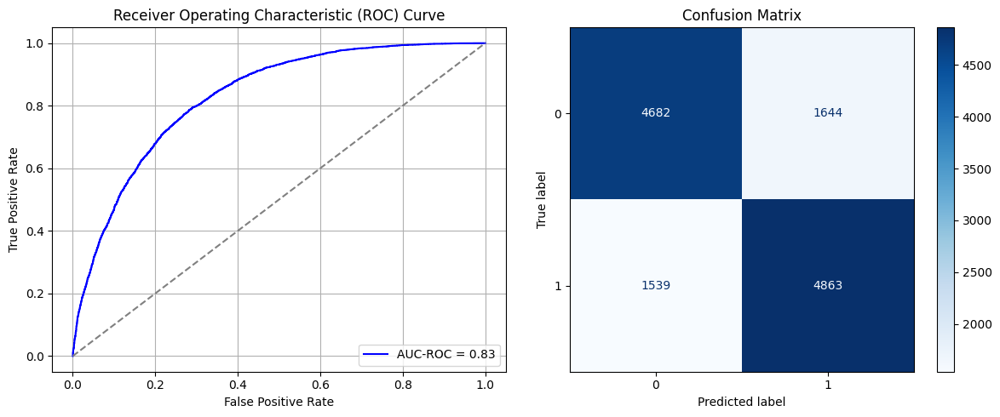

Best threshold based on F1-score: 0.302973210811615
Time elapsed (performance): 67.61649111199995


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7231 - loss: 0.6592 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7551 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7347 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7508 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7355 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7605 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7140 - loss: 0.6710 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7282 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7368 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7317 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7444 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7250 - loss: 0.6577 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7532 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7446 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7536 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7588 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7262 - loss: 0.6559 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7438 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7542 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7682
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7327 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7176 - loss: 0.6661 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7353 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7406 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7337 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7460 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7293 - loss: 0.6549 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7334 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7496 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7522 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.7176
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.7289 - loss: 0.6465 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7424 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7237 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7339 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7524 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 1.0318
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7465 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - AUC: 0.7145 - loss: 0.6670 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7414 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7407 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7804
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7492 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6978 - loss: 0.6782 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7306 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7478 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7470 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7404 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7410 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7148 - loss: 0.6707 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7408 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7407 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7414 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7501 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7379 - loss: 0.6404 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7335 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.7647
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7293 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7408 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7331 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7523 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7223 - loss: 0.6623 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7251 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7318 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7552 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7480 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7132 - loss: 0.6748 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7168 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7303 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7351 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7356 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7344 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.7521
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7505 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7246
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7322 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7211 - loss: 0.6585 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7362 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7515 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7416 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7387 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7442 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7391 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - AUC: 0.7308 - loss: 0.6470 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7358 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7323 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7409 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7517 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7568 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7241 - loss: 0.6554 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7383 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7378 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7396 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7358 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7409 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7436 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7254 - loss: 0.6628 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7270 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7487 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7341 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7440 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7377 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.7347
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - AUC: 0.7236 - loss: 0.6529 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7422 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7422 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7427 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7604
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7365 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7480 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7081 - loss: 0.6668 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7341 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7284 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7812
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7450 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7385 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.7747
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7416 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7899
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7219 - loss: 0.6673 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7350 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7333 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7268 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9783
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

In [26]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [27]:
print(ParamFit)
ParamFit.to_csv('Sy_Fine_Tuning.csv')

         FPR       FNR
0   0.205004  0.485900
1   0.229148  0.457701
2   0.130817  0.613883
3   0.110184  0.657267
4   0.196664  0.509761
..       ...       ...
95  0.211589  0.481562
96  0.172959  0.546638
97  0.219052  0.466377
98  0.144425  0.613883
99  0.237928  0.440347

[100 rows x 2 columns]


In [28]:
ParamFit['FNR'].mean()

np.float64(0.5346637744034708)

## Systematic Sampling (multiple samples):

Now, we investigate the possibility of conducting $m$ systematic samples, each with a sampling interval of $k=m*\frac{N_0}{N_1}$, and obtaining the undersampled majority class data using all $m$ systematic samples combined. This may more closely approximate SRS sampling.

For convenience, we take $m=10$ in this case.

In [35]:
X_S_Sy, y_S_Sy = multi_systematic_undersampler(data_S_full, data_S_full['Diabetes_binary'], 10)
# print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = multi_systematic_undersampler(T_train, T_train[6], 10)
# print(y_T_train_Sy)

31820
208165
6.5419547454431175
1964
8992
4.5784114052953155


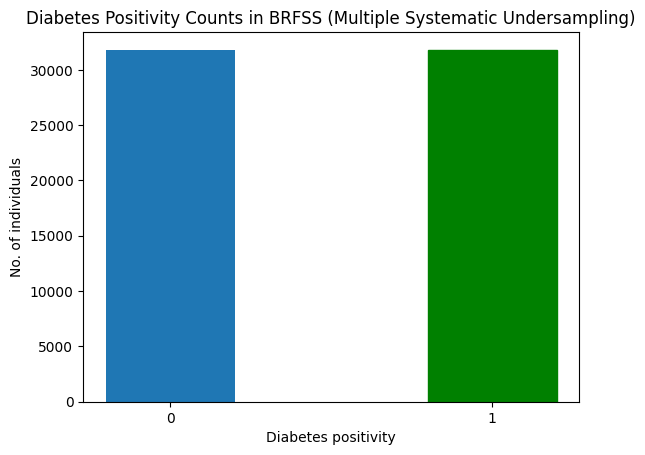

In [36]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Multiple Systematic Undersampling)")
plt.show()

In [37]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (50912, 20)
y_S_train: (50912,)
X_S_test: (12728, 20)
y_S_test: (12728,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1470 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1471 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1476 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.7769 - loss: 0.5623 - val_AUC: 0.8242 - val_loss: 0.5109
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8266 - loss: 0.5055 - val_AUC: 0.8318 - val_loss: 0.5037
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.8296 - loss: 0.5012 - val_AUC: 0.8326 - val_loss: 0.5046
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8289 - loss: 0.5034 - val_AUC: 0.8344 - val_loss: 0.4978
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - AUC: 0.8302 - loss: 0.5008 - val_AUC: 0.8351 - val_loss: 0.4964
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8332 - loss: 0.4976 - val_AUC: 0.8349 - val_loss: 0.5055
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8359 - loss: 0.4941 - val_AUC: 0.8350 - val_loss: 0.4988
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - AUC: 0.8392 - loss: 0.4898 - val_AUC: 0.8356 - val_loss: 0.4982
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━

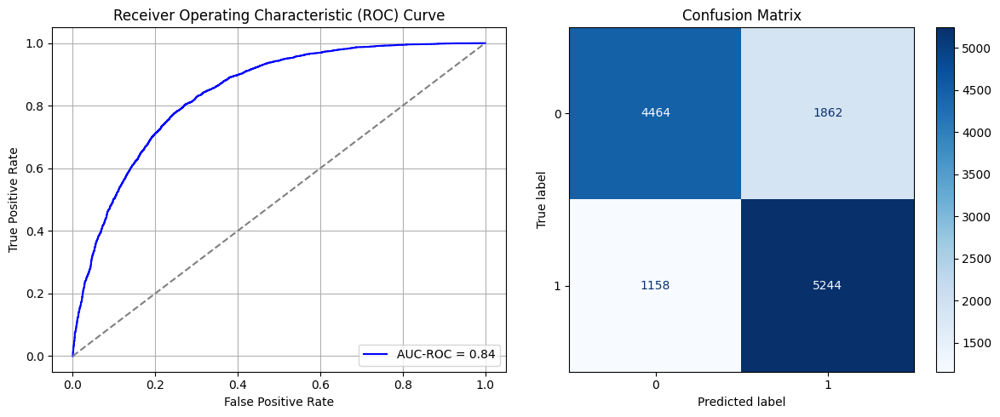

Best threshold based on F1-score: 0.39664605259895325
Time elapsed (performance): 86.6939132360003


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1477 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1478 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1483 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7011 - loss: 0.7272 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7090 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7352 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7346 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7401 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8164
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7444 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7126 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1485 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1490 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7068 - loss: 0.7049 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7249 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7311 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7188 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7180 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7383 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7458 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1491 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1492 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1493 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1497 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7074 - loss: 0.7263 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7205 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7214 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7238 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7330 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7226 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1498 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1499 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1500 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1504 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7204 - loss: 0.7025 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7206 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.7561
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7127 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7468 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1505 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1506 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1507 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1511 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7066 - loss: 0.7309 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7152 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7227 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7439 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1512 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1513 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1514 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1518 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7052 - loss: 0.7054 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7273 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7199 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7452 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7278 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1519 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1520 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1521 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1525 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7142 - loss: 0.7074 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7200 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7325 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7250 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.7804
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7341 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1526 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1527 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1528 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1532 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7054 - loss: 0.7203 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7133 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7253 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.7549
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7436 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.7670
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7290 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7346 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8164
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1533 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1534 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1535 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1539 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.7037 - loss: 0.7243 - val_AUC: 0.0000e+00 - val_loss: 0.7803
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7303 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7459 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7419 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7403 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7479 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7417 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1540 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1541 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1542 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1546 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7124 - loss: 0.7087 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7263 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.7692
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7253 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7217 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.7890
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7195 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7337 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.7571
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1547 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1548 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1553 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7105 - loss: 0.7056 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7250 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7406 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.7231
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.7938
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7770
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7371 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1555 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1560 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - AUC: 0.7330 - loss: 0.6826 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7990
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7223 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7235 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7245 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7401 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7400 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1561 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1562 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1567 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6976 - loss: 0.7414 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7288 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7273 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7236 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7683
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7390 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7383 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7427
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7432 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7460 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1568 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1569 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1574 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7142 - loss: 0.7015 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7234 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7224 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7378 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7358 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7353 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7335 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1575 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1576 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1581 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.6951 - loss: 0.7318 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7226 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7260 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7183 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7201 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7376 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7484
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7463 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_226"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1582 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1583 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1584 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1588 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7140 - loss: 0.7052 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7270 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7188 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7426 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8190
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.7995
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.7736
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_227"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1589 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1590 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1591 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1595 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7083 - loss: 0.7224 - val_AUC: 0.0000e+00 - val_loss: 0.7783
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7294 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7243 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7169 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7071
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7155 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.7426
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7323 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_228"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1596 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1597 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1598 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1602 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7009 - loss: 0.7265 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7236 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7303 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7350 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7246 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7398 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7277 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7292
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7320 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_229"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1603 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1604 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1605 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1609 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7027 - loss: 0.7193 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7219 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.7676
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7381 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8019
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7380 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_230"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1610 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1611 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1612 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1616 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7049 - loss: 0.7173 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7150 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7329 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7317 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7156 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.7303
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7246 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7350 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_231"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1617 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1618 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1619 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1623 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - AUC: 0.7908 - loss: 0.5517 - val_AUC: 0.8258 - val_loss: 0.5073
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - AUC: 0.8259 - loss: 0.5062 - val_AUC: 0.8312 - val_loss: 0.5156
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8287 - loss: 0.5036 - val_AUC: 0.8320 - val_loss: 0.5014
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - AUC: 0.8324 - loss: 0.4988 - val_AUC: 0.8345 - val_loss: 0.4972
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8336 - loss: 0.4967 - val_AUC: 0.8346 - val_loss: 0.5003
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - AUC: 0.8338 - loss: 0.4973 - val_AUC: 0.8337 - val_loss: 0.5017
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.8342 - loss: 0.4956 - val_AUC: 0.8350 - val_loss: 0.4998
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8405 - loss: 0.4888 - val_AUC: 0.8352 - val_loss: 0.4993
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━

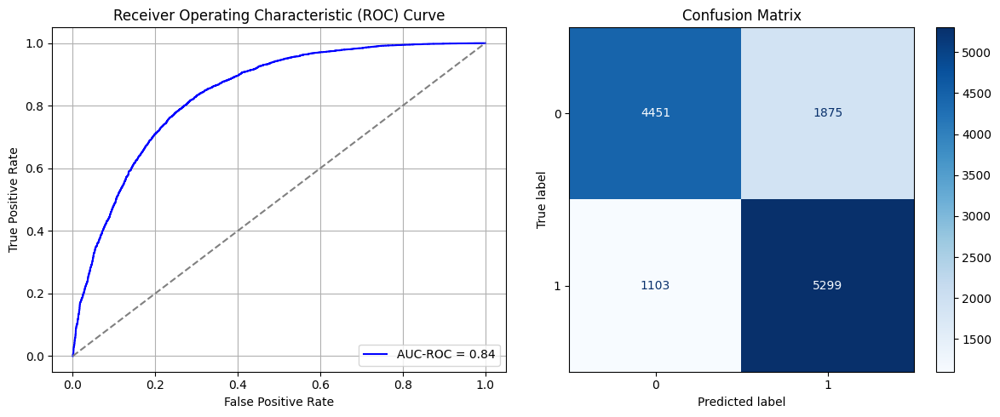

Best threshold based on F1-score: 0.47012120485305786
Time elapsed (performance): 88.03383211499931


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_232"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1624 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1625 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1626 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1630 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6920 - loss: 0.7057 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7022 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7089 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7029 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7143 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7002 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6894 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6945 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_233"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1631 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1632 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1633 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1637 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6921 - loss: 0.7110 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7043 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7033 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6968 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7001 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7170 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7109 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1638 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1639 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1640 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1644 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7078 - loss: 0.6832 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6925 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6903 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8190
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6995 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7139 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7093 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7178 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6990 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1645 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1646 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1647 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1651 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7172 - loss: 0.6838 - val_AUC: 0.0000e+00 - val_loss: 0.7764
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7093 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6965 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7034 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7077 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7167 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7163 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7010 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1652 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1653 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1654 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1658 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7148 - loss: 0.6871 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7033 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7068 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7145 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6921 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6877 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7239 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7273 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1659 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1660 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1661 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1665 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6797 - loss: 0.7242 - val_AUC: 0.0000e+00 - val_loss: 0.7506
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6998 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7111 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6999 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7169 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7104 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7148 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7095 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1666 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1667 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1668 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1672 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6943 - loss: 0.6937 - val_AUC: 0.0000e+00 - val_loss: 0.7618
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7154 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6896 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6996 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7188 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7221 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7118 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.7938
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1673 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1674 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1675 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1679 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6995 - loss: 0.6962 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6967 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6955 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8106
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7127 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7037 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9328
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7049 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7170 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1680 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1681 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1682 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1686 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6934 - loss: 0.6983 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7127 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6935 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7157 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7066 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6961 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6995 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1687 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1688 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1689 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1693 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6804 - loss: 0.7119 - val_AUC: 0.0000e+00 - val_loss: 0.7657
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7025 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7166 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7089 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7078 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7216 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7166 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1694 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1695 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1696 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1700 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6860 - loss: 0.7153 - val_AUC: 0.0000e+00 - val_loss: 0.7548
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7216 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7128 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6956 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7102 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6962 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8168
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7090 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7167 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1701 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1702 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1703 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1707 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7026 - loss: 0.7042 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6999 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7138 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7085 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8118
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7075 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7061 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7199 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6968 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1708 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1709 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1710 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1714 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7043 - loss: 0.6940 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7107 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7146 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7080 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7149 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7070 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1715 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1716 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1717 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1721 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.6804 - loss: 0.7108 - val_AUC: 0.0000e+00 - val_loss: 0.7475
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7135 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7104 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7086 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7044 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7223 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7194 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1722 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1723 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1724 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1728 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6928 - loss: 0.6937 - val_AUC: 0.0000e+00 - val_loss: 0.7574
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6986 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6998 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6997 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7128 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7052 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6951 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7152 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1729 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1730 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1731 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1735 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6788 - loss: 0.7125 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6935 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7127 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6893 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7136 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7102 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7183 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7085 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1736 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1737 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1738 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1742 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6974 - loss: 0.7044 - val_AUC: 0.0000e+00 - val_loss: 0.7855
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6990 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7034 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7085 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6882 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7043 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7100 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7192 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1743 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1744 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1745 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1749 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7034 - loss: 0.6938 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7006 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6975 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7117 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.7793
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7191 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7084 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6953 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7030 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1750 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1751 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1752 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1756 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6856 - loss: 0.7083 - val_AUC: 0.0000e+00 - val_loss: 0.7501
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7134 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7026 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7151 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7036 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7161 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.7300
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7124 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6953 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1757 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1758 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1759 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1763 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7005 - loss: 0.6889 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7127 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7146 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7029 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7276 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7225 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7155 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7140 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1764 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1765 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1766 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1770 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - AUC: 0.7849 - loss: 0.5567 - val_AUC: 0.8268 - val_loss: 0.5063
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8212 - loss: 0.5116 - val_AUC: 0.8309 - val_loss: 0.5016
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8303 - loss: 0.5016 - val_AUC: 0.8323 - val_loss: 0.4995
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8276 - loss: 0.5025 - val_AUC: 0.8344 - val_loss: 0.4972
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.8318 - loss: 0.4997 - val_AUC: 0.8324 - val_loss: 0.5242
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - AUC: 0.8320 - loss: 0.4985 - val_AUC: 0.8338 - val_loss: 0.4996
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.8350 - loss: 0.4956 - val_AUC: 0.8361 - val_loss: 0.4951
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8371 - loss: 0.4930 - val_AUC: 0.8340 - val_loss: 0.5004
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━━

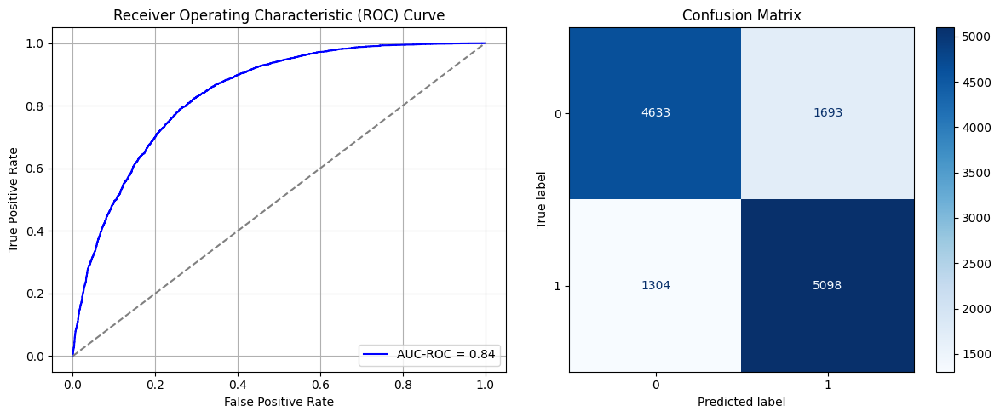

Best threshold based on F1-score: 0.3948279917240143
Time elapsed (performance): 86.21903030899921


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1771 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1772 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1773 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1777 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6909 - loss: 0.6885 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6995 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7001 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7025 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7096 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7091 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7059 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1778 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1779 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1780 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1784 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7081 - loss: 0.6693 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7123 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7174 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7199 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7308 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7131 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7030 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7194 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1785 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1786 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1787 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1791 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.6838 - loss: 0.6934 - val_AUC: 0.0000e+00 - val_loss: 0.7812
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6929 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7156 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6965 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7053 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7187 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6966 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7176 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1792 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1793 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1794 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1798 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6972 - loss: 0.6776 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7065 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7193 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6945 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7093 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6824 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8655
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7155 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7123 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1799 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1800 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1801 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1805 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7037 - loss: 0.6813 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7124 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7194 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9401
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7241 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7102 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7131 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1806 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1807 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1808 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1812 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6955 - loss: 0.6870 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7118 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7080 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.7545
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7120 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7104 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7268 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7185 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1813 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1814 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1815 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1819 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6980 - loss: 0.6902 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7022 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7101 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7082 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7267 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.9165
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7135 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7233 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1820 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1821 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1822 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1826 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6945 - loss: 0.6861 - val_AUC: 0.0000e+00 - val_loss: 0.7563
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6952 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7100 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7057 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7032 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6985 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7133 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7216 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1827 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1828 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1829 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1833 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7054 - loss: 0.6757 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7147 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7046 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7109 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7335 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7007 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7190 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7319 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1834 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1835 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1836 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1840 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - AUC: 0.6930 - loss: 0.6833 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7060 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7072 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6962 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7245 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7179 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7150 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1841 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1842 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1843 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1847 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.7143 - loss: 0.6719 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7062 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7092 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7251 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7052 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7057 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7070 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7093 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1848 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1849 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1850 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1854 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.6863 - loss: 0.6880 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7108 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7196 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7157 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7156 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7198 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7248 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7113 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1855 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1856 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1857 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1861 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7140 - loss: 0.6586 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7030 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7190 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7270 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7043 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7093 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7244 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7137 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7638
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1862 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1863 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1864 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1868 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7122 - loss: 0.6687 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7013 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.7334
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7164 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7103 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7854
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7129 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7018 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6946 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7138 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1869 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1870 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1871 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1875 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6943 - loss: 0.6926 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7081 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7121 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.7479
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7099 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7182 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7170 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7221 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1876 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1877 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1878 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1882 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6948 - loss: 0.6911 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7189 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7193 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6996 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7204 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7191 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7030 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7051 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.7673
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1883 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1884 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1885 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1889 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7047 - loss: 0.6854 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7030 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7146 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7092 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7160 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7200 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6998 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7147 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1890 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1891 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1892 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1896 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7030 - loss: 0.6677 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7238 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7065 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.7894
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7099 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7069 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7090 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7197 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7043 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1897 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1898 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1899 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1903 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.6879 - loss: 0.6798 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6929 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.7915
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7187 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7041 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7181 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7058 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7290 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7121 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1904 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1905 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1906 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1910 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7069 - loss: 0.6720 - val_AUC: 0.0000e+00 - val_loss: 0.7788
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7181 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7058 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7144 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7050 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7127 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7216 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7056 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1911 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1912 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1913 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1917 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - AUC: 0.7867 - loss: 0.5528 - val_AUC: 0.8274 - val_loss: 0.5061
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - AUC: 0.8262 - loss: 0.5055 - val_AUC: 0.8315 - val_loss: 0.5317
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - AUC: 0.8313 - loss: 0.4992 - val_AUC: 0.8322 - val_loss: 0.5060
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.8312 - loss: 0.5003 - val_AUC: 0.8331 - val_loss: 0.4994
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.8310 - loss: 0.4990 - val_AUC: 0.8342 - val_loss: 0.5002
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.8321 - loss: 0.4990 - val_AUC: 0.8327 - val_loss: 0.4997
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - AUC: 0.8387 - loss: 0.4908 - val_AUC: 0.8341 - val_loss: 0.4996
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - AUC: 0.8350 - loss: 0.4955 - val_AUC: 0.8355 - val_loss: 0.4974
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━

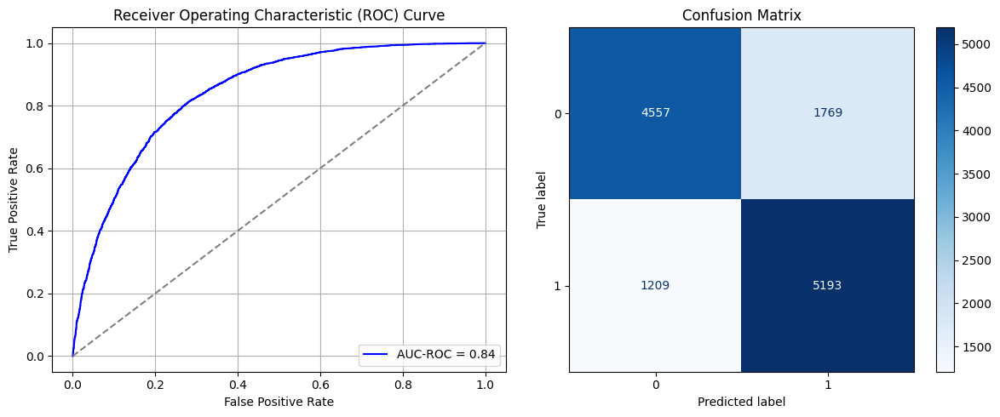

Best threshold based on F1-score: 0.36552488803863525
Time elapsed (performance): 102.58714116400006


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1918 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1919 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1920 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1924 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7085 - loss: 0.6835 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7249 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7298 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7287 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7329 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7216 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7305 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1925 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1926 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1927 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1931 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7026 - loss: 0.7021 - val_AUC: 0.0000e+00 - val_loss: 0.7692
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7213 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7296 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.7580
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7460 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7366 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7388 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1932 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1933 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1934 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1938 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7197 - loss: 0.6807 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7149 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9335
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7324 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7321 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7283 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8190
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7289 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9826
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7284 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7497 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1939 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1940 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1941 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1945 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7044 - loss: 0.6990 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7303 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7314 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7173 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7134 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7511 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7385 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.7594
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7270 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1946 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1947 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1948 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1952 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7111 - loss: 0.6872 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7199 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7281 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7334 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7397 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7298 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7331 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7407 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1953 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1954 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1955 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1959 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.6962 - loss: 0.7048 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7232 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.7820
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7143 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7321 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7508 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7290 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7375 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7334 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1960 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1961 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1962 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1966 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6926 - loss: 0.7055 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7064 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7315 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7223 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7391 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7434 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1967 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1968 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1969 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1973 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6947 - loss: 0.7030 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7159 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7296 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7325 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.7456
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7393 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7391 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7376 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7417 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1974 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1975 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1976 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1980 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7068 - loss: 0.7031 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7125 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7204 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7310 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.7554
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7120 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.7820
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7203 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7325 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7510 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1981 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1982 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1983 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1987 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7045 - loss: 0.6955 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7198 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7134 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7318 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7406 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7384 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7292 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.7890
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7385 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1988 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1989 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1990 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1994 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7123 - loss: 0.6932 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7170 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7186 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7355 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7326
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7418 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7458 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7421 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7675
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7291 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1995 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1996 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1997 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2001 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7235 - loss: 0.6744 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7260 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7250 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7347 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7274 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7302 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7413 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7513 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7494
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2002 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2003 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2008 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7046 - loss: 0.6960 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7171 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7361 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7324 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7252 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7516 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7419 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7305 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2009 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2010 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2015 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7045 - loss: 0.6913 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7229 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7312 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7299 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7266 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7480
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7372
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7459 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7496 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2016 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2017 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2022 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7004 - loss: 0.6992 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7205 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7313 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7414 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7381 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.7793
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7219 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - loss

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2023 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2024 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2029 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.7182 - loss: 0.6813 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7238 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7668
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7439 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7252 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7373 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7365 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7546 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7366 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7312
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2030 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2031 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2036 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7058 - loss: 0.6888 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7203 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7251 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7332 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7393 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7439 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7466 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2037 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2038 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2043 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6934 - loss: 0.7160 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7283 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8013
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7224 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7224 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7314 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7194 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7314 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7343 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7673
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2044 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2045 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2050 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7150 - loss: 0.6871 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7292 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7366 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7289 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7397 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.7678
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7265 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7298 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7272 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9479
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2051 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2052 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2057 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7037 - loss: 0.6991 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7389 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.7472
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7284 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7354 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7394 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.7730
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7275 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7306 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7365 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2058 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2059 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2064 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - AUC: 0.7769 - loss: 0.5588 - val_AUC: 0.8219 - val_loss: 0.5150
Epoch 2/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.8215 - loss: 0.5120 - val_AUC: 0.8273 - val_loss: 0.5058
Epoch 3/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - AUC: 0.8276 - loss: 0.5048 - val_AUC: 0.8323 - val_loss: 0.4991
Epoch 4/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.8274 - loss: 0.5037 - val_AUC: 0.8309 - val_loss: 0.5057
Epoch 5/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.8312 - loss: 0.4998 - val_AUC: 0.8330 - val_loss: 0.5010
Epoch 6/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.8355 - loss: 0.4953 - val_AUC: 0.8336 - val_loss: 0.5126
Epoch 7/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.8364 - loss: 0.4927 - val_AUC: 0.8343 - val_loss: 0.5005
Epoch 8/10
1273/1273 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.8390 - loss: 0.4887 - val_AUC: 0.8347 - val_loss: 0.5010
Epoch 9/10
1273/1273 ━━━━━━━━━━━━━━━

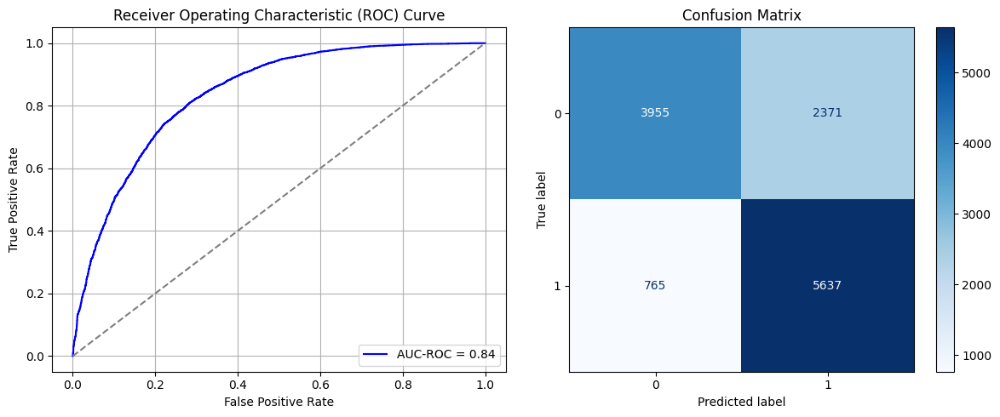

Best threshold based on F1-score: 0.49896013736724854
Time elapsed (performance): 102.72169194800153


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2065 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2066 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2071 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7031 - loss: 0.8141 - val_AUC: 0.0000e+00 - val_loss: 0.7638
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7145 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7225 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.7781
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7279 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7183 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7340 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.7993
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7269 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2072 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2073 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2078 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6950 - loss: 0.8209 - val_AUC: 0.0000e+00 - val_loss: 0.7320
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7194 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7087 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7183 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7225 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7242 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7122 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2079 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2080 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2085 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7024 - loss: 0.8210 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7064 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7198 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7128 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7132 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7334 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7245 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2086 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2087 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2092 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7080 - loss: 0.7989 - val_AUC: 0.0000e+00 - val_loss: 0.7676
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7283 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7366 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7086 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7145 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7083 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7174 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7235 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2093 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2094 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2099 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7016 - loss: 0.8272 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7247 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7291 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7140 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7208 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7149 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7242 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2100 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2101 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2106 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7027 - loss: 0.7965 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7197 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7302 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7915
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7203 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.7679
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7266 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9307
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7350 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7304 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7194 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2107 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2108 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2113 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7013 - loss: 0.8008 - val_AUC: 0.0000e+00 - val_loss: 0.7564
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7281 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7096 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7207 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7070 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7199 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8648
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7114 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7311 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2114 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2115 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2120 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7070 - loss: 0.7987 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7180 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7145 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7223 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7232 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7305 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7355 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7342 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2121 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2122 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2127 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7095 - loss: 0.8334 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7095 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7149 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7068 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7229 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7382 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9215
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7250 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7268 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2128 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2129 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2134 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7210 - loss: 0.7809 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6949 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7114 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7130 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7324 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7163 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.7732
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7373 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7311 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.7695
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2135 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2136 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2141 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7123 - loss: 0.7957 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7151 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7313 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7308 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7163 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7143 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7214 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7191 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.7616
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2142 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2143 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2148 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.6945 - loss: 0.8307 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7051 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.7258
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7188 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7253 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7301 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7159 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7121 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.7669
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7428 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.9367
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2149 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2150 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2155 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6924 - loss: 0.8210 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7035 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7201 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7328 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7132 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7201 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7356 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2156 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2157 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2162 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - AUC: 0.6964 - loss: 0.7935 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7184 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7291 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7131 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7125 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7072 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7241 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7276 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2163 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2164 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2169 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7209 - loss: 0.7941 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7131 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6998 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7118 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7242 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7288 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7253 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7261 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2170 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2171 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2176 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7019 - loss: 0.8084 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7194 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7774
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7271 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7021 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9340
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7239 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7130 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7212 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7359 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2177 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2178 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2183 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7013 - loss: 0.8061 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7189 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7200 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7330 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7310 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7220 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7277 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7276 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2184 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2185 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2190 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7177 - loss: 0.7892 - val_AUC: 0.0000e+00 - val_loss: 0.7624
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7177 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7158 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7167 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7149 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7293 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7257 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7345 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2191 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2192 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2197 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7092 - loss: 0.7982 - val_AUC: 0.0000e+00 - val_loss: 0.7844
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6973 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7223 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7033 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7303 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7258 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7680
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7154 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9421
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7218 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2198 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2199 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2204 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7037 - loss: 0.8046 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 2/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7195 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 3/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7078 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 4/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7052 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 5/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7246 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 6/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7059 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 7/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7236 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 8/10
99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7384 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 9/10
99/99 ━━━━━━━━━━━━━━━━━━━━

In [38]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


In [39]:
print(ParamFit)
ParamFit.to_csv('Sy_multi_Fine_Tuning.csv')

         FPR       FNR
0   0.174715  0.529284
1   0.147498  0.596529
2   0.246708  0.433839
3   0.197981  0.509761
4   0.147059  0.592191
..       ...       ...
95  0.227831  0.483731
96  0.127305  0.672451
97  0.231782  0.481562
98  0.164179  0.603037
99  0.330114  0.353579

[100 rows x 2 columns]


In [40]:
ParamFit['FNR'].mean()

np.float64(0.57941431670282)

# Random Oversampling (ROS):

## Simple Random Sampling with Replacement:

In this case, we investigate the effectiveness of Random Oversampling methods, beginning with Simple Random Sampling (SRS) with replacement. For this, we perform random resampling from the minority class of size $N_1$ to generate an additional sample of size $N_0-N_1$, such that the oversampled minority class will have the same size as the majority class.

In [30]:
X_S_SRS, y_S_SRS = SRSwR_oversampler(data_S_full, data_S_full['Diabetes_binary'])
print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRSwR_oversampler(T_train, T_train[6])
print(y_T_train_SRS)

31820
208165
0         0
1         0
2         0
4         0
5         0
         ..
41447     1
20037     1
174108    1
225124    1
153448    1
Name: Diabetes_binary, Length: 416330, dtype: int64
1964
8992
126273    0.0
191397    0.0
158309    0.0
83510     0.0
194674    0.0
         ... 
250733    1.0
75372     1.0
165418    1.0
110666    1.0
89169     1.0
Name: 6, Length: 17984, dtype: float64


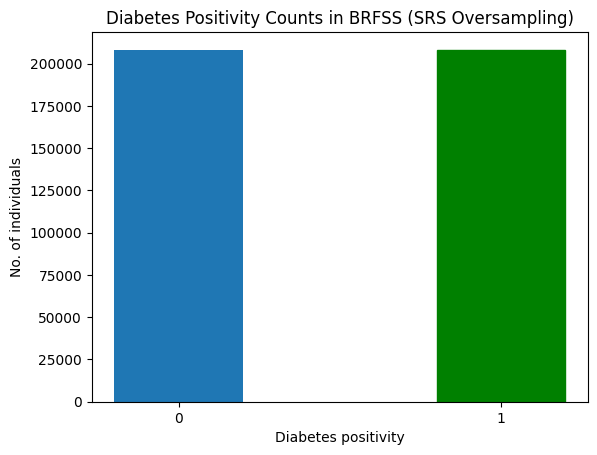

In [31]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Oversampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 45s 5ms/step - AUC: 0.8075 - loss: 0.5290 - val_AUC: 0.8242 - val_loss: 0.5113
Epoch 2/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 85s 5ms/step - AUC: 0.8247 - loss: 0.5081 - val_AUC: 0.8277 - val_loss: 0.5062
Epoch 3/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 80s 5ms/step - AUC: 0.8276 - loss: 0.5046 - val_AUC: 0.8294 - val_loss: 0.5052
Epoch 4/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 45s 5ms/step - AUC: 0.8314 - loss: 0.4997 - val_AUC: 0.8293 - val_loss: 0.5040
Epoch 5/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - AUC: 0.8305 - loss: 0.5004 - val_AUC: 0.8297 - val_loss: 0.5025
Epoch 6/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 47s 6ms/step - AUC: 0.8304 - loss: 0.5003 - val_AUC: 0.8292 - val_loss: 0.5017
Epoch 7/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 79s 5ms/step - AUC: 0.8328 - loss: 0.4973 - val_AUC: 0.8310 - val_loss: 0.5005
Epoch 8/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 78s 5ms/step - AUC: 0.8326 - loss: 0.4970 - val_AUC: 0.8321 - val_loss: 0.4984
Epoch 9/10
8327/8327 ━━━━━━━━━

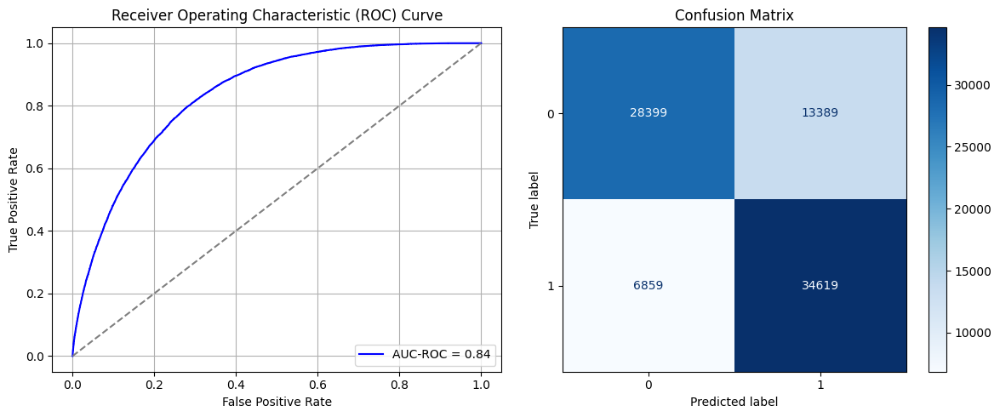

Best threshold based on F1-score: 0.4178927540779114
Time elapsed (performance): 591.7584289790002


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6900 - loss: 0.6675 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6979 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7042 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7140 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7158 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7151 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7145 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - AUC: 0.6920 - loss: 0.6754 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7128 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7100 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7145 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7084 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7124 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7071 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7172 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6883 - loss: 0.6698 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7096 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7068 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7179 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7117 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9199
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7157 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7271 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6867 - loss: 0.6780 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7015 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7061 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7082 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7149 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7153 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7140 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7159 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6850 - loss: 0.6845 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7108 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7059 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7118 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8655
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7071 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7071 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7173 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9031
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6811 - loss: 0.6825 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7059 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7104 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7020 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7139 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7137 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7109 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7137 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6827 - loss: 0.6719 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7116 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7081 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7101 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7241 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7142 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7168 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9272
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_791 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_792 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_793 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_794 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_795 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_796 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_797 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6810 - loss: 0.6829 - val_AUC: 0.0000e+00 - val_loss: 0.8655
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6990 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7075 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7063 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7075 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7185 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7180 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_798 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_799 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_800 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_801 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_802 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_803 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_804 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6808 - loss: 0.6786 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7018 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7004 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7122 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7155 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7119 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7214 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_805 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_806 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_807 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_808 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_809 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_810 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_811 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6834 - loss: 0.6833 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7087 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7085 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7114 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7035 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7067 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7161 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7202 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_815 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_816 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_817 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_818 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6906 - loss: 0.6759 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7029 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7105 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7100 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7154 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7188 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7147 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7119 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_819 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_820 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_821 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_822 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_823 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_824 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_825 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6894 - loss: 0.6714 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7105 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7142 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7092 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7118 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7107 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7161 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7169 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_826 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_827 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_828 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_829 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_830 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_831 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_832 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6919 - loss: 0.6617 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7110 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7082 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7134 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7093 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7112 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7108 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7103 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_833 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_834 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_835 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_836 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_837 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_838 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_839 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6912 - loss: 0.6691 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7030 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7061 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7119 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.7808
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7051 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7184 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7140 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7222 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_841 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_842 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_843 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_844 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_845 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_846 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6848 - loss: 0.6891 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7099 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7155 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7159 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7116 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7224 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7097 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7186 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6799 - loss: 0.6761 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7069 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7142 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7105 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7000 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7148 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7185 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6904 - loss: 0.6724 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6991 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7110 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7101 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8452
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7112 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7171 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.7582
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7107 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7184 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6853 - loss: 0.6787 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7143 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7170 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7202 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7128 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7123 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7103 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7204 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6825 - loss: 0.6797 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7047 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7085 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7077 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7111 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7149 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7160 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7149 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6805 - loss: 0.6799 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7121 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7076 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7106 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7121 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7150 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7183 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7077 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - AUC: 0.8077 - loss: 0.5294 - val_AUC: 0.8247 - val_loss: 0.5200
Epoch 2/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - AUC: 0.8253 - loss: 0.5078 - val_AUC: 0.8253 - val_loss: 0.5073
Epoch 3/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step - AUC: 0.8267 - loss: 0.5052 - val_AUC: 0.8277 - val_loss: 0.5064
Epoch 4/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 40s 5ms/step - AUC: 0.8296 - loss: 0.5020 - val_AUC: 0.8283 - val_loss: 0.5098
Epoch 5/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 40s 5ms/step - AUC: 0.8297 - loss: 0.5010 - val_AUC: 0.8299 - val_loss: 0.5018
Epoch 6/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - AUC: 0.8308 - loss: 0.4998 - val_AUC: 0.8303 - val_loss: 0.5011
Epoch 7/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step - AUC: 0.8316 - loss: 0.4986 - val_AUC: 0.8309 - val_loss: 0.4998
Epoch 8/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step - AUC: 0.8326 - loss: 0.4971 - val_AUC: 0.8320 - val_loss: 0.4973
Epoch 9/10
8327/8327 ━━━━━━━━━

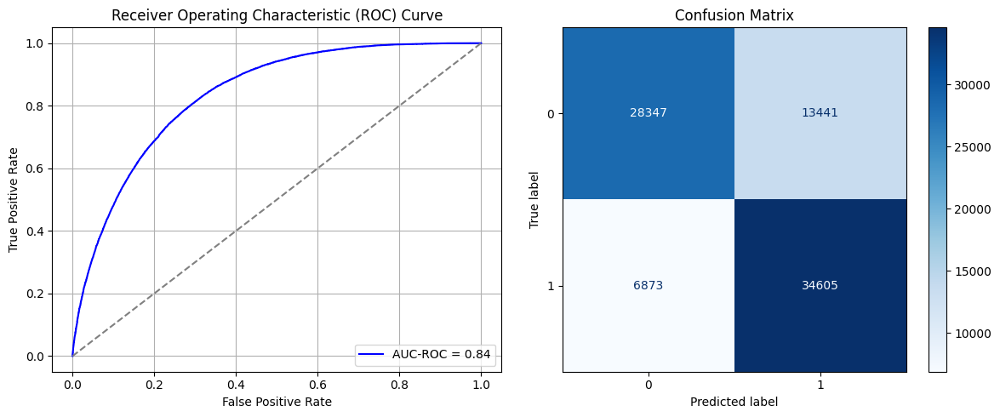

Best threshold based on F1-score: 0.4429353177547455
Time elapsed (performance): 458.9763857369999


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6937 - loss: 0.6639 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7095 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7184 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7145 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7246 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7168 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7214 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7006 - loss: 0.6579 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7066 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7124 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7155 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7169 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7226 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7224 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7266 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6891 - loss: 0.6654 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7058 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7155 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7273 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7245 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7242 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7226 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7181 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.6977 - loss: 0.6539 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7082 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7139 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7201 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7208 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7239 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7282 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7041 - loss: 0.6538 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7191 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7204 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7231 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7253 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7215 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7259 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7257 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7035 - loss: 0.6505 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7163 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7097 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7286 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7205 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7222 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7280 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7300 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6941 - loss: 0.6554 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7161 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7198 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7214 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7227 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7246 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7281 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7219 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7042 - loss: 0.6538 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7105 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7128 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7213 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.7701
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7190 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7239 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7300 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7296 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6965 - loss: 0.6613 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7138 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7140 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7182 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7210 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7234 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7283 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7303 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7027 - loss: 0.6562 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7051 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7161 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7158 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7209 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7206 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7163 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7318 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6950 - loss: 0.6674 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7095 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7054 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7188 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7201 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7214 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7288 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7002 - loss: 0.6575 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7077 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7248 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7211 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7240 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7319 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7207 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7332 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7035 - loss: 0.6500 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7048 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7211 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7221 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7225 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7177 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7278 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7251 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6916 - loss: 0.6680 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7202 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7160 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7214 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7200 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7300 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7258 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7331 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7049 - loss: 0.6476 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7174 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7078 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7250 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7230 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7208 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7270 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7293 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6956 - loss: 0.6541 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7082 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7224 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7129 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7230 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8514
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7337 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7304 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6926 - loss: 0.6628 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7118 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7176 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7224 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7259 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7160 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7292 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7253 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6944 - loss: 0.6648 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7141 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7176 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7210 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7257 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8005
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7182 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7276 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7266 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6997 - loss: 0.6606 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7073 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7154 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7241 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7174 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7266 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.7612
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7206 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7242 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7020 - loss: 0.6587 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7123 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7175 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7121 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7235 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7263 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7239 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7231 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 48s 5ms/step - AUC: 0.8088 - loss: 0.5277 - val_AUC: 0.8246 - val_loss: 0.5080
Epoch 2/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 51s 6ms/step - AUC: 0.8243 - loss: 0.5086 - val_AUC: 0.8280 - val_loss: 0.5058
Epoch 3/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 80s 6ms/step - AUC: 0.8274 - loss: 0.5049 - val_AUC: 0.8292 - val_loss: 0.5044
Epoch 4/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 78s 5ms/step - AUC: 0.8285 - loss: 0.5032 - val_AUC: 0.8303 - val_loss: 0.5022
Epoch 5/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 44s 5ms/step - AUC: 0.8297 - loss: 0.5017 - val_AUC: 0.8288 - val_loss: 0.5124
Epoch 6/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 88s 6ms/step - AUC: 0.8307 - loss: 0.4997 - val_AUC: 0.8313 - val_loss: 0.5000
Epoch 7/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 75s 5ms/step - AUC: 0.8323 - loss: 0.4976 - val_AUC: 0.8316 - val_loss: 0.4996
Epoch 8/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 45s 5ms/step - AUC: 0.8327 - loss: 0.4965 - val_AUC: 0.8322 - val_loss: 0.4978
Epoch 9/10
8327/8327 ━━━━━━━━━

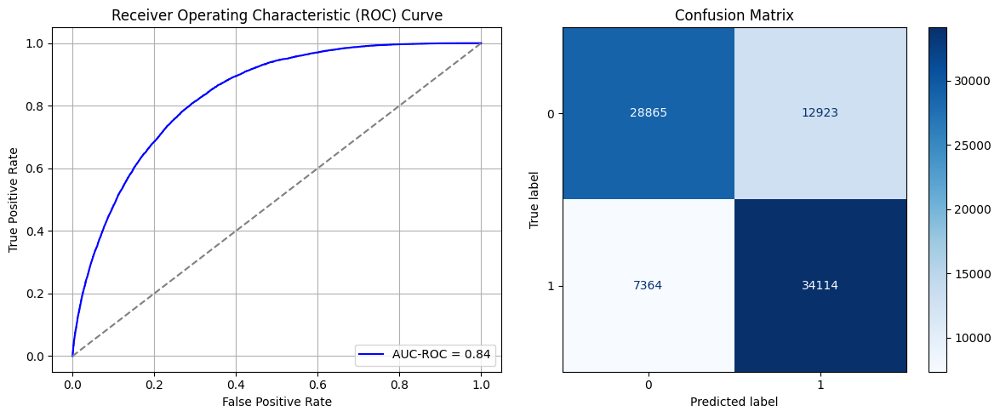

Best threshold based on F1-score: 0.4247859716415405
Time elapsed (performance): 684.1326429999999


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6874 - loss: 0.6733 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7016 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7281 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7263 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7328 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7386 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7434 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6848 - loss: 0.6774 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7175 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7237 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7277 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7437 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7444 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7373 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7396 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6892 - loss: 0.6810 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7134 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7227 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7296 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7365 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7414 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7400 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.7571
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7411 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6824 - loss: 0.6841 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7158 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7202 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7312 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7359 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7384 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7379 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7390 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6926 - loss: 0.6730 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7199 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7226 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7277 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7373 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.7666
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7373 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7456 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7411 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6895 - loss: 0.6712 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7197 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7208 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7330 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7262 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7399 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7370 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7473 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7582
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6889 - loss: 0.6705 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7230 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7278 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7229 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7259 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7392 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7373 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7398 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6867 - loss: 0.6720 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7156 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7276 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7341 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7323 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7740
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7401 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7372 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7440 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6882 - loss: 0.6708 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7181 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7216 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7303 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7383 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7427 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7387 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7452 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.7457
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.6877 - loss: 0.6593 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7056 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7241 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7261 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7308 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7395 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7467
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7383 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7449 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6898 - loss: 0.6740 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7196 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7249 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9031
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7260 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7318 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7397 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7369 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7428 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7481
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6854 - loss: 0.6735 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7195 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7322 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7312 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7369 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7368 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7413 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7462 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6819 - loss: 0.6733 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7178 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7198 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7301 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7397 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7384 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7406 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7417 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6866 - loss: 0.6722 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7159 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7207 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7269 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7337 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7310 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7449 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7427 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7522
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6937 - loss: 0.6684 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7100 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7241 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7271 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7399 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7334 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7409 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7439 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6896 - loss: 0.6680 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7138 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7254 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7325 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7403 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7358 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.6963
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7375 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6863 - loss: 0.6704 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7147 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7270 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7255 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7321 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7363 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7406 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7435 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6889 - loss: 0.6709 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7176 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7240 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7317 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7380 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7369 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7425 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7625
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7433 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6831 - loss: 0.6812 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7138 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7250 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7259 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7361 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7377 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7410 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7451 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6843 - loss: 0.6698 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7083 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7244 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7250 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7356 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7420 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7404 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7757
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7461 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7436
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 58s 6ms/step - AUC: 0.8067 - loss: 0.5295 - val_AUC: 0.8229 - val_loss: 0.5122
Epoch 2/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 49s 6ms/step - AUC: 0.8245 - loss: 0.5085 - val_AUC: 0.8279 - val_loss: 0.5045
Epoch 3/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 49s 6ms/step - AUC: 0.8272 - loss: 0.5053 - val_AUC: 0.8294 - val_loss: 0.5043
Epoch 4/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 81s 6ms/step - AUC: 0.8295 - loss: 0.5022 - val_AUC: 0.8301 - val_loss: 0.5004
Epoch 5/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 50s 6ms/step - AUC: 0.8304 - loss: 0.5007 - val_AUC: 0.8305 - val_loss: 0.5014
Epoch 6/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 49s 6ms/step - AUC: 0.8316 - loss: 0.4985 - val_AUC: 0.8313 - val_loss: 0.4997
Epoch 7/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 84s 6ms/step - AUC: 0.8327 - loss: 0.4973 - val_AUC: 0.8318 - val_loss: 0.4984
Epoch 8/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 85s 6ms/step - AUC: 0.8342 - loss: 0.4946 - val_AUC: 0.8309 - val_loss: 0.4994
Epoch 9/10
8327/8327 ━━━━━━━━━

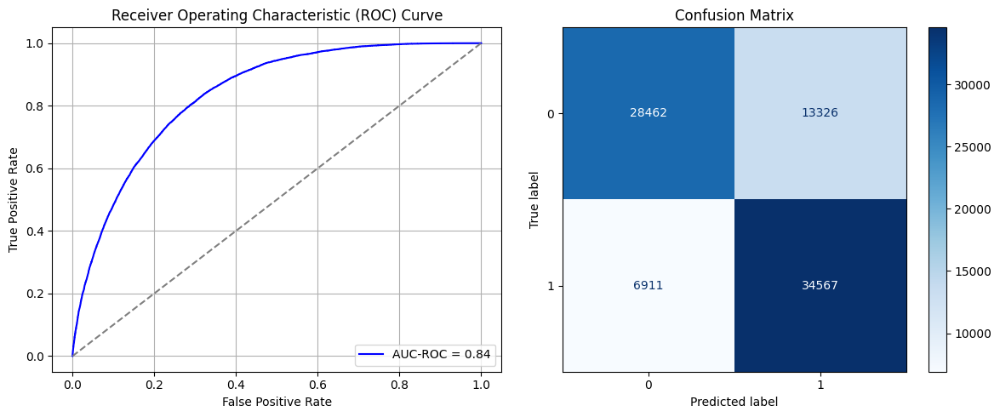

<ipython-input-15-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best threshold based on F1-score: 0.9771897792816162
Time elapsed (performance): 679.3557940030005


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6863 - loss: 0.6624 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7065 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7020 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6939 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7040 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7025 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7075 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6791 - loss: 0.6676 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6921 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6964 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7041 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7028 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6993 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7076 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8784
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6972 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6849 - loss: 0.6660 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6936 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6966 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6994 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7044 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6938 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7027 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7043 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6924 - loss: 0.6576 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6965 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6983 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8389
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6997 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7061 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7016 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - AUC: 0.7000 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - AUC: 0.7100 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 9/10
450/450 ━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6804 - loss: 0.6725 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6977 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6912 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7010 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7080 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7077 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7089 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7084 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6825 - loss: 0.6691 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6977 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7011 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6999 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7076 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7046 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7051 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7030 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6930 - loss: 0.6557 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7021 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6953 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7040 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7092 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7054 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8655
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7025 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7026 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6802 - loss: 0.6743 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6923 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6944 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7079 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6962 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7066 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7066 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7095 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6838 - loss: 0.6674 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6967 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7060 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6998 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6982 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7025 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7054 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7059 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6853 - loss: 0.6700 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6943 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6944 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7088 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7012 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6988 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7020 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7000 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6819 - loss: 0.6696 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6928 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6977 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7000 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6991 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6948 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7071 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7122 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6755 - loss: 0.6743 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6979 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7001 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7041 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7074 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7074 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6996 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6968 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6895 - loss: 0.6584 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6959 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6987 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6957 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6964 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6948 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7097 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7023 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6848 - loss: 0.6589 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6994 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7018 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8648
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7031 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - AUC: 0.6910 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7034 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9307
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7026 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7107 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 9/10
450/450 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6823 - loss: 0.6692 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6941 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6940 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7101 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7043 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7083 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7083 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6999 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6784 - loss: 0.6743 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6892 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7037 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7004 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7009 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7066 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8152
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6995 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7105 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6818 - loss: 0.6685 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6946 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6937 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6922 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7039 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7040 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6999 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7052 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6836 - loss: 0.6683 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6947 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6991 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7029 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6993 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7015 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7078 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6982 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 9/10
450/450 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6815 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7026 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7006 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6998 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6974 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7042 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7037 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - AUC: 0.6749 - loss: 0.6770 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6969 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7021 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6967 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6982 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7019 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7046 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7020 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 9/10
450/450 ━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 64s 7ms/step - AUC: 0.8080 - loss: 0.5285 - val_AUC: 0.8243 - val_loss: 0.5101
Epoch 2/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 64s 8ms/step - AUC: 0.8241 - loss: 0.5090 - val_AUC: 0.8269 - val_loss: 0.5158
Epoch 3/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 85s 8ms/step - AUC: 0.8262 - loss: 0.5070 - val_AUC: 0.8293 - val_loss: 0.5037
Epoch 4/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 79s 8ms/step - AUC: 0.8288 - loss: 0.5030 - val_AUC: 0.8299 - val_loss: 0.5046
Epoch 5/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 64s 8ms/step - AUC: 0.8309 - loss: 0.5007 - val_AUC: 0.8308 - val_loss: 0.5022
Epoch 6/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 64s 8ms/step - AUC: 0.8321 - loss: 0.4985 - val_AUC: 0.8309 - val_loss: 0.5002
Epoch 7/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - AUC: 0.8313 - loss: 0.4990 - val_AUC: 0.8311 - val_loss: 0.5007
Epoch 8/10
8327/8327 ━━━━━━━━━━━━━━━━━━━━ 63s 8ms/step - AUC: 0.8330 - loss: 0.4963 - val_AUC: 0.8325 - val_loss: 0.5022
Epoch 9/10
8327/8327 ━━━━━━━━━

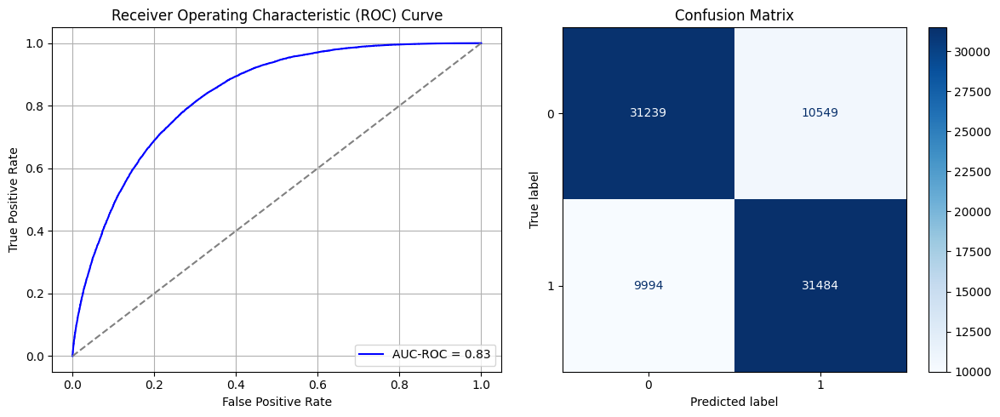

Best threshold based on F1-score: 0.3586743474006653
Time elapsed (performance): 674.347487432


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6938 - loss: 0.6337 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6977 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7125 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7020 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - AUC: 0.7107 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7122 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7086 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - AUC: 0.6903 - loss: 0.6336 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7011 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7129 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7130 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7112 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7156 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7150 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7164 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6910 - loss: 0.6338 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7117 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7127 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7123 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7110 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7195 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7140 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7180 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6867 - loss: 0.6398 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7071 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7107 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7120 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7167 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7100 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7142 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7118 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6947 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7027 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7042 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7080 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7108 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7111 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7122 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7235 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6942 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7113 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7117 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7142 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7163 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7108 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7093 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7166 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6937 - loss: 0.6305 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7038 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7031 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7065 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7100 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7178 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7147 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7161 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6931 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7089 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7092 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7011 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7142 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7184 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7104 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7136 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6929 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7131 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7041 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7074 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7150 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7187 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8106
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7152 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8835
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7165 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7034 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7063 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7069 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7171 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7123 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7113 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7082 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8389
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7053 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6898 - loss: 0.6359 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7154 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7123 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7107 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7077 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7201 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7117 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7143 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6929 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7081 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7113 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7037 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7003 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7075 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7237 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7105 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6952 - loss: 0.6285 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7058 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7105 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7098 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7055 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7187 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9211
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7111 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7118 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6990 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7010 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7156 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7054 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7130 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7126 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7086 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7222 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6978 - loss: 0.6306 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7020 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7100 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7028 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7112 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7110 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7149 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7145 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6894 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7123 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7084 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7115 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7131 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7127 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7109 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7192 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7067 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7167 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7108 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7176 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7111 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7150 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7224 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7182 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6954 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7082 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7143 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9738
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7088 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7151 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7149 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7178 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6936 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7073 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7035 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7129 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7117 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7126 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7100 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8929
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7109 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 9/10
450/450 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6972 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 2/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7133 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 3/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7083 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 4/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7135 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 5/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7159 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 6/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7225 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 7/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7177 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 8/10
450/450 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AU

In [32]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


In [33]:
print(ParamFit)
ParamFit.to_csv('SRS_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.242318  0.485900
1   0.259877  0.457701
2   0.263828  0.433839
3   0.199737  0.544469
4   0.218613  0.516269
..       ...       ...
95  0.143986  0.624729
96  0.130378  0.648590
97  0.188323  0.548807
98  0.100966  0.728850
99  0.112818  0.709328

[100 rows x 2 columns]


In [34]:
ParamFit['FNR'].mean()

np.float64(0.5776355748373103)

## Systematic Resampling:

In this case, we examine the possibility of performing Random Oversampling on the minority class using systematic sampling. For this purpose, taking a sampling interval of $k$, we would compile a total of $k*\frac{N_0-N_1}{N_1}$ systematic samples from the minority class in order to balance the dataset. We sample the starting point from 1 to $k$ *with replacement*, since a highly imbalanced dataset will require sampling with replacement in order to achieve a balanced dataset.

In particular, taking $k=48$ yields a number of samples of $k*\frac{N_0-N_1}{N_1}=266.01 \approx 266$, so we take $k=48$ for the source data resampling. Similarly, we take $k=50$ for the target training data resampling, as this yields a $k*\frac{N_0-N_1}{N_1}=178.92 \approx 179$.

In [41]:
X_S_Sy, y_S_Sy = systematic_resampler(data_S_full, data_S_full['Diabetes_binary'], 48)
# print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_resampler(T_train, T_train[6], 50)
# print(y_T_train_Sy)

31820
208165
Nsamples= 266.01382778126964
1964
8992
Nsamples= 178.9205702647658


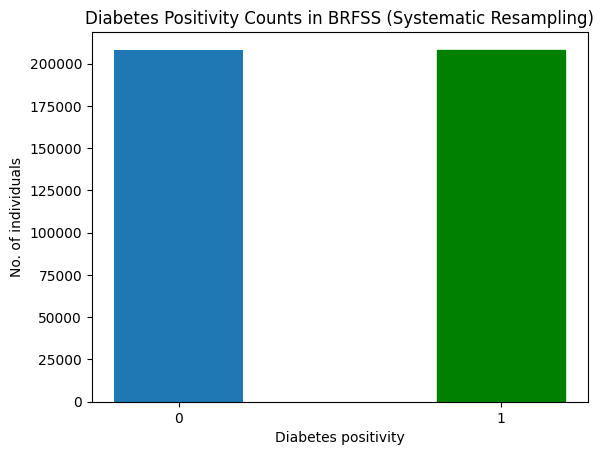

In [42]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Resampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2205 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2206 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2211 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 47s 5ms/step - AUC: 0.8064 - loss: 0.5291 - val_AUC: 0.8266 - val_loss: 0.5073
Epoch 2/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - AUC: 0.8274 - loss: 0.5053 - val_AUC: 0.8277 - val_loss: 0.5084
Epoch 3/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 44s 5ms/step - AUC: 0.8272 - loss: 0.5050 - val_AUC: 0.8285 - val_loss: 0.5052
Epoch 4/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 40s 5ms/step - AUC: 0.8302 - loss: 0.5010 - val_AUC: 0.8296 - val_loss: 0.5021
Epoch 5/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step - AUC: 0.8310 - loss: 0.5001 - val_AUC: 0.8297 - val_loss: 0.5011
Epoch 6/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 40s 5ms/step - AUC: 0.8319 - loss: 0.4985 - val_AUC: 0.8307 - val_loss: 0.4998
Epoch 7/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 40s 5ms/step - AUC: 0.8331 - loss: 0.4964 - val_AUC: 0.8318 - val_loss: 0.4980
Epoch 8/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 40s 5ms/step - AUC: 0.8339 - loss: 0.4952 - val_AUC: 0.8320 - val_loss: 0.4976
Epoch 9/10
8322/8322 ━━━━━━━━━

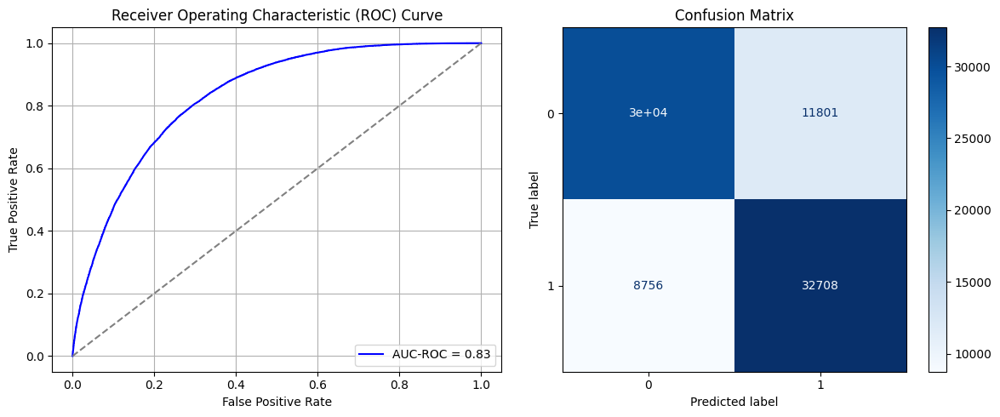

Best threshold based on F1-score: 0.396182656288147
Time elapsed (performance): 424.7890569739993


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2212 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2213 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2218 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6974 - loss: 0.6508 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7334 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7468 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7494 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7457 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7582 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7408 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.7926
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2219 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2220 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2225 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6972 - loss: 0.6499 - val_AUC: 0.0000e+00 - val_loss: 0.7726
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7298 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7443 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7453 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7433 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7461 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.7822
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7440 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7484 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2226 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2227 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2232 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6980 - loss: 0.6470 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7390 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7385 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7516 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7490 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7489 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7489 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7402 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2233 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2234 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2239 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6990 - loss: 0.6551 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7330 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7444 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7402 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7485 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7437 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7511 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7498 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2240 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2241 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2246 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6986 - loss: 0.6514 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7314 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7398 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7490 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7518 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7553 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7403 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7406 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2247 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2248 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2253 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6963 - loss: 0.6521 - val_AUC: 0.0000e+00 - val_loss: 0.7509
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7302 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7389 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.7747
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7451 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7451 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7489 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7356 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7468 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2254 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2255 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2260 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7006 - loss: 0.6506 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7399 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7395 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7375 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7502 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7461
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7462 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7469 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2261 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2262 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2267 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7035 - loss: 0.6375 - val_AUC: 0.0000e+00 - val_loss: 0.7695
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7295 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7363 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8168
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7461 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7520 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7507 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7432 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2268 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2269 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2274 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6913 - loss: 0.6574 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7341 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7456 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7311 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7411 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7510 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7508 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7471 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2275 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2276 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2281 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7053 - loss: 0.6442 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7291 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7485 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7380 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7419 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7482 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7456 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7721
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7456 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.7795
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2282 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2283 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2288 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6887 - loss: 0.6577 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7304 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7414 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7444 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7405 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7482 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7823
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7469 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7568 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2289 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2290 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2295 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6934 - loss: 0.6546 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7304 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7383 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7495 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7369 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7481 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7501 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8356
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2296 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2297 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2302 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6940 - loss: 0.6518 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7320 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7429 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7438 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7699
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7490 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7436 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7504 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2303 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2304 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2309 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6976 - loss: 0.6506 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7375 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7593
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7431 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7549 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7525 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7486 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7445 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7558 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7838
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2310 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2311 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2316 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6918 - loss: 0.6541 - val_AUC: 0.0000e+00 - val_loss: 0.7786
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7316 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.7354
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7424 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7508 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7451 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7373 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7483 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2317 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2318 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2323 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6918 - loss: 0.6595 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7347 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7408 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7484 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7483 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7508 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7463 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7455 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2324 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2325 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2330 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6969 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7280 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7441 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7444 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7432 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7483 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7514 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2331 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2332 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2337 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6976 - loss: 0.6466 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7304 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.7366
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7403 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7423 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7423 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7469 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7540 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7395 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2338 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2339 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2344 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6973 - loss: 0.6486 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7339 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7414 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7452 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7450 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7446 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7472 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7408 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2345 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2346 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2351 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7024 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7315 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7420 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7471 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7442 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7445 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7426 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7703
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2352 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2353 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2358 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 54s 6ms/step - AUC: 0.8084 - loss: 0.5279 - val_AUC: 0.8254 - val_loss: 0.5121
Epoch 2/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 80s 6ms/step - AUC: 0.8255 - loss: 0.5079 - val_AUC: 0.8273 - val_loss: 0.5046
Epoch 3/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 50s 6ms/step - AUC: 0.8287 - loss: 0.5031 - val_AUC: 0.8289 - val_loss: 0.5053
Epoch 4/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 49s 6ms/step - AUC: 0.8304 - loss: 0.5009 - val_AUC: 0.8292 - val_loss: 0.5028
Epoch 5/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 88s 7ms/step - AUC: 0.8315 - loss: 0.4993 - val_AUC: 0.8293 - val_loss: 0.5012
Epoch 6/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 77s 6ms/step - AUC: 0.8316 - loss: 0.4986 - val_AUC: 0.8303 - val_loss: 0.5022
Epoch 7/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 81s 6ms/step - AUC: 0.8329 - loss: 0.4970 - val_AUC: 0.8309 - val_loss: 0.4996
Epoch 8/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 88s 7ms/step - AUC: 0.8338 - loss: 0.4956 - val_AUC: 0.8310 - val_loss: 0.4985
Epoch 9/10
8322/8322 ━━━━━━━━━

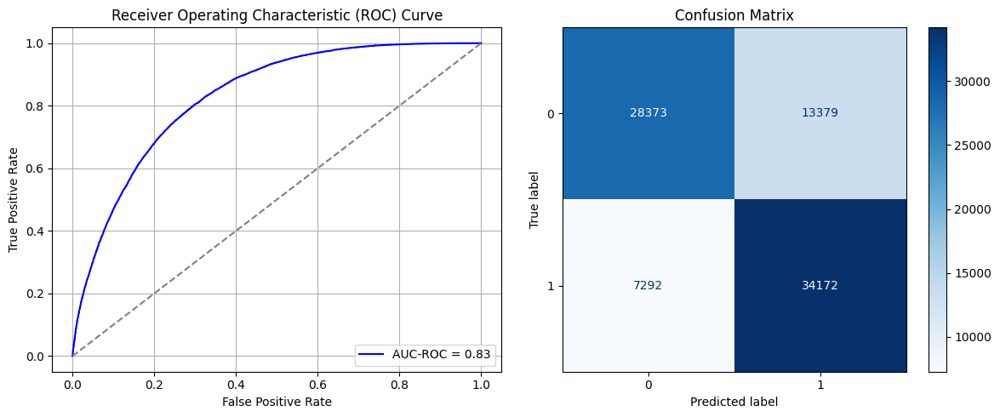

Best threshold based on F1-score: 0.39681512117385864
Time elapsed (performance): 708.9807515369994


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2359 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2360 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2365 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6755 - loss: 0.6589 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6931 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6985 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6953 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6966 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7018 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6926 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2366 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2367 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2372 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6734 - loss: 0.6607 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6889 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7009 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7024 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6992 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7063 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7029 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2373 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2374 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2379 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6729 - loss: 0.6599 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6879 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7003 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7047 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7087 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6948 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7047 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7085 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8356
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2380 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2381 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2386 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6745 - loss: 0.6595 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6960 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.9657
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6924 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6953 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6974 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7009 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7001 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7044 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 1.0067
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2387 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2388 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2393 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6804 - loss: 0.6541 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6936 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6956 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7007 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7072 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7025 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7052 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7060 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2394 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2395 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2400 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6734 - loss: 0.6597 - val_AUC: 0.0000e+00 - val_loss: 0.8454
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6949 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6983 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7019 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7013 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6981 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7037 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7051 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2401 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2402 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2407 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6806 - loss: 0.6533 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6943 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6995 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6956 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7037 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7072 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7092 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9531
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7083 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_344"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2408 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2409 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2413 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2414 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6812 - loss: 0.6524 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6944 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6908 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6913 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7014 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9551
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7106 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7056 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7092 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2415 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2416 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2420 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2421 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6808 - loss: 0.6517 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6983 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6986 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6983 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7054 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6973 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7122 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7102 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2422 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2423 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2427 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2428 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6854 - loss: 0.6471 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6880 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6996 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6982 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6974 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7030 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7138 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7072 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2429 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2430 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2435 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6768 - loss: 0.6563 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6949 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6970 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6945 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7049 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7056 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7059 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7121 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2436 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2437 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2442 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6781 - loss: 0.6513 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6897 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6932 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6992 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6955 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7003 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7098 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7152 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2443 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2444 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2449 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6704 - loss: 0.6681 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6969 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6996 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7007 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6981 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6959 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7082 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7066 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2450 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2451 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2456 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6713 - loss: 0.6606 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6983 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6947 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7062 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7000 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9375
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6997 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7007 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2457 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2458 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2463 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6653 - loss: 0.6676 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6894 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7000 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7051 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7049 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.9609
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6983 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7011 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7094 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.7653
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2464 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2465 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2470 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6767 - loss: 0.6529 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6987 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7003 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6951 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6995 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7103 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7081 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2471 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2472 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2477 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6717 - loss: 0.6647 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6843 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6962 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6995 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6975 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7024 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7063 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7124 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2478 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2479 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2484 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6751 - loss: 0.6574 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6958 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6978 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6951 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6973 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6984 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7048 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7127 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2485 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2486 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2491 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6829 - loss: 0.6481 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6930 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6930 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6997 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7010 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7014 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7090 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7027 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2492 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2493 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2498 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6707 - loss: 0.6585 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6945 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7004 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9537
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6988 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7004 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7025 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7071 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6985 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2499 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2500 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2505 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 59s 7ms/step - AUC: 0.8119 - loss: 0.5242 - val_AUC: 0.8260 - val_loss: 0.5116
Epoch 2/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 80s 6ms/step - AUC: 0.8267 - loss: 0.5061 - val_AUC: 0.8278 - val_loss: 0.5047
Epoch 3/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 58s 7ms/step - AUC: 0.8285 - loss: 0.5036 - val_AUC: 0.8283 - val_loss: 0.5056
Epoch 4/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 53s 6ms/step - AUC: 0.8312 - loss: 0.5003 - val_AUC: 0.8291 - val_loss: 0.5066
Epoch 5/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 85s 7ms/step - AUC: 0.8299 - loss: 0.5012 - val_AUC: 0.8299 - val_loss: 0.5009
Epoch 6/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 82s 7ms/step - AUC: 0.8331 - loss: 0.4974 - val_AUC: 0.8310 - val_loss: 0.5003
Epoch 7/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 80s 7ms/step - AUC: 0.8343 - loss: 0.4952 - val_AUC: 0.8313 - val_loss: 0.5014
Epoch 8/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 57s 7ms/step - AUC: 0.8334 - loss: 0.4957 - val_AUC: 0.8302 - val_loss: 0.5022
Epoch 9/10
8322/8322 ━━━━━━━━━

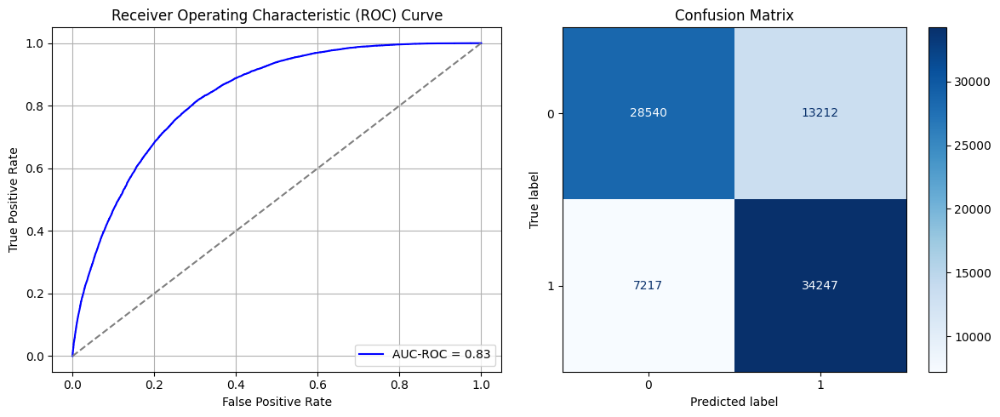

Best threshold based on F1-score: 0.41313087940216064
Time elapsed (performance): 723.7459898790003


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2506 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2507 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2512 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6933 - loss: 0.6578 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7106 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7266 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7412 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7428 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7421 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.7726
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7487 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7492 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2513 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2514 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2519 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - AUC: 0.6875 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - AUC: 0.7121 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7285 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7358 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7415 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - AUC: 0.7396 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.7389 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7459 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 9/10
448/448 ━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2520 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2521 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2526 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - AUC: 0.6781 - loss: 0.6775 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7141 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7304 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9607
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7383 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7474 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.7543
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7515 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7467 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7488 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 9/10
448/448 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2527 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2528 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2533 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.6851 - loss: 0.6688 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7148 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7278 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7362 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7476 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.7398
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - AUC: 0.7412 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7495 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8292
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2534 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2535 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2540 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6906 - loss: 0.6606 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7155 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7276 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7347 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7403 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7441 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7359 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2541 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2542 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2547 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6915 - loss: 0.6591 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7165 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7344 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7426 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.9340
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7395 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7398 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7425 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7477 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2548 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2549 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2554 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - AUC: 0.6863 - loss: 0.6689 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7160 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7342 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7313 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7397 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7480 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7491 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7524 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.7322
Epoch 9/10
448/448 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2555 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2556 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2561 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - AUC: 0.6840 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7267 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7320 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7425 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7537 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7462 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7498 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7508
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7440 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 9/10
448/448 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2562 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2563 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2568 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - AUC: 0.6868 - loss: 0.6675 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7210 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7339 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7434 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7381 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7453 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7495 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2569 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2570 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2575 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6791 - loss: 0.6756 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7146 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7286 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7417 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7413 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.7315
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7474 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7488 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.7764
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7405 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2576 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2577 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2582 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6960 - loss: 0.6603 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7131 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7204 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7380 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7423 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7475 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7369
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7474 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7559
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7479 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2583 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2584 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2589 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6917 - loss: 0.6596 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7097 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7251 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7382 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7450 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7518
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7426 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7409 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2590 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2591 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2596 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6915 - loss: 0.6585 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7116 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7300 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7445 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - AUC: 0.7401 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7482 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7445 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2597 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2598 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2603 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6844 - loss: 0.6738 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7191 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7309 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7460 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7493 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7415 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7535 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7437 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.9306
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2604 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2605 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2610 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6826 - loss: 0.6719 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7108 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7236 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7370 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9469
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7429 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7497 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8086
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7469 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2611 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2612 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2617 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6867 - loss: 0.6670 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7181 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7322 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7309 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.7679
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7504 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7420 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7369 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2618 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2619 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2624 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6899 - loss: 0.6674 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7082 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7295 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7346 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7484 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7499 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7416 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2625 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2626 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2631 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6893 - loss: 0.6724 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - AUC: 0.7079 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7319 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7437 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.7955
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - AUC: 0.7321 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.7350
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7400 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7379 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7432 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.6976
Epoch 9/10
448/448 ━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2632 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2633 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2638 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - AUC: 0.6870 - loss: 0.6660 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7196 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7337 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7378 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9854
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7393 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7460 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7478 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2639 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2640 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2645 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6884 - loss: 0.6605 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7077 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7276 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7411 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7441 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7464 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7527
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7466 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.7767
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2646 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2647 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2652 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 75s 8ms/step - AUC: 0.8078 - loss: 0.5289 - val_AUC: 0.8248 - val_loss: 0.5100
Epoch 2/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 71s 9ms/step - AUC: 0.8259 - loss: 0.5062 - val_AUC: 0.8274 - val_loss: 0.5065
Epoch 3/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 67s 8ms/step - AUC: 0.8293 - loss: 0.5023 - val_AUC: 0.8285 - val_loss: 0.5115
Epoch 4/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 78s 8ms/step - AUC: 0.8301 - loss: 0.5012 - val_AUC: 0.8293 - val_loss: 0.5057
Epoch 5/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 87s 8ms/step - AUC: 0.8312 - loss: 0.5000 - val_AUC: 0.8300 - val_loss: 0.5005
Epoch 6/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 82s 8ms/step - AUC: 0.8324 - loss: 0.4974 - val_AUC: 0.8296 - val_loss: 0.5010
Epoch 7/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 84s 8ms/step - AUC: 0.8324 - loss: 0.4972 - val_AUC: 0.8312 - val_loss: 0.4983
Epoch 8/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 75s 8ms/step - AUC: 0.8346 - loss: 0.4940 - val_AUC: 0.8315 - val_loss: 0.4985
Epoch 9/10
8322/8322 ━━━━━━━━━

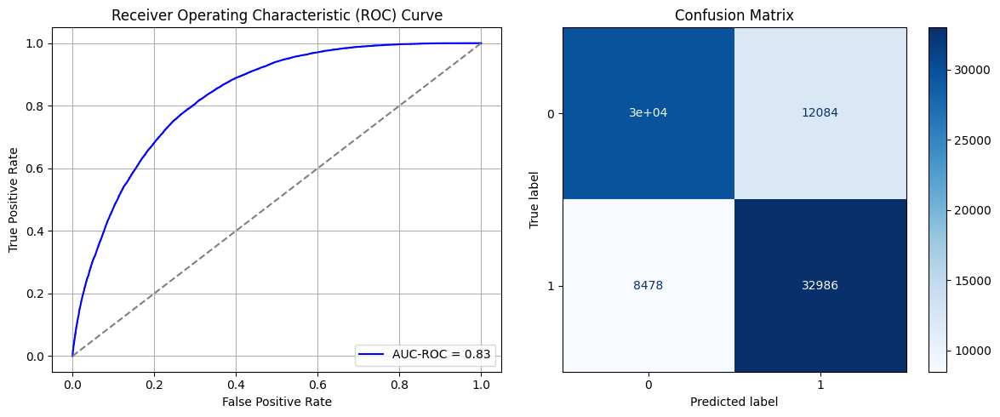

Best threshold based on F1-score: 0.3884422183036804
Time elapsed (performance): 791.5423452410014


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2653 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2654 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2659 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6970 - loss: 0.6402 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7162 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7213 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7180 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7189 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7280 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7324 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2660 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2661 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2666 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.6821 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7127 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7236 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7177 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7256 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7369 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7331 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7386 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2667 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2668 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2673 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6883 - loss: 0.6444 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7199 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7283 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7182 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7329 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7289 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7304 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7299 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2674 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2675 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2680 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6925 - loss: 0.6431 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7152 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7224 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7230 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7692
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7281 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7274 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7260 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7363 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2681 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2682 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2687 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6906 - loss: 0.6409 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7183 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7211 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7231 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7204 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7328 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7336 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7268 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2688 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2689 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2694 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7006 - loss: 0.6346 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7185 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7216 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7250 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7270 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7561
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7288 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7311 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.9435
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7226 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2695 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2696 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2701 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6923 - loss: 0.6441 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7269 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7277 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7305 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7292 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8118
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7242 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7257 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2702 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2703 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2708 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6871 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7222 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7217 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7261 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7292 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.7844
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7301 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7374 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7373 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8336
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2709 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2710 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2715 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6982 - loss: 0.6353 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7057 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7186 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7230 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7267 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - AUC: 0.7273 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7353 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2716 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2717 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2722 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6998 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7213 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7200 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7715
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7228 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7252 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7345 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7304 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7375 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2723 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2724 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2729 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6929 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7230 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7233 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7233 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7277 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.7775
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7319 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7281 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2730 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2731 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2736 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6965 - loss: 0.6357 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7137 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7199 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8835
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7234 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7359 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7246 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7297 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7306 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2737 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2738 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2743 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6920 - loss: 0.6307 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7175 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7266 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7290 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7200 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7289 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7295 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7274 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2744 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2745 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2750 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6903 - loss: 0.6440 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7219 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7228 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7233 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7428
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7289 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7370 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7358 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7446 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9149
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2751 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2752 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2757 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6956 - loss: 0.6307 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7184 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7214 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9667
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7312 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7246 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7270 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7252 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7327 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2758 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2759 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2764 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6936 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7215 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7225 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7221 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7268 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.7678
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7307 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7324 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7427 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2765 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2766 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2771 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6897 - loss: 0.6437 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7217 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7307 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7254 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7260 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7735
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7305 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7295 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7531
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7299 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2772 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2773 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2778 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6944 - loss: 0.6401 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7224 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7241 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7320 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7281 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7331 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7309 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7363 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2779 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2780 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2785 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6948 - loss: 0.6421 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7184 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7204 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7281 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9781
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7250 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7382 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7380
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7277 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7816
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2786 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2787 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2792 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6909 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7184 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7159 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7213 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.7459
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7240 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7291 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7238 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7353 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2793 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2794 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2799 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 66s 7ms/step - AUC: 0.8112 - loss: 0.5255 - val_AUC: 0.8255 - val_loss: 0.5111
Epoch 2/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 63s 8ms/step - AUC: 0.8278 - loss: 0.5044 - val_AUC: 0.8277 - val_loss: 0.5055
Epoch 3/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 64s 8ms/step - AUC: 0.8297 - loss: 0.5019 - val_AUC: 0.8292 - val_loss: 0.5044
Epoch 4/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 65s 8ms/step - AUC: 0.8300 - loss: 0.5012 - val_AUC: 0.8298 - val_loss: 0.5032
Epoch 5/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 66s 8ms/step - AUC: 0.8307 - loss: 0.5001 - val_AUC: 0.8296 - val_loss: 0.5106
Epoch 6/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 82s 8ms/step - AUC: 0.8313 - loss: 0.4989 - val_AUC: 0.8305 - val_loss: 0.4996
Epoch 7/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 82s 8ms/step - AUC: 0.8322 - loss: 0.4977 - val_AUC: 0.8314 - val_loss: 0.4991
Epoch 8/10
8322/8322 ━━━━━━━━━━━━━━━━━━━━ 66s 8ms/step - AUC: 0.8341 - loss: 0.4950 - val_AUC: 0.8316 - val_loss: 0.5008
Epoch 9/10
8322/8322 ━━━━━━━━━

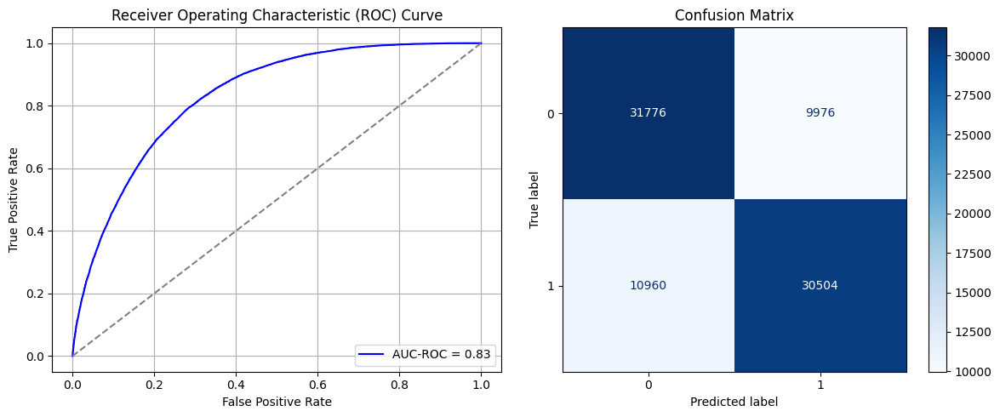

Best threshold based on F1-score: 0.3447347581386566
Time elapsed (performance): 706.2239361539978


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2800 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2801 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2806 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6870 - loss: 0.6549 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7057 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.7622
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7304 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7365 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7270 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7735
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7311 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7399 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7446 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2807 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2808 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2813 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6980 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7141 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7180 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7360 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7380 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7380 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.7844
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7459 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7393 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2814 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2815 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2820 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6847 - loss: 0.6527 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7131 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7259 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7264 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7367 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7390 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7399 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2821 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2822 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2827 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6855 - loss: 0.6506 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7043 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7221 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7312 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7330 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7332 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7338 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2828 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2829 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2834 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6907 - loss: 0.6441 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7131 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7229 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7318 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7421 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7371 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7368 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2835 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2836 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2841 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6831 - loss: 0.6578 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7192 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7225 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7334 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7414 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7486 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7508 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7421 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2842 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2843 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2848 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6885 - loss: 0.6489 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7062 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7261 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7307 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7351 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7352 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7388 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7479 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2849 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2850 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2855 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.6857 - loss: 0.6489 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7124 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7255 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7368 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7302 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7408 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7386 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7346 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2856 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2857 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2862 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - AUC: 0.6869 - loss: 0.6538 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7166 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7247 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7347 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.7311 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7431 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7410 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7511
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7411 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 9/10
448/448 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2863 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2864 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2869 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6923 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7094 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7239 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7370 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7378 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7673
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7478 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7472 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7481 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2870 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2871 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2876 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6948 - loss: 0.6480 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7096 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7226 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7311 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7369 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7715
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7433 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7379 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2877 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2878 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2883 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6871 - loss: 0.6525 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7114 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7248 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7430 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7438 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.7820
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7463 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7638
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7389 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7532 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.9340
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2884 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2885 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2890 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6859 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7088 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7212 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7321 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7366 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7484 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7452 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7422 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2891 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2892 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2897 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6904 - loss: 0.6490 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7066 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7270 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7337 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7418 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7448 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7416 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2898 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2899 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2904 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6944 - loss: 0.6471 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7128 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7295 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7307 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7347 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7404 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7419 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.7644
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7448 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.7820
Epoch 9/10
448/448 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2905 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2906 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2911 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.6878 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7070 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7229 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7274 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7404 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7317 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7450 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7423 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2912 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2913 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2918 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6860 - loss: 0.6545 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7157 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7192 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7273 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7385 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7471 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7492 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7494 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_417"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2919 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2920 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2925 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.6800 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7126 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7209 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7347 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7307 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7435 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7393 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7775
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_418"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2926 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2927 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2932 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.6835 - loss: 0.6548 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7085 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7238 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7627
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7323 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7299 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7426 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7332 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_419"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2933 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2934 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2939 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6886 - loss: 0.6519 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 2/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7115 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 3/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7310 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8007
Epoch 4/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7345 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 5/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7364 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 6/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7439 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 7/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.7414 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7682
Epoch 8/10
448/448 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7448 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.7597
Epoch 9/10
448/448 ━━━━━━━━━━━━━━━━

In [43]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


In [44]:
print(ParamFit)
ParamFit.to_csv('Sy_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.176032  0.518438
1   0.158033  0.542299
2   0.190957  0.492408
3   0.179543  0.514100
4   0.165496  0.531453
..       ...       ...
95  0.176910  0.557484
96  0.183933  0.533623
97  0.092186  0.744035
98  0.210272  0.472885
99  0.200615  0.498915

[100 rows x 2 columns]


In [45]:
ParamFit['FNR'].mean()

np.float64(0.5584381778741865)